## Final Cleaning and Feature Engineering

In [3]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import spacy
from spacymoji import Emoji
nlp = spacy.load("en_core_web_sm")
nlp.add_pipe("emoji", first=True)
doc = nlp('This is a test 😻 👍🏿')

#pen_nef = pd.read_csv('penultimate_nefarious.csv')
#pen_norm = pd.read_csv('penultimate_normal.csv')

In [2]:
pen_nef.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55249 entries, 0 to 55248
Data columns (total 47 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             55249 non-null  int64  
 1   Unnamed: 0.1           55249 non-null  int64  
 2   Unnamed: 0.1.1         55249 non-null  int64  
 3   user_id                55249 non-null  float64
 4   user_handle_x          55249 non-null  object 
 5   created_at_x           55249 non-null  float64
 6   tweet_date             55249 non-null  object 
 7   retweet_count          37010 non-null  float64
 8   retweeted              37010 non-null  object 
 9   favorite_count         37010 non-null  float64
 10  text                   55249 non-null  object 
 11  tweet_id_x             55249 non-null  float64
 12  source                 37010 non-null  object 
 13  hashtags               55249 non-null  object 
 14  expanded_urls          55249 non-null  object 
 15  po

In [3]:
pen_nef[['id', 'user_id']] #these are the same

,id,user_id
0,2.571870e+09,2.571870e+09
1,2.882014e+09,2.882014e+09
2,1.679279e+09,1.679279e+09
3,1.660375e+09,1.660375e+09
4,2.882014e+09,2.882014e+09
...,...,...
55244,1.692501e+09,1.692501e+09
55245,2.943515e+09,2.943515e+09
55246,2.882350e+09,2.882350e+09
55247,2.570017e+09,2.570017e+09


In [4]:
pen_nef['within_range'].value_counts() #Just making sure I can drop this.

True    55249
Name: within_range, dtype: int64

In [5]:
new_nef = pen_nef[['unique_id', 'user_handle_x', 'retweet_count', 'retweeted', 'retweeted_status_id', 'favorite_count', 'text',
                   'p_text', 'source', 'hashtags', 'expanded_urls', 'mentions_y', 'in_reply_to_status_id', 'followers_count', 
                   'statuses_count', 'verified', 'description', 'p_desc', 'favourites_count', 'friends_count', 'listed_count', 
                   'in_reply', 'creation_delta', 'duplicated', 'emoji_count', 'emoji_repeated', 'text_vecs', 'desc_vecs']]

In [31]:
new_nef.rename(columns={'user_handle_x':'user_handle', 'mentions_y': 'mentions'})
#NOTE: If the code below breaks it's probably because this code above either worked or didn't work - it varies

,unique_id,user_handle,retweet_count,retweeted,retweeted_status_id,favorite_count,text,p_text,source,hashtags,...,in_reply,creation_delta,duplicated,emoji_count,emoji_repeated,text_vecs,desc_vecs,troll_tweet,tweet_length,desc_length
0,7.855849423569674e+17detroitdailynew,detroitdailynew,0.0,0,NaN,0.0,"Clinton: Trump should’ve apologized more, atta...","Clinton : Trump should ’ve apologized more , a...","<a href=""http://twitterfeed.com"" rel=""nofollow...",[],...,0,864,0,0.0,0,[-2.54299581e-01 2.08115086e-01 -5.42564988e-...,[-7.22378492e-02 3.59070897e-01 1.65857021e-...,1,79,97
1,7.9130185460915e+17giselleevns,giselleevns,NaN,0,NaN,NaN,"@ModicaGiunta me, too!","Modicagiunta me , too !",NaN,[],...,0,728,0,0.0,0,[-1.34646401e-01 3.14652026e-01 -1.33460000e-...,[-4.47446369e-02 2.51390547e-01 -3.30337495e-...,1,22,72
2,7.925436225288929e+17ameliebaldwin,ameliebaldwin,0.0,1,7.925391e+17,0.0,RT @AriaWilsonGOP: 3 Women Face Charges After ...,RT Ariawilsongop : 3 Women Face Charges After ...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,0,1169,0,0.0,0,[-1.12652123e-01 1.57321408e-01 -1.17146656e-...,[-3.59312855e-02 3.11267316e-01 -1.35997280e-...,1,137,29
3,7.926596780188877e+17ilovesarahrich,ilovesarahrich,0.0,1,7.926490e+17,0.0,"RT @bgg2wl: Walmart, Michelle Obama and The Ha...","RT Bgg2wl : Walmart , Michelle Obama and The H...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,0,1176,0,0.0,0,[-1.10773839e-01 2.16222301e-01 -6.32913113e-...,[ 2.33638939e-02 1.79698288e-01 -1.81564108e-...,1,103,88
4,7.894438400758497e+17giselleevns,giselleevns,NaN,0,NaN,NaN,When I remember it's #Friyay https://t.co/yjBT...,When I remember it's Friyay T,NaN,"[""Friyay""]",...,0,723,0,0.0,0,[ 6.13904074e-02 3.08178574e-01 -2.02425286e-...,[-4.47446369e-02 2.51390547e-01 -3.30337495e-...,1,52,72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55244,7.742783701713347e+17cornellburchet,cornellburchet,0.0,1,7.742741e+17,0.0,"RT @JoyAnnReid: IOW, during the primaries Kell...","RT Joyannreid : IOW , during the primaries Kel...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,0,1113,0,0.0,0,[ 1.19242705e-02 1.58835635e-01 3.90442349e-...,[-7.88898841e-02 8.63750875e-02 -8.04065093e-...,1,140,160
55245,7.811909319281295e+17screamymonkey,screamymonkey,0.0,0,NaN,0.0,#TopNews Senate overwhelmingly rejects Obama v...,TopNews Senate overwhelmingly rejects Obama ve...,"<a href=""http://twitterfeed.com"" rel=""nofollow...","[""TopNews""]",...,0,641,0,0.0,0,[-9.88186374e-02 1.22007817e-01 3.67550552e-...,[ 7.90153369e-02 1.69558331e-01 -4.33810055e-...,1,76,31
55246,7.684619072000573e+17chrixmorgan,chrixmorgan,0.0,1,7.684617e+17,0.0,RT @Goodluckbeer: Fentanyl filled Trump suppor...,RT Goodluckbeer : Fentanyl filled Trump suppor...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...","[""MustBeBanned""]",...,0,664,0,0.0,0,[ 2.09579784e-02 1.54693902e-01 -2.28575412e-...,[-5.73518053e-02 2.25625068e-01 -3.89564008e-...,1,140,37
55247,7.816593719189258e+17onlinememphis,onlinememphis,0.0,0,NaN,0.0,ELECTION GUIDE: Federal and State elections ht...,ELECTION GUIDE : Federal and State elections T,"<a href=""http://twitterfeed.com"" rel=""nofollow...",[],...,0,854,0,0.0,0,[-1.14170499e-01 2.69477516e-02 1.97396249e-...,[-6.70233518e-02 3.25602353e-01 -1.40968829e-...,1,67,103


In [7]:
new_nef['retweeted'] = [int(str(text)[0:2] == "RT") for text in new_nef['text']]
new_nef

<ipython-input-7-9b27ef076325>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_nef['retweeted'] = [int(str(text)[0:2] == "RT") for text in new_nef['text']]


,unique_id,user_handle_x,retweet_count,retweeted,retweeted_status_id,favorite_count,text,p_text,source,hashtags,...,favourites_count,friends_count,listed_count,in_reply,creation_delta,duplicated,emoji_count,emoji_repeated,text_vecs,desc_vecs
0,7.855849423569674e+17detroitdailynew,detroitdailynew,0.0,0,NaN,0.0,"Clinton: Trump should’ve apologized more, atta...","Clinton : Trump should ’ve apologized more , a...","<a href=""http://twitterfeed.com"" rel=""nofollow...",[],...,4.0,5144.0,193.0,0,864,0,0.0,0,[-2.54299581e-01 2.08115086e-01 -5.42564988e-...,[-7.22378492e-02 3.59070897e-01 1.65857021e-...
1,7.9130185460915e+17giselleevns,giselleevns,NaN,0,NaN,NaN,"@ModicaGiunta me, too!","Modicagiunta me , too !",NaN,[],...,9122.0,21953.0,113.0,0,728,0,0.0,0,[-1.34646401e-01 3.14652026e-01 -1.33460000e-...,[-4.47446369e-02 2.51390547e-01 -3.30337495e-...
2,7.925436225288929e+17ameliebaldwin,ameliebaldwin,0.0,1,7.925391e+17,0.0,RT @AriaWilsonGOP: 3 Women Face Charges After ...,RT Ariawilsongop : 3 Women Face Charges After ...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,14540.0,1930.0,160.0,0,1169,0,0.0,0,[-1.12652123e-01 1.57321408e-01 -1.17146656e-...,[-3.59312855e-02 3.11267316e-01 -1.35997280e-...
3,7.926596780188877e+17ilovesarahrich,ilovesarahrich,0.0,1,7.926490e+17,0.0,"RT @bgg2wl: Walmart, Michelle Obama and The Ha...","RT Bgg2wl : Walmart , Michelle Obama and The H...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,2021.0,974.0,6.0,0,1176,0,0.0,0,[-1.10773839e-01 2.16222301e-01 -6.32913113e-...,[ 2.33638939e-02 1.79698288e-01 -1.81564108e-...
4,7.894438400758497e+17giselleevns,giselleevns,NaN,0,NaN,NaN,When I remember it's #Friyay https://t.co/yjBT...,When I remember it's Friyay T,NaN,"[""Friyay""]",...,9122.0,21953.0,113.0,0,723,0,0.0,0,[ 6.13904074e-02 3.08178574e-01 -2.02425286e-...,[-4.47446369e-02 2.51390547e-01 -3.30337495e-...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55244,7.742783701713347e+17cornellburchet,cornellburchet,0.0,1,7.742741e+17,0.0,"RT @JoyAnnReid: IOW, during the primaries Kell...","RT Joyannreid : IOW , during the primaries Kel...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,2166.0,720.0,19.0,0,1113,0,0.0,0,[ 1.19242705e-02 1.58835635e-01 3.90442349e-...,[-7.88898841e-02 8.63750875e-02 -8.04065093e-...
55245,7.811909319281295e+17screamymonkey,screamymonkey,0.0,0,NaN,0.0,#TopNews Senate overwhelmingly rejects Obama v...,TopNews Senate overwhelmingly rejects Obama ve...,"<a href=""http://twitterfeed.com"" rel=""nofollow...","[""TopNews""]",...,1165.0,14051.0,44.0,0,641,0,0.0,0,[-9.88186374e-02 1.22007817e-01 3.67550552e-...,[ 7.90153369e-02 1.69558331e-01 -4.33810055e-...
55246,7.684619072000573e+17chrixmorgan,chrixmorgan,0.0,1,7.684617e+17,0.0,RT @Goodluckbeer: Fentanyl filled Trump suppor...,RT Goodluckbeer : Fentanyl filled Trump suppor...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...","[""MustBeBanned""]",...,6268.0,9033.0,97.0,0,664,0,0.0,0,[ 2.09579784e-02 1.54693902e-01 -2.28575412e-...,[-5.73518053e-02 2.25625068e-01 -3.89564008e-...
55247,7.816593719189258e+17onlinememphis,onlinememphis,0.0,0,NaN,0.0,ELECTION GUIDE: Federal and State elections ht...,ELECTION GUIDE : Federal and State elections T,"<a href=""http://twitterfeed.com"" rel=""nofollow...",[],...,3.0,5751.0,113.0,0,854,0,0.0,0,[-1.14170499e-01 2.69477516e-02 1.97396249e-...,[-6.70233518e-02 3.25602353e-01 -1.40968829e-...


In [8]:
new_nef[new_nef['retweeted'] == 0][['retweeted', 'retweeted_status_id']][800:850] 
#This seems like an okay way to do it given it's performing better than the retweeted_status_id column

,retweeted,retweeted_status_id
3716,0,NaN
3719,0,NaN
3729,0,NaN
3737,0,NaN
3742,0,NaN
3770,0,NaN
3775,0,NaN
3789,0,NaN
3790,0,NaN
3792,0,NaN


In [9]:
new_nef['troll_tweet'] = 1
new_nef

<ipython-input-9-03978053193b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_nef['troll_tweet'] = 1


,unique_id,user_handle_x,retweet_count,retweeted,retweeted_status_id,favorite_count,text,p_text,source,hashtags,...,friends_count,listed_count,in_reply,creation_delta,duplicated,emoji_count,emoji_repeated,text_vecs,desc_vecs,troll_tweet
0,7.855849423569674e+17detroitdailynew,detroitdailynew,0.0,0,NaN,0.0,"Clinton: Trump should’ve apologized more, atta...","Clinton : Trump should ’ve apologized more , a...","<a href=""http://twitterfeed.com"" rel=""nofollow...",[],...,5144.0,193.0,0,864,0,0.0,0,[-2.54299581e-01 2.08115086e-01 -5.42564988e-...,[-7.22378492e-02 3.59070897e-01 1.65857021e-...,1
1,7.9130185460915e+17giselleevns,giselleevns,NaN,0,NaN,NaN,"@ModicaGiunta me, too!","Modicagiunta me , too !",NaN,[],...,21953.0,113.0,0,728,0,0.0,0,[-1.34646401e-01 3.14652026e-01 -1.33460000e-...,[-4.47446369e-02 2.51390547e-01 -3.30337495e-...,1
2,7.925436225288929e+17ameliebaldwin,ameliebaldwin,0.0,1,7.925391e+17,0.0,RT @AriaWilsonGOP: 3 Women Face Charges After ...,RT Ariawilsongop : 3 Women Face Charges After ...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,1930.0,160.0,0,1169,0,0.0,0,[-1.12652123e-01 1.57321408e-01 -1.17146656e-...,[-3.59312855e-02 3.11267316e-01 -1.35997280e-...,1
3,7.926596780188877e+17ilovesarahrich,ilovesarahrich,0.0,1,7.926490e+17,0.0,"RT @bgg2wl: Walmart, Michelle Obama and The Ha...","RT Bgg2wl : Walmart , Michelle Obama and The H...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,974.0,6.0,0,1176,0,0.0,0,[-1.10773839e-01 2.16222301e-01 -6.32913113e-...,[ 2.33638939e-02 1.79698288e-01 -1.81564108e-...,1
4,7.894438400758497e+17giselleevns,giselleevns,NaN,0,NaN,NaN,When I remember it's #Friyay https://t.co/yjBT...,When I remember it's Friyay T,NaN,"[""Friyay""]",...,21953.0,113.0,0,723,0,0.0,0,[ 6.13904074e-02 3.08178574e-01 -2.02425286e-...,[-4.47446369e-02 2.51390547e-01 -3.30337495e-...,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55244,7.742783701713347e+17cornellburchet,cornellburchet,0.0,1,7.742741e+17,0.0,"RT @JoyAnnReid: IOW, during the primaries Kell...","RT Joyannreid : IOW , during the primaries Kel...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,720.0,19.0,0,1113,0,0.0,0,[ 1.19242705e-02 1.58835635e-01 3.90442349e-...,[-7.88898841e-02 8.63750875e-02 -8.04065093e-...,1
55245,7.811909319281295e+17screamymonkey,screamymonkey,0.0,0,NaN,0.0,#TopNews Senate overwhelmingly rejects Obama v...,TopNews Senate overwhelmingly rejects Obama ve...,"<a href=""http://twitterfeed.com"" rel=""nofollow...","[""TopNews""]",...,14051.0,44.0,0,641,0,0.0,0,[-9.88186374e-02 1.22007817e-01 3.67550552e-...,[ 7.90153369e-02 1.69558331e-01 -4.33810055e-...,1
55246,7.684619072000573e+17chrixmorgan,chrixmorgan,0.0,1,7.684617e+17,0.0,RT @Goodluckbeer: Fentanyl filled Trump suppor...,RT Goodluckbeer : Fentanyl filled Trump suppor...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...","[""MustBeBanned""]",...,9033.0,97.0,0,664,0,0.0,0,[ 2.09579784e-02 1.54693902e-01 -2.28575412e-...,[-5.73518053e-02 2.25625068e-01 -3.89564008e-...,1
55247,7.816593719189258e+17onlinememphis,onlinememphis,0.0,0,NaN,0.0,ELECTION GUIDE: Federal and State elections ht...,ELECTION GUIDE : Federal and State elections T,"<a href=""http://twitterfeed.com"" rel=""nofollow...",[],...,5751.0,113.0,0,854,0,0.0,0,[-1.14170499e-01 2.69477516e-02 1.97396249e-...,[-6.70233518e-02 3.25602353e-01 -1.40968829e-...,1


In [10]:
pen_norm[['t_retweeted', 't_in_reply_to_status_id']] #This seems backwards - oh it's the wrong column of course it's
#reversed.

,t_retweeted,t_in_reply_to_status_id
0,1,0.000000e+00
1,1,0.000000e+00
2,1,0.000000e+00
3,1,0.000000e+00
4,1,0.000000e+00
...,...,...
12284,1,0.000000e+00
12285,1,0.000000e+00
12286,0,7.892478e+17
12287,1,0.000000e+00


In [11]:
pen_norm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12289 entries, 0 to 12288
Data columns (total 40 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed: 0               12289 non-null  int64  
 1   Unnamed: 0.1             12289 non-null  int64  
 2   t_id                     12289 non-null  int64  
 3   t_text                   12289 non-null  object 
 4   t_created_at             12289 non-null  object 
 5   t_hashtags               12289 non-null  object 
 6   t_mentions               12289 non-null  object 
 7   t_urls                   12289 non-null  object 
 8   t_source                 12289 non-null  object 
 9   t_lang                   12289 non-null  object 
 10  t_favorite_count         12289 non-null  int64  
 11  t_retweet_count          12289 non-null  int64  
 12  t_retweeted              12289 non-null  int64  
 13  t_retweet_status_id      12289 non-null  object 
 14  t_in_reply_to_status_i

In [12]:
pen_norm['retweeted'] = [int(str(text)[0:2] == "RT") for text in pen_norm['t_text']]
#I should just make sure I'm recording the same value here as in the nefarious tweets

In [13]:
pen_norm[['t_retweeted', 't_retweet_status_id', 'retweeted']]
#Okay right - this is right.

,t_retweeted,t_retweet_status_id,retweeted
0,1,763417590257463296,1
1,1,762767195264970754,1
2,1,763192922237988864,1
3,1,762664227408449536,1
4,1,763212860860329984,1
...,...,...,...
12284,1,789162525371801600,1
12285,1,789103604741341184,1
12286,0,None,0
12287,1,789199540867915785,1


In [14]:
new_norm = pen_norm[['t_id', 'user_handle', 't_retweet_count', 'retweeted', 't_favorite_count', 't_text',
                   'text', 't_source', 'hashtags', 'urls', 'mentions', 't_in_reply_to_status_id', 'followers_count', 
                   'user_status_count', 'user_verified', 'user_desc', 'desc', 'user_favorites_count', 'user_friend_count', 
                'user_listed_count','in_reply', 'creation_delta', 'emoji_count', 'emoji_repeated', 'text_vecs', 'desc_vecs']]

In [15]:
new_norm['duplicated'] = 0
new_norm['troll_tweet'] = 0
new_norm

<ipython-input-15-b6a2a80ba363>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_norm['duplicated'] = 0
<ipython-input-15-b6a2a80ba363>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_norm['troll_tweet'] = 0


,t_id,user_handle,t_retweet_count,retweeted,t_favorite_count,t_text,text,t_source,hashtags,urls,...,user_friend_count,user_listed_count,in_reply,creation_delta,emoji_count,emoji_repeated,text_vecs,desc_vecs,duplicated,troll_tweet
0,763431264577728512,ajhtweeting,8,1,0,"RT @jasonfekete: Great read here: In 2007, Tru...","RT Jasonfekete : Great read here : In 2007 , T...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],['https://www.washingtonpost.com/graphics/poli...,...,2662.0,6.0,0.0,1767,0.0,0,[-4.16987538e-02 2.24651024e-01 -8.93573910e-...,[-1.43868655e-01 9.54335257e-02 -1.23130858e-...,0,0
1,763431264061755392,siaayrom,40,1,0,RT @HuffPostBiz: Trump's new economic plan is ...,RT Huffpostbiz : Trump's new economic plan is ...,"<a href=""http://twitter.com/download/android"" ...",[],['http://huff.to/2aAiLE0'],...,1600.0,172.0,0.0,2736,0.0,0,[-1.32953525e-01 2.13327408e-01 -1.21812902e-...,[ 4.54322249e-02 -4.05271910e-02 5.58016635e-...,0,0
2,763431265370505216,RealDeskMan,1063,1,0,"RT @nytopinion: Forget politics, Trump is a di...","RT Nytopinion : Forget politics , Trump is a d...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],['http://nyti.ms/2aErfdk'],...,3736.0,12.0,0.0,210,0.0,0,[-1.07704870e-01 1.41530424e-01 -3.75899039e-...,[-3.86481062e-02 2.49819607e-01 -2.69183457e-...,0,0
3,763431265743802368,wpl1960,557,1,0,RT @newtgingrich: Hillary Clinton snubs police...,RT Newtgingrich : Hillary Clinton snubs police...,"<a href=""http://twitter.com/download/iphone"" r...",[],['http://thehill.com/blogs/ballot-box/presiden...,...,1880.0,22.0,0.0,909,0.0,0,[-1.94718778e-01 1.64236680e-01 1.23007774e-...,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. ...,0,0
4,763431266171645952,hendry118,2,1,0,"RT @dredeyedick: If Trump was ""joking"", why sa...","RT Dredeyedick : If Trump was "" joking "" , why...","<a href=""http://twitter.com/download/iphone"" r...",[],[],...,1917.0,185.0,0.0,1933,0.0,0,[-1.06105380e-01 2.47954100e-01 -8.41307566e-...,[-5.48557639e-02 9.28594097e-02 8.91094133e-...,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12284,789251007490301952,WatchfulHubby,210,1,0,"RT @VICE: Trump's ""nasty woman"" comment is now...","RT Vice : Trump's "" nasty woman "" comment is n...","<a href=""http://www.echofon.com/"" rel=""nofollo...",[],['http://bit.ly/2ec34tZ'],...,727.0,25.0,0.0,2297,0.0,0,[-1.17614873e-01 2.85909325e-01 -1.00672990e-...,[-1.07666612e-01 -2.65085115e-03 -1.69089392e-...,0,0
12285,789251009809899521,BamaJayHayes,1451,1,0,RT @HillaryClinton: Trump wouldn't say if he'l...,RT Hillaryclinton : Trump wouldn't say if he'l...,"<a href=""http://twitter.com/download/android"" ...",[],[],...,8172.0,123.0,0.0,379,0.0,0,[-2.00285353e-02 2.15310574e-01 -9.86146107e-...,[-3.98998298e-02 1.82181150e-01 9.03247762e-...,0,0
12286,789251009491111936,spengjr,0,0,3,@TylerBoliver @NoahCRothman Isn't it odd how t...,Tylerboliver Noahcrothman Isn't it odd how the...,"<a href=""http://twitter.com/#!/download/ipad"" ...",[],[],...,3016.0,17.0,1.0,421,0.0,0,[-5.44184782e-02 1.39632404e-01 -2.80548017e-...,[-1.61039919e-01 2.02472314e-01 -7.20392317e-...,0,0
12287,789251009973329920,LupeMLopez57,85,1,0,"RT @voxdotcom: At a rally on Thursday, Donald ...","RT Voxdotcom : At a rally on Thursday , Donald...","<a href=""http://twitter.com/#!/download/ipad"" ...",[],[],...,1842.0,44.0,0.0,2022,0.0,0,[-9.89627466e-03 1.19335383e-01 8.20662677e-...,[-0.08604326 0.21753643 -0.01998734 0.103206...,0,0


In [16]:
new_norm['tweet_length'] = [len(text) for text in new_norm['t_text']] #On the unprocessed text
new_norm

<ipython-input-16-b5c1af3c36f4>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_norm['tweet_length'] = [len(text) for text in new_norm['t_text']] #On the unprocessed text


,t_id,user_handle,t_retweet_count,retweeted,t_favorite_count,t_text,text,t_source,hashtags,urls,...,user_listed_count,in_reply,creation_delta,emoji_count,emoji_repeated,text_vecs,desc_vecs,duplicated,troll_tweet,tweet_length
0,763431264577728512,ajhtweeting,8,1,0,"RT @jasonfekete: Great read here: In 2007, Tru...","RT Jasonfekete : Great read here : In 2007 , T...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],['https://www.washingtonpost.com/graphics/poli...,...,6.0,0.0,1767,0.0,0,[-4.16987538e-02 2.24651024e-01 -8.93573910e-...,[-1.43868655e-01 9.54335257e-02 -1.23130858e-...,0,0,133
1,763431264061755392,siaayrom,40,1,0,RT @HuffPostBiz: Trump's new economic plan is ...,RT Huffpostbiz : Trump's new economic plan is ...,"<a href=""http://twitter.com/download/android"" ...",[],['http://huff.to/2aAiLE0'],...,172.0,0.0,2736,0.0,0,[-1.32953525e-01 2.13327408e-01 -1.21812902e-...,[ 4.54322249e-02 -4.05271910e-02 5.58016635e-...,0,0,140
2,763431265370505216,RealDeskMan,1063,1,0,"RT @nytopinion: Forget politics, Trump is a di...","RT Nytopinion : Forget politics , Trump is a d...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],['http://nyti.ms/2aErfdk'],...,12.0,0.0,210,0.0,0,[-1.07704870e-01 1.41530424e-01 -3.75899039e-...,[-3.86481062e-02 2.49819607e-01 -2.69183457e-...,0,0,140
3,763431265743802368,wpl1960,557,1,0,RT @newtgingrich: Hillary Clinton snubs police...,RT Newtgingrich : Hillary Clinton snubs police...,"<a href=""http://twitter.com/download/iphone"" r...",[],['http://thehill.com/blogs/ballot-box/presiden...,...,22.0,0.0,909,0.0,0,[-1.94718778e-01 1.64236680e-01 1.23007774e-...,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. ...,0,0,76
4,763431266171645952,hendry118,2,1,0,"RT @dredeyedick: If Trump was ""joking"", why sa...","RT Dredeyedick : If Trump was "" joking "" , why...","<a href=""http://twitter.com/download/iphone"" r...",[],[],...,185.0,0.0,1933,0.0,0,[-1.06105380e-01 2.47954100e-01 -8.41307566e-...,[-5.48557639e-02 9.28594097e-02 8.91094133e-...,0,0,144
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12284,789251007490301952,WatchfulHubby,210,1,0,"RT @VICE: Trump's ""nasty woman"" comment is now...","RT Vice : Trump's "" nasty woman "" comment is n...","<a href=""http://www.echofon.com/"" rel=""nofollo...",[],['http://bit.ly/2ec34tZ'],...,25.0,0.0,2297,0.0,0,[-1.17614873e-01 2.85909325e-01 -1.00672990e-...,[-1.07666612e-01 -2.65085115e-03 -1.69089392e-...,0,0,128
12285,789251009809899521,BamaJayHayes,1451,1,0,RT @HillaryClinton: Trump wouldn't say if he'l...,RT Hillaryclinton : Trump wouldn't say if he'l...,"<a href=""http://twitter.com/download/android"" ...",[],[],...,123.0,0.0,379,0.0,0,[-2.00285353e-02 2.15310574e-01 -9.86146107e-...,[-3.98998298e-02 1.82181150e-01 9.03247762e-...,0,0,140
12286,789251009491111936,spengjr,0,0,3,@TylerBoliver @NoahCRothman Isn't it odd how t...,Tylerboliver Noahcrothman Isn't it odd how the...,"<a href=""http://twitter.com/#!/download/ipad"" ...",[],[],...,17.0,1.0,421,0.0,0,[-5.44184782e-02 1.39632404e-01 -2.80548017e-...,[-1.61039919e-01 2.02472314e-01 -7.20392317e-...,0,0,133
12287,789251009973329920,LupeMLopez57,85,1,0,"RT @voxdotcom: At a rally on Thursday, Donald ...","RT Voxdotcom : At a rally on Thursday , Donald...","<a href=""http://twitter.com/#!/download/ipad"" ...",[],[],...,44.0,0.0,2022,0.0,0,[-9.89627466e-03 1.19335383e-01 8.20662677e-...,[-0.08604326 0.21753643 -0.01998734 0.103206...,0,0,140


In [17]:
new_nef['tweet_length'] = [len(text) for text in new_nef['text']] #On the unprocessed text - named confusingly here
new_nef

<ipython-input-17-449e09710664>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_nef['tweet_length'] = [len(text) for text in new_nef['text']] #On the unprocessed text - named confusingly here


,unique_id,user_handle_x,retweet_count,retweeted,retweeted_status_id,favorite_count,text,p_text,source,hashtags,...,listed_count,in_reply,creation_delta,duplicated,emoji_count,emoji_repeated,text_vecs,desc_vecs,troll_tweet,tweet_length
0,7.855849423569674e+17detroitdailynew,detroitdailynew,0.0,0,NaN,0.0,"Clinton: Trump should’ve apologized more, atta...","Clinton : Trump should ’ve apologized more , a...","<a href=""http://twitterfeed.com"" rel=""nofollow...",[],...,193.0,0,864,0,0.0,0,[-2.54299581e-01 2.08115086e-01 -5.42564988e-...,[-7.22378492e-02 3.59070897e-01 1.65857021e-...,1,79
1,7.9130185460915e+17giselleevns,giselleevns,NaN,0,NaN,NaN,"@ModicaGiunta me, too!","Modicagiunta me , too !",NaN,[],...,113.0,0,728,0,0.0,0,[-1.34646401e-01 3.14652026e-01 -1.33460000e-...,[-4.47446369e-02 2.51390547e-01 -3.30337495e-...,1,22
2,7.925436225288929e+17ameliebaldwin,ameliebaldwin,0.0,1,7.925391e+17,0.0,RT @AriaWilsonGOP: 3 Women Face Charges After ...,RT Ariawilsongop : 3 Women Face Charges After ...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,160.0,0,1169,0,0.0,0,[-1.12652123e-01 1.57321408e-01 -1.17146656e-...,[-3.59312855e-02 3.11267316e-01 -1.35997280e-...,1,137
3,7.926596780188877e+17ilovesarahrich,ilovesarahrich,0.0,1,7.926490e+17,0.0,"RT @bgg2wl: Walmart, Michelle Obama and The Ha...","RT Bgg2wl : Walmart , Michelle Obama and The H...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,6.0,0,1176,0,0.0,0,[-1.10773839e-01 2.16222301e-01 -6.32913113e-...,[ 2.33638939e-02 1.79698288e-01 -1.81564108e-...,1,103
4,7.894438400758497e+17giselleevns,giselleevns,NaN,0,NaN,NaN,When I remember it's #Friyay https://t.co/yjBT...,When I remember it's Friyay T,NaN,"[""Friyay""]",...,113.0,0,723,0,0.0,0,[ 6.13904074e-02 3.08178574e-01 -2.02425286e-...,[-4.47446369e-02 2.51390547e-01 -3.30337495e-...,1,52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55244,7.742783701713347e+17cornellburchet,cornellburchet,0.0,1,7.742741e+17,0.0,"RT @JoyAnnReid: IOW, during the primaries Kell...","RT Joyannreid : IOW , during the primaries Kel...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,19.0,0,1113,0,0.0,0,[ 1.19242705e-02 1.58835635e-01 3.90442349e-...,[-7.88898841e-02 8.63750875e-02 -8.04065093e-...,1,140
55245,7.811909319281295e+17screamymonkey,screamymonkey,0.0,0,NaN,0.0,#TopNews Senate overwhelmingly rejects Obama v...,TopNews Senate overwhelmingly rejects Obama ve...,"<a href=""http://twitterfeed.com"" rel=""nofollow...","[""TopNews""]",...,44.0,0,641,0,0.0,0,[-9.88186374e-02 1.22007817e-01 3.67550552e-...,[ 7.90153369e-02 1.69558331e-01 -4.33810055e-...,1,76
55246,7.684619072000573e+17chrixmorgan,chrixmorgan,0.0,1,7.684617e+17,0.0,RT @Goodluckbeer: Fentanyl filled Trump suppor...,RT Goodluckbeer : Fentanyl filled Trump suppor...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...","[""MustBeBanned""]",...,97.0,0,664,0,0.0,0,[ 2.09579784e-02 1.54693902e-01 -2.28575412e-...,[-5.73518053e-02 2.25625068e-01 -3.89564008e-...,1,140
55247,7.816593719189258e+17onlinememphis,onlinememphis,0.0,0,NaN,0.0,ELECTION GUIDE: Federal and State elections ht...,ELECTION GUIDE : Federal and State elections T,"<a href=""http://twitterfeed.com"" rel=""nofollow...",[],...,113.0,0,854,0,0.0,0,[-1.14170499e-01 2.69477516e-02 1.97396249e-...,[-6.70233518e-02 3.25602353e-01 -1.40968829e-...,1,67


In [25]:
new_norm['user_desc'] = new_norm['user_desc'].fillna('')

<ipython-input-25-feda728c8260>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_norm['user_desc'] = new_norm['user_desc'].fillna('')


In [26]:
new_norm['user_desc'] = new_norm['user_desc'].astype(str)
new_norm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12289 entries, 0 to 12288
Data columns (total 29 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   t_id                     12289 non-null  int64  
 1   user_handle              12289 non-null  object 
 2   t_retweet_count          12289 non-null  int64  
 3   retweeted                12289 non-null  int64  
 4   t_favorite_count         12289 non-null  int64  
 5   t_text                   12289 non-null  object 
 6   text                     12289 non-null  object 
 7   t_source                 12289 non-null  object 
 8   hashtags                 12289 non-null  object 
 9   urls                     12289 non-null  object 
 10  mentions                 12289 non-null  object 
 11  t_in_reply_to_status_id  12289 non-null  float64
 12  followers_count          12289 non-null  float64
 13  user_status_count        12289 non-null  float64
 14  user_verified         

<ipython-input-26-d032b8d0cee2>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_norm['user_desc'] = new_norm['user_desc'].astype(str)


In [27]:
new_norm['desc_length'] = [len(desc) for desc in new_norm['user_desc']] #Unprocessed again
new_norm

<ipython-input-27-388e64d12f66>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_norm['desc_length'] = [len(desc) for desc in new_norm['user_desc']] #Unprocessed again


,t_id,user_handle,t_retweet_count,retweeted,t_favorite_count,t_text,text,t_source,hashtags,urls,...,in_reply,creation_delta,emoji_count,emoji_repeated,text_vecs,desc_vecs,duplicated,troll_tweet,tweet_length,desc_length
0,763431264577728512,ajhtweeting,8,1,0,"RT @jasonfekete: Great read here: In 2007, Tru...","RT Jasonfekete : Great read here : In 2007 , T...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],['https://www.washingtonpost.com/graphics/poli...,...,0.0,1767,0.0,0,[-4.16987538e-02 2.24651024e-01 -8.93573910e-...,[-1.43868655e-01 9.54335257e-02 -1.23130858e-...,0,0,133,152
1,763431264061755392,siaayrom,40,1,0,RT @HuffPostBiz: Trump's new economic plan is ...,RT Huffpostbiz : Trump's new economic plan is ...,"<a href=""http://twitter.com/download/android"" ...",[],['http://huff.to/2aAiLE0'],...,0.0,2736,0.0,0,[-1.32953525e-01 2.13327408e-01 -1.21812902e-...,[ 4.54322249e-02 -4.05271910e-02 5.58016635e-...,0,0,140,132
2,763431265370505216,RealDeskMan,1063,1,0,"RT @nytopinion: Forget politics, Trump is a di...","RT Nytopinion : Forget politics , Trump is a d...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],['http://nyti.ms/2aErfdk'],...,0.0,210,0.0,0,[-1.07704870e-01 1.41530424e-01 -3.75899039e-...,[-3.86481062e-02 2.49819607e-01 -2.69183457e-...,0,0,140,160
3,763431265743802368,wpl1960,557,1,0,RT @newtgingrich: Hillary Clinton snubs police...,RT Newtgingrich : Hillary Clinton snubs police...,"<a href=""http://twitter.com/download/iphone"" r...",[],['http://thehill.com/blogs/ballot-box/presiden...,...,0.0,909,0.0,0,[-1.94718778e-01 1.64236680e-01 1.23007774e-...,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. ...,0,0,76,0
4,763431266171645952,hendry118,2,1,0,"RT @dredeyedick: If Trump was ""joking"", why sa...","RT Dredeyedick : If Trump was "" joking "" , why...","<a href=""http://twitter.com/download/iphone"" r...",[],[],...,0.0,1933,0.0,0,[-1.06105380e-01 2.47954100e-01 -8.41307566e-...,[-5.48557639e-02 9.28594097e-02 8.91094133e-...,0,0,144,79
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12284,789251007490301952,WatchfulHubby,210,1,0,"RT @VICE: Trump's ""nasty woman"" comment is now...","RT Vice : Trump's "" nasty woman "" comment is n...","<a href=""http://www.echofon.com/"" rel=""nofollo...",[],['http://bit.ly/2ec34tZ'],...,0.0,2297,0.0,0,[-1.17614873e-01 2.85909325e-01 -1.00672990e-...,[-1.07666612e-01 -2.65085115e-03 -1.69089392e-...,0,0,128,67
12285,789251009809899521,BamaJayHayes,1451,1,0,RT @HillaryClinton: Trump wouldn't say if he'l...,RT Hillaryclinton : Trump wouldn't say if he'l...,"<a href=""http://twitter.com/download/android"" ...",[],[],...,0.0,379,0.0,0,[-2.00285353e-02 2.15310574e-01 -9.86146107e-...,[-3.98998298e-02 1.82181150e-01 9.03247762e-...,0,0,140,154
12286,789251009491111936,spengjr,0,0,3,@TylerBoliver @NoahCRothman Isn't it odd how t...,Tylerboliver Noahcrothman Isn't it odd how the...,"<a href=""http://twitter.com/#!/download/ipad"" ...",[],[],...,1.0,421,0.0,0,[-5.44184782e-02 1.39632404e-01 -2.80548017e-...,[-1.61039919e-01 2.02472314e-01 -7.20392317e-...,0,0,133,158
12287,789251009973329920,LupeMLopez57,85,1,0,"RT @voxdotcom: At a rally on Thursday, Donald ...","RT Voxdotcom : At a rally on Thursday , Donald...","<a href=""http://twitter.com/#!/download/ipad"" ...",[],[],...,0.0,2022,0.0,0,[-9.89627466e-03 1.19335383e-01 8.20662677e-...,[-0.08604326 0.21753643 -0.01998734 0.103206...,0,0,140,160


In [29]:
new_nef['description'] = new_nef['description'].fillna('')
new_nef['description'] = new_nef['description'].astype(str)
new_nef.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55249 entries, 0 to 55248
Data columns (total 30 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   unique_id              55249 non-null  object 
 1   user_handle_x          55249 non-null  object 
 2   retweet_count          37010 non-null  float64
 3   retweeted              55249 non-null  int64  
 4   retweeted_status_id    29176 non-null  float64
 5   favorite_count         37010 non-null  float64
 6   text                   55249 non-null  object 
 7   p_text                 55249 non-null  object 
 8   source                 37010 non-null  object 
 9   hashtags               55249 non-null  object 
 10  expanded_urls          55249 non-null  object 
 11  mentions_y             55249 non-null  object 
 12  in_reply_to_status_id  49 non-null     float64
 13  followers_count        55249 non-null  float64
 14  statuses_count         55249 non-null  float64
 15  ve

<ipython-input-29-976bad865591>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_nef['description'] = new_nef['description'].fillna('')
<ipython-input-29-976bad865591>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_nef['description'] = new_nef['description'].astype(str)


In [30]:
new_nef['desc_length'] = [len(desc) for desc in new_nef['description']] #Unprocessed again
new_nef

<ipython-input-30-187d0e81cfdb>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_nef['desc_length'] = [len(desc) for desc in new_nef['description']] #Unprocessed again


,unique_id,user_handle_x,retweet_count,retweeted,retweeted_status_id,favorite_count,text,p_text,source,hashtags,...,in_reply,creation_delta,duplicated,emoji_count,emoji_repeated,text_vecs,desc_vecs,troll_tweet,tweet_length,desc_length
0,7.855849423569674e+17detroitdailynew,detroitdailynew,0.0,0,NaN,0.0,"Clinton: Trump should’ve apologized more, atta...","Clinton : Trump should ’ve apologized more , a...","<a href=""http://twitterfeed.com"" rel=""nofollow...",[],...,0,864,0,0.0,0,[-2.54299581e-01 2.08115086e-01 -5.42564988e-...,[-7.22378492e-02 3.59070897e-01 1.65857021e-...,1,79,97
1,7.9130185460915e+17giselleevns,giselleevns,NaN,0,NaN,NaN,"@ModicaGiunta me, too!","Modicagiunta me , too !",NaN,[],...,0,728,0,0.0,0,[-1.34646401e-01 3.14652026e-01 -1.33460000e-...,[-4.47446369e-02 2.51390547e-01 -3.30337495e-...,1,22,72
2,7.925436225288929e+17ameliebaldwin,ameliebaldwin,0.0,1,7.925391e+17,0.0,RT @AriaWilsonGOP: 3 Women Face Charges After ...,RT Ariawilsongop : 3 Women Face Charges After ...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,0,1169,0,0.0,0,[-1.12652123e-01 1.57321408e-01 -1.17146656e-...,[-3.59312855e-02 3.11267316e-01 -1.35997280e-...,1,137,29
3,7.926596780188877e+17ilovesarahrich,ilovesarahrich,0.0,1,7.926490e+17,0.0,"RT @bgg2wl: Walmart, Michelle Obama and The Ha...","RT Bgg2wl : Walmart , Michelle Obama and The H...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,0,1176,0,0.0,0,[-1.10773839e-01 2.16222301e-01 -6.32913113e-...,[ 2.33638939e-02 1.79698288e-01 -1.81564108e-...,1,103,88
4,7.894438400758497e+17giselleevns,giselleevns,NaN,0,NaN,NaN,When I remember it's #Friyay https://t.co/yjBT...,When I remember it's Friyay T,NaN,"[""Friyay""]",...,0,723,0,0.0,0,[ 6.13904074e-02 3.08178574e-01 -2.02425286e-...,[-4.47446369e-02 2.51390547e-01 -3.30337495e-...,1,52,72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55244,7.742783701713347e+17cornellburchet,cornellburchet,0.0,1,7.742741e+17,0.0,"RT @JoyAnnReid: IOW, during the primaries Kell...","RT Joyannreid : IOW , during the primaries Kel...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,0,1113,0,0.0,0,[ 1.19242705e-02 1.58835635e-01 3.90442349e-...,[-7.88898841e-02 8.63750875e-02 -8.04065093e-...,1,140,160
55245,7.811909319281295e+17screamymonkey,screamymonkey,0.0,0,NaN,0.0,#TopNews Senate overwhelmingly rejects Obama v...,TopNews Senate overwhelmingly rejects Obama ve...,"<a href=""http://twitterfeed.com"" rel=""nofollow...","[""TopNews""]",...,0,641,0,0.0,0,[-9.88186374e-02 1.22007817e-01 3.67550552e-...,[ 7.90153369e-02 1.69558331e-01 -4.33810055e-...,1,76,31
55246,7.684619072000573e+17chrixmorgan,chrixmorgan,0.0,1,7.684617e+17,0.0,RT @Goodluckbeer: Fentanyl filled Trump suppor...,RT Goodluckbeer : Fentanyl filled Trump suppor...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...","[""MustBeBanned""]",...,0,664,0,0.0,0,[ 2.09579784e-02 1.54693902e-01 -2.28575412e-...,[-5.73518053e-02 2.25625068e-01 -3.89564008e-...,1,140,37
55247,7.816593719189258e+17onlinememphis,onlinememphis,0.0,0,NaN,0.0,ELECTION GUIDE: Federal and State elections ht...,ELECTION GUIDE : Federal and State elections T,"<a href=""http://twitterfeed.com"" rel=""nofollow...",[],...,0,854,0,0.0,0,[-1.14170499e-01 2.69477516e-02 1.97396249e-...,[-6.70233518e-02 3.25602353e-01 -1.40968829e-...,1,67,103


In [38]:
import ast
new_nef['mentions_y'] = [ast.literal_eval(mention) for mention in new_nef['mentions_y']]
new_nef['mentions_y']

<ipython-input-38-5d92a09a5c35>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_nef['mentions_y'] = [ast.literal_eval(mention) for mention in new_nef['mentions_y']]


0                                []
1                   [@ModicaGiunta]
2                  [@AriaWilsonGOP]
3                         [@bgg2wl]
4                                []
                    ...            
55244    [@JoyAnnReid, @Peachie100]
55245                            []
55246               [@Goodluckbeer]
55247                            []
55248                   [@BuzzFeed]
Name: mentions_y, Length: 55249, dtype: object

In [39]:
for x in new_nef['mentions_y']:
    print(len(x))

0
1
1
1
0
4
1
2
1
8
3
1
3
1
1
1
1
1
1
1
0
1
2
1
1
2
1
1
1
2
1
0
0
2
1
2
1
1
1
1
2
0
1
1
1
1
0
1
1
1
1
1
1
1
0
3
0
1
1
1
1
0
1
0
6
1
2
0
1
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
1
5
1
2
1
1
1
0
1
1
2
1
1
1
1
2
0
1
2
1
1
2
0
1
1
0
1
1
2
2
1
2
2
0
1
2
2
1
1
1
0
0
1
1
1
1
1
1
1
1
2
1
1
1
3
0
2
0
1
1
2
1
1
2
0
1
3
1
1
1
0
0
2
0
1
0
1
1
0
1
1
2
2
2
1
1
1
1
1
0
1
1
0
1
1
1
1
1
1
0
1
0
3
1
1
1
1
1
1
0
3
1
1
1
0
1
0
0
1
1
0
0
0
1
1
1
2
1
0
2
0
1
2
2
2
1
1
1
2
1
1
1
2
1
1
1
1
1
1
1
4
2
1
1
1
0
0
0
1
1
1
1
0
2
8
1
2
1
1
1
0
2
0
0
2
0
1
0
0
1
1
1
1
1
2
1
1
1
1
1
0
1
1
1
3
1
0
3
1
3
1
1
0
1
1
0
1
1
1
0
1
1
1
1
0
1
1
1
1
2
1
1
1
1
1
1
2
1
1
1
1
1
1
2
0
0
1
1
1
2
0
0
1
1
1
1
1
1
1
1
0
1
0
0
1
1
0
1
2
0
1
1
1
0
1
1
1
1
1
3
1
1
2
2
1
0
1
1
1
1
1
1
0
4
1
1
3
1
1
1
1
1
1
1
1
1
0
2
1
0
1
1
1
1
1
0
0
1
1
1
0
1
1
0
1
1
0
1
1
1
10
0
1
1
0
1
1
0
1
3
0
1
1
1
1
3
1
1
1
1
0
2
1
1
6
2
2
1
1
2
1
7
1
1
0
8
1
1
0
1
1
1
1
1
1
1
1
1
2
1
1
1
0
0
2
1
1
2
1
2
0
1
2
1
1
1
1
1
1
1
0
1
2
0
1
1
1
2
3
1
1
1
2
1
2
1
0
1
1
1
0
0
1
1

2
1
3
1
1
2
1
1
6
2
1
0
2
1
2
1
2
0
0
1
1
1
1
1
1
1
1
2
3
2
2
1
1
1
0
1
1
0
0
1
1
0
2
1
1
1
1
0
3
1
0
2
1
1
1
2
1
1
1
1
1
1
2
1
1
1
0
0
1
0
1
5
1
1
0
1
1
5
1
2
1
4
0
1
1
0
2
2
1
0
4
1
0
1
0
2
4
1
1
1
1
3
1
1
1
1
1
1
1
1
1
0
1
1
1
0
0
0
1
2
2
1
2
1
1
1
1
4
3
1
1
1
1
0
1
0
1
0
1
2
1
1
0
1
1
1
1
1
0
0
0
0
1
1
0
1
1
0
0
1
1
1
1
0
1
0
1
1
1
0
0
1
1
2
1
0
0
1
1
1
0
2
1
1
1
1
1
1
3
0
0
1
0
1
0
1
1
1
1
1
1
0
1
2
1
1
2
0
1
1
1
0
1
1
2
0
1
1
0
1
1
1
0
1
0
1
3
0
3
2
1
0
0
1
1
2
1
1
1
1
0
1
3
1
0
1
2
1
0
1
1
0
1
1
0
6
1
1
1
1
1
1
0
1
2
1
1
0
1
1
0
1
2
1
1
1
1
0
7
1
1
1
0
1
1
1
1
1
2
2
1
1
2
1
2
1
1
1
2
1
1
1
4
3
2
1
1
2
1
1
2
1
0
1
0
4
0
1
0
1
1
4
1
1
1
1
0
1
1
8
1
1
1
2
2
1
2
4
1
1
1
1
1
1
1
1
1
1
1
0
3
0
1
1
1
1
1
1
1
1
1
1
1
1
0
2
2
1
1
1
2
0
2
1
0
1
1
0
2
1
0
0
1
1
1
1
1
1
0
2
1
1
1
2
1
0
2
1
1
0
1
1
0
1
3
1
4
3
1
1
1
1
1
1
1
0
2
2
1
1
0
1
0
1
1
1
1
2
1
1
1
1
1
3
1
0
1
1
1
1
1
1
1
1
1
5
1
1
0
4
1
1
1
1
1
1
0
1
1
0
1
2
1
1
1
1
0
2
0
0
1
2
0
1
1
1
0
2
1
1
1
1
2
1
1
0
1
0
1
1
1
2
1
1
1
1
1
1
1
0


0
1
1
1
0
1
1
0
1
1
1
2
1
2
2
1
1
1
2
1
1
1
2
0
0
1
2
1
0
3
1
1
2
0
1
1
0
2
2
2
1
1
0
1
8
1
1
1
2
0
1
1
1
7
3
0
1
1
3
1
1
1
2
0
1
0
1
1
1
1
1
0
1
1
1
1
1
1
1
3
1
0
1
1
2
1
1
1
1
1
1
1
0
1
1
3
1
1
1
2
1
0
1
1
1
1
1
1
0
0
2
2
5
1
3
1
1
0
0
0
1
2
1
0
1
0
5
1
1
1
0
0
1
2
1
1
1
2
1
2
0
1
2
0
1
1
2
1
2
0
2
3
1
0
1
1
1
1
1
2
1
1
1
0
0
1
1
1
1
1
1
1
1
0
1
2
1
1
1
1
2
0
2
3
1
0
1
1
1
1
1
2
1
1
0
1
1
1
0
1
1
1
1
3
1
1
1
1
1
2
1
1
4
1
1
1
1
0
1
2
1
0
0
1
0
0
0
1
1
0
1
1
1
1
1
1
4
0
1
1
1
1
1
1
1
1
0
1
2
0
1
2
0
1
1
0
0
2
1
1
4
1
1
2
0
1
1
1
0
0
1
1
1
1
1
1
1
3
0
1
1
1
1
0
1
1
1
0
1
1
1
1
1
0
3
0
1
0
1
1
2
3
0
1
1
2
1
1
1
2
0
1
0
2
0
1
1
1
0
2
0
2
1
0
1
1
1
1
3
1
1
2
0
2
1
2
1
1
1
1
2
1
0
0
3
1
0
1
3
1
1
1
1
1
1
0
0
1
0
1
0
1
3
0
0
1
0
1
1
0
2
1
1
1
2
1
0
1
1
1
0
1
0
1
1
0
1
0
1
1
2
0
1
1
1
1
4
0
0
1
0
4
0
0
0
1
2
1
1
1
0
1
0
1
0
1
0
2
3
1
0
1
1
1
1
2
1
1
2
1
0
1
1
1
0
1
1
1
1
2
1
3
2
1
0
1
1
1
1
1
1
0
1
2
1
2
0
1
0
1
2
1
0
0
1
1
1
1
1
2
1
1
2
1
1
1
1
1
0
1
1
2
1
1
1
0
2
0
2
2
4
0
2
4
1
1
1
2
1
3


0
2
1
1
1
1
0
1
1
2
1
1
0
1
1
1
2
1
1
0
1
1
1
1
1
0
1
1
0
1
1
1
2
1
1
1
1
1
1
1
0
1
2
3
2
1
2
2
2
0
2
1
1
1
1
0
1
2
3
1
0
4
2
0
1
1
3
0
0
1
1
1
2
0
1
2
1
2
1
11
1
2
2
1
1
1
1
0
2
1
2
1
0
1
2
1
1
0
2
1
1
0
1
1
1
1
1
1
2
1
1
1
0
1
2
1
1
3
0
1
0
0
1
3
1
2
0
3
1
1
2
0
4
1
1
1
2
1
0
1
0
2
1
1
1
1
1
2
1
1
1
1
1
1
3
1
1
2
0
1
0
0
1
1
1
0
1
1
1
1
2
1
2
1
0
1
0
2
1
1
1
1
3
1
1
1
1
5
1
1
2
5
1
1
1
1
1
1
0
1
1
2
1
3
2
2
1
1
1
1
1
1
1
1
2
2
1
3
1
0
4
0
2
1
0
1
1
1
0
1
1
1
1
0
1
4
1
3
0
0
1
1
1
1
6
1
1
1
1
1
2
1
1
3
1
1
2
4
1
2
2
1
0
2
2
1
0
2
1
3
0
2
1
1
0
2
0
1
1
1
1
3
0
1
0
1
1
1
1
2
0
0
2
1
0
2
1
1
1
1
2
1
4
1
2
1
2
1
1
1
1
1
2
1
1
2
1
1
0
0
0
3
2
1
1
2
1
1
1
1
1
1
1
0
1
0
1
1
0
1
2
0
1
0
2
1
1
1
1
3
2
1
1
0
1
1
0
1
2
1
1
1
1
1
1
1
0
1
1
0
1
0
1
0
0
1
0
0
1
0
1
1
1
1
1
0
1
1
1
0
0
1
1
0
1
2
2
3
1
0
1
1
1
1
1
1
1
1
0
1
0
1
2
1
1
1
1
1
2
1
1
0
2
0
0
1
0
0
1
1
1
1
1
0
1
1
1
0
0
1
1
0
1
1
2
0
1
1
1
0
1
1
1
1
2
1
1
1
1
1
1
1
0
2
1
1
1
1
1
1
2
1
1
1
1
0
2
1
7
0
1
2
1
1
1
1
1
2
0
0
1
0
1
1
1
2
1
1
2
0

1
2
1
1
0
2
1
0
1
0
1
1
1
1
1
1
3
1
1
0
1
1
1
1
1
3
0
2
1
1
1
1
2
1
1
1
1
0
2
1
0
1
1
1
1
1
1
2
1
1
0
1
1
1
0
1
1
1
1
2
0
0
1
0
0
1
0
1
1
1
1
0
1
1
1
1
1
0
1
1
1
1
1
2
6
1
1
1
0
2
1
0
3
1
1
1
1
1
0
0
0
1
0
1
1
3
2
0
1
1
1
1
1
1
1
2
1
1
0
2
1
0
1
1
1
1
1
2
0
1
1
2
1
1
0
3
1
1
1
2
1
0
1
2
1
1
0
3
1
0
1
1
1
1
1
1
1
1
1
1
10
0
1
0
0
1
1
0
1
0
1
1
1
1
2
0
1
0
0
0
2
1
2
1
1
1
2
0
1
1
1
1
1
0
0
2
1
1
1
3
1
1
0
1
0
1
1
1
1
0
1
1
1
1
1
1
0
1
1
0
3
1
1
1
1
0
1
1
1
1
0
1
0
1
1
0
9
1
1
1
0
1
0
0
1
1
0
2
1
1
1
1
0
0
1
1
1
0
1
1
1
0
1
1
2
1
1
1
1
2
0
2
1
1
1
1
1
1
2
0
0
0
1
1
0
0
1
1
2
2
1
1
1
1
1
0
0
1
1
1
0
0
2
1
1
2
2
6
3
1
1
1
1
1
0
6
1
0
0
1
1
1
0
1
2
1
1
1
0
0
0
1
2
1
1
1
0
1
0
1
0
2
0
1
2
2
1
1
1
2
1
1
1
2
1
1
1
0
0
3
1
1
1
2
1
0
0
1
0
2
1
1
2
1
0
0
1
1
2
5
1
0
1
1
2
0
0
1
2
1
1
1
1
1
0
1
0
0
0
0
2
3
1
1
1
1
0
1
6
2
1
1
1
2
1
1
0
1
2
0
1
1
2
3
1
2
1
2
1
1
3
1
1
1
1
1
0
1
1
1
1
1
1
2
1
1
1
1
1
1
1
3
0
1
1
1
0
1
2
1
2
1
1
3
2
1
2
1
2
1
1
2
1
0
0
3
1
0
1
1
3
2
1
2
1
3
1
3
1
1
1
1
0
3
0
2
1
0
9
1

0
1
1
1
1
1
4
1
1
1
1
1
1
1
1
2
1
1
2
1
1
1
3
1
2
2
1
1
1
2
1
2
1
1
2
0
1
1
1
1
1
1
2
1
1
1
2
2
1
1
1
1
4
8
1
1
1
2
1
1
1
1
1
1
4
1
1
1
0
2
3
1
0
1
1
1
0
9
2
1
0
1
0
1
1
1
1
1
2
0
1
1
1
1
1
4
1
1
1
3
1
0
1
1
1
0
2
1
1
1
2
1
2
1
2
2
1
0
2
1
2
1
1
2
1
1
1
1
1
1
1
1
1
1
2
1
1
0
1
4
0
1
0
0
1
1
0
2
1
0
0
1
1
1
0
1
6
1
1
1
0
3
1
1
1
1
1
1
1
0
0
0
0
1
1
1
0
1
0
1
0
1
1
1
1
1
1
1
4
1
1
1
0
1
1
0
1
0
1
1
2
2
0
0
1
2
1
0
2
1
3
1
1
1
1
2
1
2
1
1
0
0
3
0
0
1
1
0
1
1
1
3
1
8
1
1
1
1
1
1
0
3
1
0
1
5
4
1
1
1
1
1
1
1
1
0
1
1
1
0
1
0
3
1
1
1
0
1
5
1
2
1
2
1
1
1
1
1
1
1
1
1
0
1
1
0
0
2
0
1
3
1
1
2
1
1
6
1
0
2
1
2
1
1
2
1
1
2
1
1
0
0
1
0
1
1
1
0
1
0
4
0
1
1
0
1
2
1
1
1
8
2
1
1
1
1
1
1
1
1
0
1
2
2
1
1
1
1
1
2
1
1
1
1
1
2
2
5
2
1
2
0
1
0
1
1
1
0
1
2
1
1
1
3
1
1
1
1
1
1
1
3
0
0
1
1
1
4
1
2
1
0
2
0
0
1
1
4
1
1
1
0
0
1
2
0
1
2
3
1
2
1
1
1
0
1
1
1
0
1
0
2
2
1
3
0
1
2
1
0
0
1
2
2
1
1
1
1
1
0
1
1
1
1
0
0
1
0
1
1
0
1
0
1
2
1
0
1
1
1
0
1
1
1
1
1
1
1
1
1
1
1
0
1
1
0
1
1
3
6
0
1
1
1
1
0
1
1
0
2
1
3
1
1
1
1
0
1
1
1


0
1
1
1
1
1
1
1
1
1
0
0
1
1
1
2
4
1
1
1
1
1
1
2
0
0
1
2
4
0
1
2
1
1
1
1
1
1
1
1
2
1
1
2
1
0
1
3
1
1
1
1
0
1
0
1
1
1
1
6
1
1
0
0
0
2
1
1
1
0
1
0
0
1
1
1
1
1
1
3
1
1
1
1
1
1
2
1
1
2
1
0
1
1
1
2
0
1
3
0
1
1
0
7
4
0
1
1
1
0
1
1
1
1
2
1
1
1
1
1
1
0
2
1
1
4
4
1
1
1
1
1
1
1
1
1
0
0
0
0
2
2
0
1
2
1
1
1
0
2
1
1
1
3
0
2
1
1
0
0
1
1
1
3
1
1
1
2
0
1
0
2
1
1
1
2
1
0
1
1
1
1
1
1
1
1
1
1
0
0
1
1
0
1
0
1
1
1
6
2
1
2
0
0
1
1
0
0
0
2
1
1
1
1
1
1
0
1
2
3
1
2
2
1
1
1
1
0
1
1
1
1
1
1
2
0
0
1
1
0
1
1
1
0
1
1
3
0
1
1
1
1
0
2
1
1
2
0
1
1
1
2
1
2
2
1
0
1
0
0
1
0
1
1
1
1
1
1
1
1
1
0
1
2
2
1
0
1
1
1
1
1
0
0
2
1
1
0
4
1
7
0
0
1
2
0
0
1
1
1
1
1
1
1
11
1
2
1
0
0
2
1
1
3
2
0
4
1
1
1
1
1
1
1
1
1
1
1
3
1
1
2
1
3
1
1
0
2
1
1
2
2
1
6
1
0
2
2
1
1
0
0
1
1
5
2
1
1
1
1
0
0
1
1
1
0
0
1
1
1
1
6
1
1
1
0
1
0
1
0
1
1
0
1
1
2
1
1
0
1
1
1
0
1
2
1
1
5
1
0
1
1
1
1
1
3
1
0
1
2
1
1
0
1
2
1
1
1
1
1
7
2
0
7
1
0
2
1
1
1
1
1
1
2
3
1
1
3
1
0
1
0
2
1
1
2
1
1
2
1
0
0
0
0
0
1
0
0
1
1
1
1
0
2
0
1
1
1
1
0
6
1
2
1
0
0
1
1
2
1
1
1
0
1
1
2
1
0
2
1

1
1
1
0
1
1
5
1
1
1
1
1
0
1
1
1
1
1
2
1
1
0
2
1
1
1
4
1
2
1
0
3
1
3
1
1
1
0
1
1
1
0
1
3
1
1
1
1
2
1
1
1
1
1
1
0
1
1
1
1
5
1
1
1
1
1
2
1
1
1
1
1
1
1
1
1
1
5
2
2
2
1
1
1
2
2
2
1
0
1
2
1
1
1
0
1
1
2
1
1
1
1
1
3
1
1
0
4
1
1
1
1
1
1
1
1
1
1
1
2
1
1
1
1
2
1
2
1
2
1
0
1
1
0
1
1
2
1
0
0
2
2
1
1
1
1
1
1
1
0
1
1
1
0
2
1
1
0
0
2
1
1
0
1
1
2
1
0
0
0
2
1
1
2
1
1
1
1
1
0
2
1
1
1
1
7
0
1
0
0
0
1
2
1
1
1
1
1
1
1
1
0
1
1
1
4
1
1
1
1
0
6
1
1
1
4
1
1
1
0
2
0
1
1
1
1
1
1
1
1
2
1
0
1
1
0
9
1
1
1
0
2
1
1
0
2
1
1
1
1
1
1
2
1
1
1
1
0
1
1
1
2
1
1
1
1
0
4
2
1
0
0
1
0
1
1
0
1
1
1
1
0
1
1
2
1
0
2
1
1
1
2
1
2
1
3
2
1
1
0
2
0
1
1
2
1
1
1
1
1
1
1
1
1
1
1
1
9
0
0
3
1
0
0
1
4
1
1
1
0
2
1
1
1
0
0
1
1
1
2
1
0
1
1
0
1
0
0
1
1
1
1
1
1
1
1
1
1
2
1
9
1
0
1
0
0
1
1
0
1
1
1
0
1
1
1
1
0
1
1
1
1
1
2
2
1
1
2
0
2
1
2
0
1
1
1
1
3
2
1
1
1
0
1
0
1
0
1
2
0
1
1
1
0
2
1
0
0
1
1
1
0
1
1
1
0
1
2
1
1
1
0
1
1
0
1
0
2
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
1
1
1
1
1
0
2
1
1
0
0
1
1
0
1
1
1
1
0
1
0
1
1
1
0
1
0
1
0
1
1
1
8
1
1
0
1
6
0
1
2
1
1
1
3
2
1


In [41]:
new_norm['mentions'] = [ast.literal_eval(mention) for mention in new_norm['mentions']]
new_norm['mentions']

<ipython-input-41-4edc79cda528>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_norm['mentions'] = [ast.literal_eval(mention) for mention in new_norm['mentions']]


0                         [jasonfekete]
1                         [HuffPostBiz]
2                          [nytopinion]
3                        [newtgingrich]
4                         [dredeyedick]
                      ...              
12284                            [VICE]
12285                  [HillaryClinton]
12286      [TylerBoliver, NoahCRothman]
12287                       [voxdotcom]
12288    [jennygerene, colbertlateshow]
Name: mentions, Length: 12289, dtype: object

In [42]:
new_nef[['mentions_y', 'text']]

,mentions_y,text
0,[],"Clinton: Trump should’ve apologized more, atta..."
1,[@ModicaGiunta],"@ModicaGiunta me, too!"
2,[@AriaWilsonGOP],RT @AriaWilsonGOP: 3 Women Face Charges After ...
3,[@bgg2wl],"RT @bgg2wl: Walmart, Michelle Obama and The Ha..."
4,[],When I remember it's #Friyay https://t.co/yjBT...
...,...,...
55244,"[@JoyAnnReid, @Peachie100]","RT @JoyAnnReid: IOW, during the primaries Kell..."
55245,[],#TopNews Senate overwhelmingly rejects Obama v...
55246,[@Goodluckbeer],RT @Goodluckbeer: Fentanyl filled Trump suppor...
55247,[],ELECTION GUIDE: Federal and State elections ht...


In [43]:
new_norm[['mentions', 't_text']]

,mentions,t_text
0,[jasonfekete],"RT @jasonfekete: Great read here: In 2007, Tru..."
1,[HuffPostBiz],RT @HuffPostBiz: Trump's new economic plan is ...
2,[nytopinion],"RT @nytopinion: Forget politics, Trump is a di..."
3,[newtgingrich],RT @newtgingrich: Hillary Clinton snubs police...
4,[dredeyedick],"RT @dredeyedick: If Trump was ""joking"", why sa..."
...,...,...
12284,[VICE],"RT @VICE: Trump's ""nasty woman"" comment is now..."
12285,[HillaryClinton],RT @HillaryClinton: Trump wouldn't say if he'l...
12286,"[TylerBoliver, NoahCRothman]",@TylerBoliver @NoahCRothman Isn't it odd how t...
12287,[voxdotcom],"RT @voxdotcom: At a rally on Thursday, Donald ..."


In [44]:
new_nef['mention_count'] = [len(mention) for mention in new_nef['mentions_y']]
new_nef

<ipython-input-44-5bf822948272>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_nef['mention_count'] = [len(mention) for mention in new_nef['mentions_y']]


,unique_id,user_handle_x,retweet_count,retweeted,retweeted_status_id,favorite_count,text,p_text,source,hashtags,...,creation_delta,duplicated,emoji_count,emoji_repeated,text_vecs,desc_vecs,troll_tweet,tweet_length,desc_length,mention_count
0,7.855849423569674e+17detroitdailynew,detroitdailynew,0.0,0,NaN,0.0,"Clinton: Trump should’ve apologized more, atta...","Clinton : Trump should ’ve apologized more , a...","<a href=""http://twitterfeed.com"" rel=""nofollow...",[],...,864,0,0.0,0,[-2.54299581e-01 2.08115086e-01 -5.42564988e-...,[-7.22378492e-02 3.59070897e-01 1.65857021e-...,1,79,97,0
1,7.9130185460915e+17giselleevns,giselleevns,NaN,0,NaN,NaN,"@ModicaGiunta me, too!","Modicagiunta me , too !",NaN,[],...,728,0,0.0,0,[-1.34646401e-01 3.14652026e-01 -1.33460000e-...,[-4.47446369e-02 2.51390547e-01 -3.30337495e-...,1,22,72,1
2,7.925436225288929e+17ameliebaldwin,ameliebaldwin,0.0,1,7.925391e+17,0.0,RT @AriaWilsonGOP: 3 Women Face Charges After ...,RT Ariawilsongop : 3 Women Face Charges After ...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,1169,0,0.0,0,[-1.12652123e-01 1.57321408e-01 -1.17146656e-...,[-3.59312855e-02 3.11267316e-01 -1.35997280e-...,1,137,29,1
3,7.926596780188877e+17ilovesarahrich,ilovesarahrich,0.0,1,7.926490e+17,0.0,"RT @bgg2wl: Walmart, Michelle Obama and The Ha...","RT Bgg2wl : Walmart , Michelle Obama and The H...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,1176,0,0.0,0,[-1.10773839e-01 2.16222301e-01 -6.32913113e-...,[ 2.33638939e-02 1.79698288e-01 -1.81564108e-...,1,103,88,1
4,7.894438400758497e+17giselleevns,giselleevns,NaN,0,NaN,NaN,When I remember it's #Friyay https://t.co/yjBT...,When I remember it's Friyay T,NaN,"[""Friyay""]",...,723,0,0.0,0,[ 6.13904074e-02 3.08178574e-01 -2.02425286e-...,[-4.47446369e-02 2.51390547e-01 -3.30337495e-...,1,52,72,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55244,7.742783701713347e+17cornellburchet,cornellburchet,0.0,1,7.742741e+17,0.0,"RT @JoyAnnReid: IOW, during the primaries Kell...","RT Joyannreid : IOW , during the primaries Kel...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,1113,0,0.0,0,[ 1.19242705e-02 1.58835635e-01 3.90442349e-...,[-7.88898841e-02 8.63750875e-02 -8.04065093e-...,1,140,160,2
55245,7.811909319281295e+17screamymonkey,screamymonkey,0.0,0,NaN,0.0,#TopNews Senate overwhelmingly rejects Obama v...,TopNews Senate overwhelmingly rejects Obama ve...,"<a href=""http://twitterfeed.com"" rel=""nofollow...","[""TopNews""]",...,641,0,0.0,0,[-9.88186374e-02 1.22007817e-01 3.67550552e-...,[ 7.90153369e-02 1.69558331e-01 -4.33810055e-...,1,76,31,0
55246,7.684619072000573e+17chrixmorgan,chrixmorgan,0.0,1,7.684617e+17,0.0,RT @Goodluckbeer: Fentanyl filled Trump suppor...,RT Goodluckbeer : Fentanyl filled Trump suppor...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...","[""MustBeBanned""]",...,664,0,0.0,0,[ 2.09579784e-02 1.54693902e-01 -2.28575412e-...,[-5.73518053e-02 2.25625068e-01 -3.89564008e-...,1,140,37,1
55247,7.816593719189258e+17onlinememphis,onlinememphis,0.0,0,NaN,0.0,ELECTION GUIDE: Federal and State elections ht...,ELECTION GUIDE : Federal and State elections T,"<a href=""http://twitterfeed.com"" rel=""nofollow...",[],...,854,0,0.0,0,[-1.14170499e-01 2.69477516e-02 1.97396249e-...,[-6.70233518e-02 3.25602353e-01 -1.40968829e-...,1,67,103,0


In [45]:
new_norm['mention_count'] = [len(mention) for mention in new_norm['mentions']]
new_norm

<ipython-input-45-77b66b3a34a2>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_norm['mention_count'] = [len(mention) for mention in new_norm['mentions']]


,t_id,user_handle,t_retweet_count,retweeted,t_favorite_count,t_text,text,t_source,hashtags,urls,...,creation_delta,emoji_count,emoji_repeated,text_vecs,desc_vecs,duplicated,troll_tweet,tweet_length,desc_length,mention_count
0,763431264577728512,ajhtweeting,8,1,0,"RT @jasonfekete: Great read here: In 2007, Tru...","RT Jasonfekete : Great read here : In 2007 , T...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],['https://www.washingtonpost.com/graphics/poli...,...,1767,0.0,0,[-4.16987538e-02 2.24651024e-01 -8.93573910e-...,[-1.43868655e-01 9.54335257e-02 -1.23130858e-...,0,0,133,152,1
1,763431264061755392,siaayrom,40,1,0,RT @HuffPostBiz: Trump's new economic plan is ...,RT Huffpostbiz : Trump's new economic plan is ...,"<a href=""http://twitter.com/download/android"" ...",[],['http://huff.to/2aAiLE0'],...,2736,0.0,0,[-1.32953525e-01 2.13327408e-01 -1.21812902e-...,[ 4.54322249e-02 -4.05271910e-02 5.58016635e-...,0,0,140,132,1
2,763431265370505216,RealDeskMan,1063,1,0,"RT @nytopinion: Forget politics, Trump is a di...","RT Nytopinion : Forget politics , Trump is a d...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],['http://nyti.ms/2aErfdk'],...,210,0.0,0,[-1.07704870e-01 1.41530424e-01 -3.75899039e-...,[-3.86481062e-02 2.49819607e-01 -2.69183457e-...,0,0,140,160,1
3,763431265743802368,wpl1960,557,1,0,RT @newtgingrich: Hillary Clinton snubs police...,RT Newtgingrich : Hillary Clinton snubs police...,"<a href=""http://twitter.com/download/iphone"" r...",[],['http://thehill.com/blogs/ballot-box/presiden...,...,909,0.0,0,[-1.94718778e-01 1.64236680e-01 1.23007774e-...,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. ...,0,0,76,0,1
4,763431266171645952,hendry118,2,1,0,"RT @dredeyedick: If Trump was ""joking"", why sa...","RT Dredeyedick : If Trump was "" joking "" , why...","<a href=""http://twitter.com/download/iphone"" r...",[],[],...,1933,0.0,0,[-1.06105380e-01 2.47954100e-01 -8.41307566e-...,[-5.48557639e-02 9.28594097e-02 8.91094133e-...,0,0,144,79,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12284,789251007490301952,WatchfulHubby,210,1,0,"RT @VICE: Trump's ""nasty woman"" comment is now...","RT Vice : Trump's "" nasty woman "" comment is n...","<a href=""http://www.echofon.com/"" rel=""nofollo...",[],['http://bit.ly/2ec34tZ'],...,2297,0.0,0,[-1.17614873e-01 2.85909325e-01 -1.00672990e-...,[-1.07666612e-01 -2.65085115e-03 -1.69089392e-...,0,0,128,67,1
12285,789251009809899521,BamaJayHayes,1451,1,0,RT @HillaryClinton: Trump wouldn't say if he'l...,RT Hillaryclinton : Trump wouldn't say if he'l...,"<a href=""http://twitter.com/download/android"" ...",[],[],...,379,0.0,0,[-2.00285353e-02 2.15310574e-01 -9.86146107e-...,[-3.98998298e-02 1.82181150e-01 9.03247762e-...,0,0,140,154,1
12286,789251009491111936,spengjr,0,0,3,@TylerBoliver @NoahCRothman Isn't it odd how t...,Tylerboliver Noahcrothman Isn't it odd how the...,"<a href=""http://twitter.com/#!/download/ipad"" ...",[],[],...,421,0.0,0,[-5.44184782e-02 1.39632404e-01 -2.80548017e-...,[-1.61039919e-01 2.02472314e-01 -7.20392317e-...,0,0,133,158,2
12287,789251009973329920,LupeMLopez57,85,1,0,"RT @voxdotcom: At a rally on Thursday, Donald ...","RT Voxdotcom : At a rally on Thursday , Donald...","<a href=""http://twitter.com/#!/download/ipad"" ...",[],[],...,2022,0.0,0,[-9.89627466e-03 1.19335383e-01 8.20662677e-...,[-0.08604326 0.21753643 -0.01998734 0.103206...,0,0,140,160,1


In [48]:
new_norm[['hashtags', 'urls']]

,hashtags,urls
0,[],['https://www.washingtonpost.com/graphics/poli...
1,[],['http://huff.to/2aAiLE0']
2,[],['http://nyti.ms/2aErfdk']
3,[],['http://thehill.com/blogs/ballot-box/presiden...
4,[],[]
...,...,...
12284,[],['http://bit.ly/2ec34tZ']
12285,[],[]
12286,[],[]
12287,[],[]


In [51]:
new_nef[['hashtags', 'expanded_urls']]

,hashtags,expanded_urls
0,[],"[""http://detne.ws/2e172jF""]"
1,[],[]
2,[],"[""http://www.Feed24hNews.com/4MzaL""]"
3,[],"[""http://bgg2wl.com/1CDJfQt""]"
4,"[""Friyay""]",[]
...,...,...
55244,[],"[""https://twitter.com/keithellison/status/7742..."
55245,"[""TopNews""]",[]
55246,"[""MustBeBanned""]",[]
55247,[],"[""http://bit.ly/2ddVR9R""]"


In [53]:
new_norm['hashtags'] = [ast.literal_eval(hashtag) for hashtag in new_norm['hashtags']]
new_norm['hashtags']

<ipython-input-53-1563fa192907>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_norm['hashtags'] = [ast.literal_eval(hashtag) for hashtag in new_norm['hashtags']]


0        []
1        []
2        []
3        []
4        []
         ..
12284    []
12285    []
12286    []
12287    []
12288    []
Name: hashtags, Length: 12289, dtype: object

In [54]:
new_nef['hashtags'] = [ast.literal_eval(hashtag) for hashtag in new_nef['hashtags']]
new_nef['hashtags']

<ipython-input-54-6411a84023fa>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_nef['hashtags'] = [ast.literal_eval(hashtag) for hashtag in new_nef['hashtags']]


0                    []
1                    []
2                    []
3                    []
4              [Friyay]
              ...      
55244                []
55245         [TopNews]
55246    [MustBeBanned]
55247                []
55248                []
Name: hashtags, Length: 55249, dtype: object

In [55]:
new_nef['hashtag_count'] = [len(hashtags) for hashtags in new_nef['hashtags']]
new_nef['hashtag_count']

<ipython-input-55-516df8763a94>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_nef['hashtag_count'] = [len(hashtags) for hashtags in new_nef['hashtags']]


0        0
1        0
2        0
3        0
4        1
        ..
55244    0
55245    1
55246    1
55247    0
55248    0
Name: hashtag_count, Length: 55249, dtype: int64

In [56]:
new_norm['hashtag_count'] = [len(hashtags) for hashtags in new_norm['hashtags']]
new_norm['hashtag_count']

<ipython-input-56-7d1ab0c37628>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_norm['hashtag_count'] = [len(hashtags) for hashtags in new_norm['hashtags']]


0        0
1        0
2        0
3        0
4        0
        ..
12284    0
12285    0
12286    0
12287    0
12288    0
Name: hashtag_count, Length: 12289, dtype: int64

In [57]:
for x in new_norm['urls']:
    print(type(x), x)

<class 'str'> ['https://www.washingtonpost.com/graphics/politics/2016-election/trump-lies/']
<class 'str'> ['http://huff.to/2aAiLE0']
<class 'str'> ['http://nyti.ms/2aErfdk']
<class 'str'> ['http://thehill.com/blogs/ballot-box/presidential-races/290586-police-union-clinton-snubbed-us']
<class 'str'> []
<class 'str'> ['http://mobile.nytimes.com/2016/08/10/us/politics/emails-renew-questions-about-clinton-foundation-and-state-dept-overlap.html']
<class 'str'> ['https://www.thenation.com/article/hillary-clintons-embrace-of-kissinger-is-inexcusable/']
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ['http://bit.ly/2bgGwGE']
<class 'str'> ['http://www.breitbart.com/big-journalism/2016/08/10/nbc-news-owned-hillary-clinton/']
<class 'str'> []
<class 'str'> ['https://twitter.com/cnnnewsroom/status/763403181963575296']
<class 'str'> []
<class 'str'> ['http://fb.me/7WtqCRBUg']
<class 'str'> []
<class 'str'> ['https://twitter.com/anniseparker/status/763394011428159488']
<class 'st

<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ['https://twitter.com/huangmiller/status/762865473532796929']
<class 'str'> ['https://twitter.com/PrisonPlanet/status/763412747660906498']
<class 'str'> ['http://video.foxnews.com/v/5078243838001/media-bias-media-has-gone-bat-crap-crazy-over-trump/?#sp=show-clips']
<class 'str'> []
<class 'str'> ['http://fb.me/5gHtBAm1W']
<class 'str'> []
<class 'str'> []
<class 'str'> ['https://twitter.com/OurRevolution2/status/763429730708287492']
<class 'str'> ['http://fxn.ws/2aKPV9O']
<class 'str'> ['https://twitter.com/jeffspross/status/763417354306891784']
<class 'str'> []
<class 'str'> ['https://youtu.be/ZCYI7rppBOE']
<class 'str'> []
<class 'str'> ['http://ow.ly/5nNY503kLf4']
<class 'str'> []
<class 'str'> ['http://ln.is/trofire.com/2016/08/BEreo']
<class 'str'> []
<class 'str'> []
<class 'str'> ['http://nyti.ms/2bhGzhx']
<class 'str'> []
<class 'str'> []
<class '

<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ['https://twitter.com/i/web/status/782631860379742208']
<class 'str'> []
<class 'str'> []
<class 'str'> ['https://twitter.com/benjaminmoser/status/782573237649694720']
<class 'str'> []
<class 'str'> []
<class 'str'> ['http://wapo.st/2dmRN5M']
<class 'str'> []
<class 'str'> []
<class 'str'> ['http://www.huffingtonpost.com/entry/donald-trump-playboy_us_57efc120e4b082aad9bb9a0e?ncid=engmodushpmg00000004']
<class 'str'> []
<class 'str'> ['https://twitter.com/PeterAlexander/status/782611428939337728']
<class 'str'> []
<class 'str'> ['http://wjla.com/news/local/man-paints-black-lives-matter-on-new-trump-hotel-in-dc']
<class 'str'> []
<class 'str'> []
<class 'str'> ['http://politi.co/2dsBOa4']
<class 'str'> []
<class 'str'> ['http://trib.al/F6No07D']
<class 'str'> []
<class 'str'> ['https://twitter.com/stephenswsj/status/782398494925553664']
<class 'str'> ['https://twitter.com/mishacollins/status/780590093497008128']
<class 'str

<class 'str'> []
<class 'str'> []
<class 'str'> ['https://www.washingtonpost.com/news/post-politics/wp/2016/10/15/group-accuses-mike-pence-of-voter-suppression-after-state-police-raid-registration-program-in-indiana/']
<class 'str'> []
<class 'str'> []
<class 'str'> ['https://twitter.com/jaketapper/status/787693183689981952']
<class 'str'> []
<class 'str'> ['https://twitter.com/cecilerichards/status/787689276766949376']
<class 'str'> ['http://ind.pn/2dTBH4b']
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ['https://twitter.com/brianstelter/status/787687570981330944']
<class 'str'> ['http://wpo.st/daY62']
<class 'str'> []
<class 'str'> []
<class 'str'> ['http://on.mtv.com/2ejcgr4']
<class 'str'> []
<class 'str'> []
<class 'str'> ['https://twitter.com/Independent/status/787692583606714368']
<class 'str'> ['https://vine.co/v/iwmqbxlAleb']
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ['http://go.shr.lc/2a68fFw']
<class 'str'> ['http://

<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ['https://twitter.com/sopandeb/status/777550158661844993']
<class 'str'> []
<class 'str'> ['http://washex.am/2cVrgzo']
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ['http://www.nbcnews.com/politics/2016-election/trump-reverses-cuba-wonders-what-happens-if-clinton-security-disarms-n649781']
<class 'str'> []
<class 'str'> []
<class 'str'> ['http://hill.cm/SJrDpOe']
<class 'str'> []
<class 'str'> ['http://on.msnbc.com/2ckzI96']
<class 'str'> ['http://www.mcclatchydc.com/news/politics-government/election/article102354777.html']
<class 'str'> []
<class 'str'> ['https://twitter.com/NumbersMuncher/status/777511799851618304']
<class 'str'> ['https://twitter.com/teddygoff/status/777513966692106240']
<class 'str'> ['https://twitter.com/liviapolise/status/777547899781742592']
<class 'str'> []
<class 'str'> []
<class 'str'> ['http://tws.io/2cI7lAx']
<class 'str'> ['http://www.cbsnews.com/news/rnc-

<class 'str'> ['https://twitter.com/GovHowardDean/status/777179575239503873']
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ['https://www.yahoo.com/news/obama-black-voters-personal-insult-trump-clinton-152203956.html']
<class 'str'> ['http://www.bizpacreview.com/2016/09/17/cnn-edits-hillarys-embarrassing-response-nyc-bombing-fixed-right-391676b']
<class 'str'> ['http://ln.is/i5GXZ']
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ['http://www.dailynewsbin.com/opinion/yes-hillary-clinton-is-still-winning-and-yes-the-media-is-lying-to-you/26054/']
<class 'str'> ['http://fb.me/1iCfDEkpD']
<class 'str'> []
<class 'str'> ['http://www.cbsnews.com/news/rnc-chairman-reince-priebus-party-penalties-former-gop-trump-endorsement']
<class 'str'> []
<class 'str'> ['http://www.politicususa.com/2016/09/18/mike-pence-fell-flat-face-trumps-birther-problem-worse.html']

<class 'str'> ['http://bbc.in/2fa6oAV']
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ['https://twitter.com/i/web/status/793159334423306240']
<class 'str'> []
<class 'str'> []
<class 'str'> ['https://twitter.com/texasinsider/status/793123598751981574']
<class 'str'> ['https://twitter.com/NBCOUT/status/793154573066264576']
<class 'str'> []
<class 'str'> ['http://dlvr.it/MYz71T']
<class 'str'> []
<class 'str'> ['https://www.donaldjtrump.com/press-releases/nations-border-patrol-agents-warn-election-of-hillary-clinton-would-trigger']
<class 'str'> ['https://twitter.com/senie31/status/793158211566178305']
<class 'str'> []
<class 'str'> ['http://cnnmon.ie/2e66qIP']
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ['https://twitter.com/bouch_es/status/793158974224928768']
<class 'str'> []
<class 'str'> ['http://bit.ly/2f1GoLr']
<class 'str'> []
<class 'str'> ['http://www.therussophile.org/brazile-out-at-cnn-after-wikileaks-reveals-she-gave-d

<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ['http://nbcnews.to/2dtzCJI']
<class 'str'> ['http://bit.ly/2eiOPSs']
<class 'str'> ['http://on.mash.to/2eL2LG5']
<class 'str'> ['https://twitter.com/ft/status/789239798519173124']
<class 'str'> []
<class 'str'> ['https://cards.twitter.com/cards/18ce53zrgzb/2er0r']
<class 'str'> ['http://www.thwglobal.com/VideoCenter/Share?id=sharedByAccountId&videoId=videoId']
<class 'str'> []
<class 'str'> ['http://on.jsonl.in/2eVFrVy']
<class 'str'> ['http://nyti.ms/2ebjpNu']
<class 'str'> ['http://www.occuworld.org/news/3566126']
<class 'str'> ['http://www.breitbart.com/big-journalism/2016/07/12/epic-humiliation-politifact-makes-13-errors-in-a-single-clinton-cash-fact-check/']
<class 'str'> ['http://ln.is/www.rollcall.com/new/COCCA']
<class 'str'> ['http://bit.ly/2dp0sY7']
<class 'str'> ['https://twitter.com/VOANews/status/789147207618465794']
<class 'str'> []
<class 'str'> ['http://www.huffingtonpost

In [59]:
new_norm['urls'] = [ast.literal_eval(url) for url in new_norm['urls']]
new_norm['urls']

<ipython-input-59-a2b0ae9c52e7>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_norm['urls'] = [ast.literal_eval(url) for url in new_norm['urls']]


0        [https://www.washingtonpost.com/graphics/polit...
1                                 [http://huff.to/2aAiLE0]
2                                 [http://nyti.ms/2aErfdk]
3        [http://thehill.com/blogs/ballot-box/president...
4                                                       []
                               ...                        
12284                              [http://bit.ly/2ec34tZ]
12285                                                   []
12286                                                   []
12287                                                   []
12288                                                   []
Name: urls, Length: 12289, dtype: object

In [58]:
for x in new_nef['expanded_urls']:
    print(type(x), x)

<class 'str'> ["http://detne.ws/2e172jF"]
<class 'str'> []
<class 'str'> ["http://www.Feed24hNews.com/4MzaL"]
<class 'str'> ["http://bgg2wl.com/1CDJfQt"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/profchrismjones/status/790022359927316480","https://twitter.com/profchrismjones/status/790022359927316480"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://www.breitbart.com/2016-presidential-race/2016/09/16/hillary-clinton-donald-trumps-veterans-press-conference-disgraceful/"]
<class 'str'> ["http://ow.ly/dRs7304V61X"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> [""]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://dld.bz/epUyC","http://dld.bz/epUyC"]
<class 'str'> []
<class 'str'> ["https://twitter.com/RealVinnieJames/status/783738818507792385"]
<class 'str'> ["http://rightalerts.com/2016/09/1

<class 'str'> ["https://shar.es/1xoWAG","https://shar.es/1xoWAG"]
<class 'str'> []
<class 'str'> ["https://wikileaks.org/plusd"]
<class 'str'> ["",""]
<class 'str'> ["http://nationalinterest.org/feature/decision-time-president-obama-syria-17750"]
<class 'str'> ["http://bit.ly/2cX5V3V"]
<class 'str'> ["http://nyer.cm/af5WRk4","http://nyer.cm/af5WRk4"]
<class 'str'> ["http://ift.tt/2cMrlnH","http://ift.tt/2cMrlnH"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> [""]
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/danscavino/status/777955770231062528"]
<class 'str'> []
<class 'str'> ["http://www.redstate.com/kiradavis/2016/09/28/black-trump-representative-brings-house-chicagos-wgn/"]
<class 'str'> []
<class 'str'> ["https://shar.es/1xr2k6","https://shar.es/1xr2k6"]
<class 'str'> []
<class 'str'> ["https://goo.gl/v2N2O1"]
<class 'str'> []
<class 'str'> ["https://twitter.com/ariannatheangel/status/768507030311231492"]
<class 'str'> ["http://www.12news

<class 'str'> []
<class 'str'> []
<class 'str'> ["http://washex.am/2ckrqQi"]
<class 'str'> ["https://twitter.com/NubianAwakening/status/784222668912492544"]
<class 'str'> []
<class 'str'> ["https://twitter.com/joebennett321/status/739530500491087872","https://twitter.com/joebennett321/status/739530500491087872","https://twitter.com/joebennett321/status/739530500491087872"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/businessinsider/status/781568368390369280","https://twitter.com/businessinsider/status/781568368390369280"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://facebook.com/story.php?story_fbid=1125187160892285&id=163313620412982","https://twitter.com/HillaryClinton/status/776621762545156096"]
<class 'str'> []
<class 'str'> ["http://washex.am/2de6z0Y"]
<class 'str'> []
<class 'str'> ["https://twitter.com/gloed_up/status/766903770076688386"]
<class 'str'> []
<class 'str'> ["ht

<class 'str'> []
<class 'str'> ["http://PresidentialOpenQuestions.com"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://wapo.st/2cghSqr"]
<class 'str'> ["http://bit.ly/2c6kEL4"]
<class 'str'> ["https://twitter.com/JoeC1776/status/777109579649781762"]
<class 'str'> []
<class 'str'> ["http://www.dailykos.com/story/2016/09/07/1567614/-Trump-s-union-support-is-dropping-AFL-CIO-poll-shows"]
<class 'str'> []
<class 'str'> ["http://bit.ly/2eKByBM"]
<class 'str'> ["https://thehornnews.com/clinton-rape-victim-goes-ballistic/","https://thehornnews.com/clinton-rape-victim-goes-ballistic/"]
<class 'str'> ["http://go.shr.lc/2ejAbvN","http://go.shr.lc/2ejAbvN","http://go.shr.lc/2ejAbvN","http://go.shr.lc/2ejAbvN"]
<class 'str'> ["http://personalliberty.com/donald-trump-vows-drain-swamp-dc/"]
<class 'str'> ["http://ln.is/www.youtube.com/8wg0o"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://cnn.it/2cnS5rs","http://cnn.it/2cnS5rs"]


<class 'str'> ["http://bit.ly/1PziFbO","http://bit.ly/1PziFbO","http://bit.ly/1PziFbO"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://youtu.be/Hd5zjMr20R4","https://youtu.be/Hd5zjMr20R4"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://atlantablackstar.com/2016/10/06/north-carolina-museum-declines-trumps-visit-receives-onslaught-of-death-threats"]
<class 'str'> []
<class 'str'> ["http://www.local10.com/news/politics/tense-meetings-with-world-leaders-await-obama-in-asia","https://twibble.io"]
<class 'str'> []
<class 'str'> ["https://twitter.com/TrussElise/status/777121458606800896"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://shar.es/1xbwgy","https://shar.es/1xbwgy"]
<class 'str'> ["http://ow.ly/jD9d304i2Zz","http://ow.ly/jD9d304i2Zz","http://ow.ly/jD9d304i2Zz"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://

<class 'str'> ["http://thehill.com/blogs/ballot-box/presidential-races/299544-obama-if-you-dont-vote-thats-a-vote-for-trump","http://thehill.com/blogs/ballot-box/presidential-races/299544-obama-if-you-dont-vote-thats-a-vote-for-trump","http://thehill.com/blogs/ballot-box/presidential-races/299544-obama-if-you-dont-vote-thats-a-vote-for-trump"]
<class 'str'> ["http://bit.ly/2cUrmYY"]
<class 'str'> ["http://abcnews.go.com/Politics/flashback-donald-trump-called-bill-clintons-accusers-terrible/story?id=42686582"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://www.foxnews.com/politics/2016/09/18/obama-says-its-personal-insult-if-black-voters-dont-back-clinton.html","http://www.foxnews.com/politics/2016/09/18/obama-says-its-personal-insult-if-black-voters-dont-back-clinton.html"]
<class 'str'> []
<class 'str'> ["https://twitter.com/ish10040/status/777300568356204544"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://www.breitbart.com/national-security/2016/

<class 'str'> ["http://bit.ly/2dbpwCl"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://bit.ly/2cSInyo"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://bit.ly/2cxIbnM"]
<class 'str'> []
<class 'str'> ["http://wapo.st/2e0NjlB"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://youtu.be/YHjJoFdRcH0","https://youtu.be/YHjJoFdRcH0","https://youtu.be/YHjJoFdRcH0","https://youtu.be/YHjJoFdRcH0"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://dailym.ai/2daINkL"]
<class 'str'> []
<class 'str'> [""]
<class 'str'> ["http://foreignpolicy.com/2016/08/03/welcome-to-donald-trumps-america/"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://bit.ly/2cXn9yR"]
<class 'str'> ["http://bit.ly/2eoLMVU"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://bit.

<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://www.informationliberation.com/?id=55494"]
<class 'str'> []
<class 'str'> ["https://twitter.com/thehill/status/786399587531620352"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/donaldjtrumpjr/status/777131775483060224"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://dailycaller.com/2016/10/12/fbi-source-majority-of-staff-on-clinton-case-wanted-her-prosecuted/#ixzz4NGuABRjN"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://tl.gd/n_1sp7g60"]
<class 'str'> []
<class 'str'> ["","",""]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://www.yesmagazine.org/new-economy/the-elephant-in-the-room-what-trump-clinton-and-even-stein-wont-mention-20161005","http://www.yesmagazine.org/new-economy/the-elephant-in-the-room-what-trump-clinton-and-even-stein-wont-men

<class 'str'> ["https://twitter.com/GeorgeWept/status/774447941427732480"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://www.cnbc.com/2016/09/16/trump-is-doing-everything-right-including-letting-jimmy-fallon-mess-up-his-hair-commentary.html","http://www.cnbc.com/2016/09/16/trump-is-doing-everything-right-including-letting-jimmy-fallon-mess-up-his-hair-commentary.html"]
<class 'str'> []
<class 'str'> ["https://twitter.com/JaredWyand/status/776513997885636608","https://twitter.com/JaredWyand/status/776513997885636608","https://twitter.com/JaredWyand/status/776513997885636608","https://twitter.com/JaredWyand/status/776513997885636608","https://twitter.com/JaredWyand/status/776513997885636608","https://twitter.com/JaredWyand/status/776513997885636608"]
<class 'str'> []
<class 'str'> ["https://youtu.be/l3oqbpl-Ezs"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://bit.ly/2eqNDhu"]
<class 'str'> []
<class 'str'> []
<class 

<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://wapo.st/2cgZOvB"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://bit.ly/2d5tVX0"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/i/web/status/779758039620608001"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["",""]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://bit.ly/2c4N6AF"]
<class 'str'> []
<class 'str'> ["http://bit.ly/2bfrgWe"]
<class 'str'> []
<class 'str'> ["https://twitter.com/grannyshrek/status/657694165506117632","https://twitter.com/grannyshrek/status/657694165506117632","https://twitter.com/grannyshrek/status/657694165506117632"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/JoyAnnReid/status/779410904895152128"]
<class 'str'> ["https://twitter.com/JohnKStahlUSA/status/781308389619929088"]
<class 

<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/Workers4Trump/status/779294851506380800"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["","","","","",""]
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/dxrpi/status/776224425062522880"]
<class 'str'> []
<class 'str'> ["http://slate.me/2dvJxlG"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://twitchy.com/dougp-3137/2016/09/16/how-magnanimous-hillary-clintons-first-100-days-would-include-a-deplorable-outreach/"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://youtu.be/z-OCQt71UL4","https://youtu.be/z-OCQt71UL4"]
<class 'str'> ["","","",""]
<class 'str'> ["http://fb.me/1jCGPNieZ"]
<class 'str'> []
<class 'str'> ["http://buff.ly/2dSdvj0","http://buff.ly/2dSdvj0","http://buff.ly/2dSdvj0"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http

<class 'str'> ["https://twitter.com/supareaper/status/777577880498810880","https://twitter.com/supareaper/status/777577880498810880"]
<class 'str'> ["https://www.youtube.com/watch?v=T3CunfPYkME"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://bit.ly/2cergoT"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/fortennessee/status/764130629592182784"]
<class 'str'> ["https://twitter.com/mitchellvii/status/776932918170161152"]
<class 'str'> []
<class 'str'> ["http://bit.ly/2bjKIFD"]
<class 'str'> ["http://thehill.com/blogs/ballot-box/presidential-races/296254-trump-strengthens-anti-abortion-stance"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://www.thewrap.com/hillary-clinton-basket-of-deplorables-donald-trump-military-supporters/","http://www.thewrap.com/hillary-clinton-basket-of-deplorables-donald-trump-military-supporters/","http://www.thewrap.com/hillary-clinton

<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://bit.ly/2c8noWv"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://dailycaller.com/2016/10/20/clinton-charity-got-up-to-56-million-from-nations-that-are-anti-women-gays/#ixzz4NxMX6wTv"]
<class 'str'> ["https://twitter.com/abcpolitics/status/775405472614449152"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["",""]
<class 'str'> ["http://bit.ly/2eaxVE1"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["",""]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://youtu.be/Gb5W4x2IdCA"]
<class 'str'> []
<class 'str'> ["http://bit.ly/2cEZ005"]
<class 'str'> ["http://nydn.us/2dELSZN"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://bit.ly/2dwdIeJ"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://thefederalist.com/2016/09/19/hillary-clinton-rather-blame-free-speech-islam-terrorism/#.V-AfR

<class 'str'> []
<class 'str'> ["http://ln.is/njp5S","http://ln.is/njp5S","http://ln.is/njp5S"]
<class 'str'> ["http://bit.ly/2cx1rpU"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://cbsloc.al/2cS7nWi"]
<class 'str'> ["http://thetruthdivision.com/2016/08/liberals-accuse-trump-photo-op-louisiana-look-just-donated/"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["","","","",""]
<class 'str'> [""]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://www.miamiherald.com/news/politics-government/election/article109017387.html"]
<class 'str'> ["http://shar.es/1wMCe2","http://shar.es/1wMCe2"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://dailycaller.com/2016/09/16/just-5-7-percent-of-clinton-foundation-budget-actually-went-to-charity/#ixzz4KTIfOLpw"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> 

<class 'str'> []
<class 'str'> ["http://bit.ly/2dVriXN"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://www.youtube.com/shared?ci=T4vE5eH0aL8"]
<class 'str'> []
<class 'str'> ["","","",""]
<class 'str'> []
<class 'str'> ["http://bit.ly/2e7ecmd"]
<class 'str'> ["https://twitter.com/SMoreno1975/status/791769528870985728"]
<class 'str'> ["https://twibble.io","http://www.chron.com/news/politics/texas/article/Without-explanation-Trump-campaign-closes-9227783.php"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://truthfeed.com/black-voters-are-turning-from-clinton-to-trump-in-new-poll/24438/"]
<class 'str'> []
<class 'str'> ["http://USFREEDOMARMY.COM","http://USFREEDOMARMY.COM"]
<class 'str'> []
<class 'str'> ["https://twitter.com/darreldrowland/status/775

<class 'str'> []
<class 'str'> ["http://ift.tt/2dO7W3E"]
<class 'str'> []
<class 'str'> ["http://dmreg.co/2eVwlp6"]
<class 'str'> ["http://bit.ly/2bqh1jb"]
<class 'str'> ["https://twitter.com/smurfboobs/status/774816153600262146"]
<class 'str'> []
<class 'str'> ["https://twitter.com/fiteforfreedom/status/776869152245948416"]
<class 'str'> ["https://twitter.com/NubianAwakening/status/784082499232235520"]
<class 'str'> []
<class 'str'> ["https://twitter.com/gloed_up/status/765196453677527040"]
<class 'str'> []
<class 'str'> ["http://ln.is/www.weaselzippers.us/Gt3jL","http://ln.is/www.weaselzippers.us/Gt3jL"]
<class 'str'> ["http://apne.ws/2dWR2li"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/VeeWade/status/784718203368988672"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<

<class 'str'> ["http://www.nbcnews.com/politics/2016-election/clinton-slams-trump-bigotry-after-non-answer-obama-birthplace-n649236"]
<class 'str'> ["https://youtu.be/QCK8t0uGs1I","https://youtu.be/QCK8t0uGs1I","https://youtu.be/QCK8t0uGs1I"]
<class 'str'> []
<class 'str'> ["http://nypost.com/2016/09/15/bill-clintons-birthday-bash-proves-the-clintons-just-cant-stop-influence-peddling/"]
<class 'str'> [""]
<class 'str'> ["http://www.wcvb.com/politics/obama-slams-trump-on-black-community-remark/41794038"]
<class 'str'> []
<class 'str'> ["http://bit.ly/2cADoB5"]
<class 'str'> []
<class 'str'> ["","",""]
<class 'str'> []
<class 'str'> ["http://ow.ly/pM8N505vUvz"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/ynotllewoh/status/777467124717461504","https://twitter.com/ynotllewoh/status/777467124717461504","https://twitter.com/ynotllewoh/status/777467124717461504","https://twitter.com/ynotllewoh/status/7774671247174615

<class 'str'> ["https://twitter.com/ProfPlum15/status/781236993845895168"]
<class 'str'> []
<class 'str'> ["http://toprightnews.com/civil-rights-icon-stuns-democrats-by-endorsing-donald-trump/","http://toprightnews.com/civil-rights-icon-stuns-democrats-by-endorsing-donald-trump/"]
<class 'str'> ["http://insider.foxnews.com/2016/09/16/judge-jeanine-pirro-hillary-clinton-and-deplorables-remark-state-2016-race"]
<class 'str'> []
<class 'str'> ["http://www.thedailybeast.com/articles/2016/09/16/pro-life-leaders-finally-embrace-donald-trump.html"]
<class 'str'> ["http://buff.ly/2aAM4rQ","http://buff.ly/2aAM4rQ","http://buff.ly/2aAM4rQ","http://buff.ly/2aAM4rQ"]
<class 'str'> ["","https://wikileaks.org/podesta-emails/emailid/19480","","https://wikileaks.org/podesta-emails/emailid/19480"]
<class 'str'> ["http://fb.me/899csGpTt"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://conscores.org/kakf","http://conscores.org/kakf","http://conscores.org/kakf","http://conscores

<class 'str'> ["https://twitter.com/kierobar/status/777530504396496896","https://twitter.com/kierobar/status/777530504396496896","https://twitter.com/kierobar/status/777530504396496896"]
<class 'str'> []
<class 'str'> ["http://wapo.st/2cGmCG5"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/Veteran4Trump/status/776682777886404608","https://twitter.com/Veteran4Trump/status/776682777886404608"]
<class 'str'> []
<class 'str'> ["http://www.dailymail.co.uk/news/article-3758278/Polling-shock-Trump-closes-gap-Hillary-just-three-percentage-points-one-poll-ONE-point-another.html"]
<class 'str'> ["https://twitter.com/realDonaldTrump/status/776773380414537728"]
<class 'str'> []
<class 'str'> ["https://twitter.com/countonvic/status/775536902183260160"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> [""]
<class 'str'> []
<class 'str'> []
<cl

<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["","https://waa.ai/jl69","","https://waa.ai/jl69"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://cnn.it/2cqUUY2"]
<class 'str'> ["http://bsun.md/2cIzcQK"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> [""]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/margarita/status/784972345991655424"]
<class 'str'> ["http://bit.ly/2c6MWb3","http://bit.ly/2c6MWb3","http://bit.ly/2c6MWb3"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/gloed_up/status/765196453677527040"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://youtu.be/2_5b98GrlPE","https://youtu.be/2_5b98GrlPE","https://youtu.be/2_5b98GrlPE","https://youtu.be/2_5b98GrlPE","https://youtu.be/2_5b98GrlPE","https://youtu.be/2_5b98GrlPE"]
<class

<class 'str'> []
<class 'str'> ["http://bit.ly/2bHTx6W"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/realDonaldTrump/status/773920230192054272","https://twitter.com/realDonaldTrump/status/773920230192054272"]
<class 'str'> ["http://www.foxnews.com/politics/2016/09/29/new-low-dead-veterans-left-in-va-hospital-morgue-for-weeks-without-burial.html","http://www.foxnews.com/politics/2016/09/29/new-low-dead-veterans-left-in-va-hospital-morgue-for-weeks-without-burial.html","http://www.foxnews.com/politics/2016/09/29/new-low-dead-veterans-left-in-va-hospital-morgue-for-weeks-without-burial.html"]
<class 'str'> ["http://pushbacknow.net/2015/04/11/clinton-allegedly-coveredup-obamas-fake-family-hushed-queen-of-englands-archive-chief-2videos/","http://pushbacknow.net/2015/04/11/clinton-allegedly-coveredup-obamas-fake-family-hushed-queen-of-englands-archive-chief-2videos/","http://pushbacknow.net/2015/04/11/clinton-allegedly-coveredup-oba

<class 'str'> []
<class 'str'> ["http://thehill.com/blogs/blog-briefing-room/295072-trump-policy-staffers-quit-after-not-being-paid"]
<class 'str'> ["http://wapo.st/2fruJ9v"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://bit.ly/2cCi1VB"]
<class 'str'> ["https://twitter.com/hanseldee/status/777324322075529217","https://twitter.com/hanseldee/status/777324322075529217","https://twitter.com/hanseldee/status/777324322075529217","https://twitter.com/hanseldee/status/777324322075529217","https://twitter.com/hanseldee/status/777324322075529217"]
<class 'str'> ["http://bit.ly/2d3LLpX"]
<class 'str'> []
<class 'str'> ["http://ln.is/www.breitbart.com/20/yO3re","http://ln.is/www.breitbart.com/20/yO3re"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://cbsloc.al/2bGzfe8"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["",""]
<class 'str'> ["http://bit.ly/2epzsVG"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'>

<class 'str'> ["https://twitter.com/thetomasrios/status/784138291260092417"]
<class 'str'> []
<class 'str'> ["https://m.youtube.com/watch?v=M1u0Byq5Qis","https://twitter.com/MattLugar/status/678433180861521920"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://ow.ly/eyFd304Wd5J"]
<class 'str'> [""]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://rsbn.tv/watch-mike-pence-rally-in-mason-city-ia-live-stream/","http://rsbn.tv/watch-mike-pence-rally-in-mason-city-ia-live-stream/","http://rsbn.tv/watch-mike-pence-rally-in-mason-city-ia-live-stream/","http://rsbn.tv/watch-mike-pence-rally-in-mason-city-ia-live-stream/","http://rsbn.tv/watch-mike-pence-rally-in-mason-city-ia-live-stream/"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://bit.ly/2dNtcXC"]
<class 'str'> []
<class 'str'> ["https://twitter.com/shortman5427

<class 'str'> ["https://twitter.com/michaelharrisdr/status/776167317206102017"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> [""]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/gloed_up/status/766903770076688386"]
<class 'str'> ["http://53eig.ht/2dAlZMD","http://53eig.ht/2dAlZMD"]
<class 'str'> []
<class 'str'> ["http://www.usnews.com/news/politics/articles/2016-09-30/dismissing-risks-trump-goes-all-in-on-bill-clintons-past","http://www.usnews.com/news/politics/articles/2016-09-30/dismissing-risks-trump-goes-all-in-on-bill-clintons-past"]
<class 'str'> ["http://conscores.org/0kzt","http://conscores.org/0kzt","http://conscores.org/0kzt","http://conscores.org/0kzt","http://conscores.org/0kzt"]
<class 'str'> []
<class 'str'> ["https://twitter.com/thehill/status/775414941692166144"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://bit.ly/2bIEhaj"]
<class 'str'> ["https://twitter.com/seanha

<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://cnb.cx/2d9mSt1"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://bit.ly/2dvkNcm"]
<class 'str'> []
<class 'str'> ["http://wapo.st/2dQ7WFe"]
<class 'str'> ["https://twitter.com/i/web/status/786578959928406016"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://www.breitbart.com/2016-presidential-race/2016/10/14/poll-republicans-independents-approve-trumps-jailing-clinton-claim/"]
<class 'str'> ["http://bit.ly/2cDdu0P"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://magafeed.com/obama-thinks-he-owns-black-voters-i-will-consider-it-a-personal-insult-an-insult/"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://www.rawstory.com/2016/10/trumps-own-bankruptcy-lawyers-say-he-lies-so-much-they-could-only-meet-with-him-in-pairs/"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 

<class 'str'> ["http://go.shr.lc/2d5ye5A"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://nbcnews.to/2cpHcZ0","http://nbcnews.to/2cpHcZ0","http://nbcnews.to/2cpHcZ0","http://nbcnews.to/2cpHcZ0","http://nbcnews.to/2cpHcZ0","http://nbcnews.to/2cpHcZ0"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/Bikers4Trump/status/792355353841262592","https://twitter.com/Bikers4Trump/status/792355353841262592"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> [""]
<class 'str'> ["http://bit.ly/2ez96kf"]
<class 'str'> ["https://donald-trump-fans.myshopify.com/products/100-cotton-make-america-great-again-unisex-men-baseball-cap-donald-trump-cap-2016-gop-republican-mesh-patriots-hat-trump-red"]
<class 'str'> []
<class 'str'> ["https://twibble.io","http://www.nytimes.com/2016/09/03/us/politics/donald-trump-rnc-reince-priebus.html?partner=rss&emc=rss"]
<class 'str'> []
<class 'str'> ["https

<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://wapo.st/2dLGveL"]
<class 'str'> []
<class 'str'> [""]
<class 'str'> ["http://www.independent.co.uk/news/world/americas/us-elections/donald-trump-rape-sexual-assault-claims-court-republican-party-us-presidential-florida-a7360636.html"]
<class 'str'> ["http://reut.rs/2e68LcA"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://ln.is/www.allenbwest.com/a/0VArY","http://ln.is/www.allenbwest.com/a/0VArY"]
<class 'str'> ["https://twitter.com/RightWingWatch/status/791039272828669952"]
<class 'str'> [""]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://youtu.be/EDsAKMISeA4","https://youtu.be/EDsAKMISeA4","https://youtu.be/EDsAKMISeA4"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://crooksandliars

<class 'str'> []
<class 'str'> ["http://bit.ly/2dwhSAf","http://bit.ly/2dwhSAf"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://fus.in/2c6Agki"]
<class 'str'> ["http://www.breitbart.com/big-government/2016/09/09/gowdy-immunity-deal-second-clinton-technician-tantamount-giving-triggerman-immunity-robbery-case/"]
<class 'str'> ["http://cnn.it/1xv1vTK"]
<class 'str'> ["http://bit.ly/2cICTsg","http://bit.ly/2cICTsg"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://www.spreaker.com/user/waynedupreeshow/birther-issue-is-a-liberal-dud-youtube-s","http://www.spreaker.com/user/waynedupreeshow/birther-issue-is-a-liberal-dud-youtube-s","http://www.spreaker.com/user/waynedupreeshow/birther-issue-is-a-liberal-dud-youtube-s"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://bit.ly/2eliZ4U"]
<class 'str'> [""]
<class 'str'> ["https://twitter.com/jimasher/status/776607521234685952","https://twitter.com/jimasher/status/776607521234685952","https://twitter.com/jimasher/status/7

<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> [""]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://shar.es/1xrtOA"]
<class 'str'> [""]
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/realFirearms/status/777569274479120384"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://m.dailykos.com/stories/1570446"]
<class 'str'> ["https://twitter.com/hale_razor/status/777876178782724096"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://bit.ly/2cdpAl5"]
<class 'str'> ["http://www.cnn.com/2016/09/15/politics/john-kasich-trans-pacific-partnership/","http://www.cnn.com/2016/09/15/politics/john-kasich-trans-pacific-partnership/"]
<class 'str'> ["http://www.hollywoodreporter.com/news/john-oliver-slams-donald-trumps-views-abortion-womens-bodies-941582","http://www.hollywoodreporter.com/news/john-oliver-slams-donald-trumps-views-abortion-womens-bodies-941582"]
<class 'str'> [""]
<class '

<class 'str'> ["http://blackamericansfortrump.net","http://blackamericansfortrump.net","http://blackamericansfortrump.net"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://flip.it/TRPRBI"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://bit.ly/2d9tI0p"]
<class 'str'> []
<class 'str'> ["https://twitter.com/HillaryClinton/status/776783575375028224"]
<class 'str'> ["http://mm4a.org/2fdOQaU"]
<class 'str'> []
<class 'str'> ["http://on-ajc.com/2ceu46U"]
<class 'str'> ["https://www.reddit.com/r/The_Donald/comments/52gvpt/bombshell_chelsea_clintons_ny_apartment_is_the/"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://bit.ly/2bVafpr"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["","",""]
<class 'str'> []
<class 'str'> ["https:/

<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://www.cnn.com/2016/10/11/opinions/trump-wrong-on-central-park-5-case-callan/index.html","http://www.cnn.com/2016/10/11/opinions/trump-wrong-on-central-park-5-case-callan/index.html","http://www.cnn.com/2016/10/11/opinions/trump-wrong-on-central-park-5-case-callan/index.html"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://www.zerohedge.com/news/2016-10-18/robert-creamer"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://abc7news.com/news/2-police-officers-shot-in-west-philadelphia;-suspect-dead-/1515355/?utm_source=dlvr.it&utm_medium=twitter","http://abc7news.com/news/2-police-officers-shot-in-west-philadelphia;-suspect-dead-/1515355/?utm_source=dlvr.it&utm_medium=twitter","http://abc7news.com/news/2-police-officers-shot-in-west-philadelphia;-suspect-dead-/1515355/?utm_source=dlvr.it&utm_medium=twitter"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 's

<class 'str'> []
<class 'str'> []
<class 'str'> ["https://www.yahoo.com/news/race-tightens-projected-u-electoral-college-vote-reuters-114535676.html?soc_src=social-sh&soc_trk=tw","https://www.yahoo.com/news/race-tightens-projected-u-electoral-college-vote-reuters-114535676.html?soc_src=social-sh&soc_trk=tw","https://www.yahoo.com/news/race-tightens-projected-u-electoral-college-vote-reuters-114535676.html?soc_src=social-sh&soc_trk=tw","https://www.yahoo.com/news/race-tightens-projected-u-electoral-college-vote-reuters-114535676.html?soc_src=social-sh&soc_trk=tw","https://www.yahoo.com/news/race-tightens-projected-u-electoral-college-vote-reuters-114535676.html?soc_src=social-sh&soc_trk=tw"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/i/web/status/779105016028106752"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/abc3340/status/784113891949309957"]
<class 'str'> ["https://twitter.com/KateOH/status/781532933769138176"]
<c

<class 'str'> []
<class 'str'> []
<class 'str'> [""]
<class 'str'> ["http://bit.ly/2es0U8V"]
<class 'str'> ["http://bit.ly/2d81okY"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://m.hannity.com/articles/hanpr-election-493995/flashback-obama-campaign-accused-clinton-of-15115423/"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://lsh.re/17JIB"]
<class 'str'> []
<class 'str'> ["http://ift.tt/2dVLXKJ"]
<class 'str'> ["http://bit.ly/2d3OLCU"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/i/moments/776809354792165376"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://twitter.com/meetthepress/status/790182202357248001"]
<class 'str'> []
<class 'str'> ["http://bit.ly/2aK2C3d"]
<class 'str'> [""]
<class 'str'> []
<class 'str'> []
<class 'str'> ["","http://dlvr.it/MV7gq9"]
<class 'str'> ["http://www.chron.com/news/politics/artic

<class 'str'> [""]
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://www.facebook.com/DNCfraudlawsuit/posts/658513584311453","https://www.facebook.com/DNCfraudlawsuit/posts/658513584311453","https://www.facebook.com/DNCfraudlawsuit/posts/658513584311453","https://www.facebook.com/DNCfraudlawsuit/posts/658513584311453","https://www.facebook.com/DNCfraudlawsuit/posts/658513584311453"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://smq.tc/2duxjXc","http://smq.tc/2duxjXc","http://smq.tc/2duxjXc","http://smq.tc/2duxjXc"]
<class 'str'> ["","","",""]
<class 'str'> []
<class 'str'> ["http://bit.ly/2epiZko"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://fb.me/6XFYn7YFt"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://www.politicususa.com/2016/10/06/hillary-clinton-quietly-marching-army-democratic-voters-polls.html","http://www.politicususa.com/2016/10/06/hillary-clinton-quietly-marching-army-democratic-voters-polls.html"]


<class 'str'> ["http://www.dcclothesline.com/2016/10/28/wikileaks-shocker-clinton-camp-considering-paul-ryan-relative-as-supreme-court-nominee/"]
<class 'str'> []
<class 'str'> ["http://53eig.ht/29fvWfn"]
<class 'str'> []
<class 'str'> []
<class 'str'> []
<class 'str'> ["",""]
<class 'str'> ["https://www.donaldjtrump.com/press-releases/three-new-medal-of-honor-recipients-endorse-donald-j.-trump-for-president","https://www.donaldjtrump.com/press-releases/three-new-medal-of-honor-recipients-endorse-donald-j.-trump-for-president"]
<class 'str'> []
<class 'str'> []
<class 'str'> ["http://www.politico.com/story/2015/02/senate-bid-could-be-solution-for-wasserman-schultz-115373","http://www.politico.com/story/2015/02/senate-bid-could-be-solution-for-wasserman-schultz-115373"]
<class 'str'> []
<class 'str'> [""]
<class 'str'> []
<class 'str'> []
<class 'str'> ["https://www.youtube.com/watch?v=033pctltIwk","https://www.youtube.com/watch?v=033pctltIwk"]
<class 'str'> ["http://www.dangerandplay.c

In [60]:
new_nef['expanded_urls'] = [ast.literal_eval(url) for url in new_nef['expanded_urls']]
new_nef['expanded_urls']

<ipython-input-60-e7d026ce87dc>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_nef['expanded_urls'] = [ast.literal_eval(url) for url in new_nef['expanded_urls']]


0                                [http://detne.ws/2e172jF]
1                                                       []
2                       [http://www.Feed24hNews.com/4MzaL]
3                              [http://bgg2wl.com/1CDJfQt]
4                                                       []
                               ...                        
55244    [https://twitter.com/keithellison/status/77426...
55245                                                   []
55246                                                   []
55247                              [http://bit.ly/2ddVR9R]
55248                             [http://bzfd.it/2e0o8By]
Name: expanded_urls, Length: 55249, dtype: object

In [61]:
new_norm['url_count'] = [len(urls) for urls in new_norm['urls']]
new_norm['url_count']

<ipython-input-61-0bacc5b0dc57>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_norm['url_count'] = [len(urls) for urls in new_norm['urls']]


0        1
1        1
2        1
3        1
4        0
        ..
12284    1
12285    0
12286    0
12287    0
12288    0
Name: url_count, Length: 12289, dtype: int64

In [62]:
new_nef['url_count'] = [len(urls) for urls in new_nef['expanded_urls']]
new_nef['url_count']

<ipython-input-62-c88cec1bc7a0>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_nef['url_count'] = [len(urls) for urls in new_nef['expanded_urls']]


0        1
1        0
2        1
3        1
4        0
        ..
55244    2
55245    0
55246    0
55247    1
55248    1
Name: url_count, Length: 55249, dtype: int64

In [70]:
new_nef['handle_length'] = [len(handle) for handle in new_nef['user_handle_x']]
new_nef

<ipython-input-70-780fbfad73ea>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_nef['handle_length'] = [len(handle) for handle in new_nef['user_handle_x']]


,unique_id,user_handle_x,retweet_count,retweeted,retweeted_status_id,favorite_count,text,p_text,source,hashtags,...,emoji_repeated,text_vecs,desc_vecs,troll_tweet,tweet_length,desc_length,mention_count,hashtag_count,url_count,handle_length
0,7.855849423569674e+17detroitdailynew,detroitdailynew,0.0,0,NaN,0.0,"Clinton: Trump should’ve apologized more, atta...","Clinton : Trump should ’ve apologized more , a...","<a href=""http://twitterfeed.com"" rel=""nofollow...",[],...,0,[-2.54299581e-01 2.08115086e-01 -5.42564988e-...,[-7.22378492e-02 3.59070897e-01 1.65857021e-...,1,79,97,0,0,1,15
1,7.9130185460915e+17giselleevns,giselleevns,NaN,0,NaN,NaN,"@ModicaGiunta me, too!","Modicagiunta me , too !",NaN,[],...,0,[-1.34646401e-01 3.14652026e-01 -1.33460000e-...,[-4.47446369e-02 2.51390547e-01 -3.30337495e-...,1,22,72,1,0,0,11
2,7.925436225288929e+17ameliebaldwin,ameliebaldwin,0.0,1,7.925391e+17,0.0,RT @AriaWilsonGOP: 3 Women Face Charges After ...,RT Ariawilsongop : 3 Women Face Charges After ...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,0,[-1.12652123e-01 1.57321408e-01 -1.17146656e-...,[-3.59312855e-02 3.11267316e-01 -1.35997280e-...,1,137,29,1,0,1,13
3,7.926596780188877e+17ilovesarahrich,ilovesarahrich,0.0,1,7.926490e+17,0.0,"RT @bgg2wl: Walmart, Michelle Obama and The Ha...","RT Bgg2wl : Walmart , Michelle Obama and The H...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,0,[-1.10773839e-01 2.16222301e-01 -6.32913113e-...,[ 2.33638939e-02 1.79698288e-01 -1.81564108e-...,1,103,88,1,0,1,14
4,7.894438400758497e+17giselleevns,giselleevns,NaN,0,NaN,NaN,When I remember it's #Friyay https://t.co/yjBT...,When I remember it's Friyay T,NaN,[Friyay],...,0,[ 6.13904074e-02 3.08178574e-01 -2.02425286e-...,[-4.47446369e-02 2.51390547e-01 -3.30337495e-...,1,52,72,0,1,0,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55244,7.742783701713347e+17cornellburchet,cornellburchet,0.0,1,7.742741e+17,0.0,"RT @JoyAnnReid: IOW, during the primaries Kell...","RT Joyannreid : IOW , during the primaries Kel...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,0,[ 1.19242705e-02 1.58835635e-01 3.90442349e-...,[-7.88898841e-02 8.63750875e-02 -8.04065093e-...,1,140,160,2,0,2,14
55245,7.811909319281295e+17screamymonkey,screamymonkey,0.0,0,NaN,0.0,#TopNews Senate overwhelmingly rejects Obama v...,TopNews Senate overwhelmingly rejects Obama ve...,"<a href=""http://twitterfeed.com"" rel=""nofollow...",[TopNews],...,0,[-9.88186374e-02 1.22007817e-01 3.67550552e-...,[ 7.90153369e-02 1.69558331e-01 -4.33810055e-...,1,76,31,0,1,0,13
55246,7.684619072000573e+17chrixmorgan,chrixmorgan,0.0,1,7.684617e+17,0.0,RT @Goodluckbeer: Fentanyl filled Trump suppor...,RT Goodluckbeer : Fentanyl filled Trump suppor...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[MustBeBanned],...,0,[ 2.09579784e-02 1.54693902e-01 -2.28575412e-...,[-5.73518053e-02 2.25625068e-01 -3.89564008e-...,1,140,37,1,1,0,11
55247,7.816593719189258e+17onlinememphis,onlinememphis,0.0,0,NaN,0.0,ELECTION GUIDE: Federal and State elections ht...,ELECTION GUIDE : Federal and State elections T,"<a href=""http://twitterfeed.com"" rel=""nofollow...",[],...,0,[-1.14170499e-01 2.69477516e-02 1.97396249e-...,[-6.70233518e-02 3.25602353e-01 -1.40968829e-...,1,67,103,0,0,1,13


In [71]:
new_norm['handle_length'] = [len(handle) for handle in new_norm['user_handle']]
new_norm

<ipython-input-71-8842e0909fba>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_norm['handle_length'] = [len(handle) for handle in new_norm['user_handle']]


,t_id,user_handle,t_retweet_count,retweeted,t_favorite_count,t_text,text,t_source,hashtags,urls,...,text_vecs,desc_vecs,duplicated,troll_tweet,tweet_length,desc_length,mention_count,hashtag_count,url_count,handle_length
0,763431264577728512,ajhtweeting,8,1,0,"RT @jasonfekete: Great read here: In 2007, Tru...","RT Jasonfekete : Great read here : In 2007 , T...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],[https://www.washingtonpost.com/graphics/polit...,...,[-4.16987538e-02 2.24651024e-01 -8.93573910e-...,[-1.43868655e-01 9.54335257e-02 -1.23130858e-...,0,0,133,152,1,0,1,11
1,763431264061755392,siaayrom,40,1,0,RT @HuffPostBiz: Trump's new economic plan is ...,RT Huffpostbiz : Trump's new economic plan is ...,"<a href=""http://twitter.com/download/android"" ...",[],[http://huff.to/2aAiLE0],...,[-1.32953525e-01 2.13327408e-01 -1.21812902e-...,[ 4.54322249e-02 -4.05271910e-02 5.58016635e-...,0,0,140,132,1,0,1,8
2,763431265370505216,RealDeskMan,1063,1,0,"RT @nytopinion: Forget politics, Trump is a di...","RT Nytopinion : Forget politics , Trump is a d...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],[http://nyti.ms/2aErfdk],...,[-1.07704870e-01 1.41530424e-01 -3.75899039e-...,[-3.86481062e-02 2.49819607e-01 -2.69183457e-...,0,0,140,160,1,0,1,11
3,763431265743802368,wpl1960,557,1,0,RT @newtgingrich: Hillary Clinton snubs police...,RT Newtgingrich : Hillary Clinton snubs police...,"<a href=""http://twitter.com/download/iphone"" r...",[],[http://thehill.com/blogs/ballot-box/president...,...,[-1.94718778e-01 1.64236680e-01 1.23007774e-...,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. ...,0,0,76,0,1,0,1,7
4,763431266171645952,hendry118,2,1,0,"RT @dredeyedick: If Trump was ""joking"", why sa...","RT Dredeyedick : If Trump was "" joking "" , why...","<a href=""http://twitter.com/download/iphone"" r...",[],[],...,[-1.06105380e-01 2.47954100e-01 -8.41307566e-...,[-5.48557639e-02 9.28594097e-02 8.91094133e-...,0,0,144,79,1,0,0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12284,789251007490301952,WatchfulHubby,210,1,0,"RT @VICE: Trump's ""nasty woman"" comment is now...","RT Vice : Trump's "" nasty woman "" comment is n...","<a href=""http://www.echofon.com/"" rel=""nofollo...",[],[http://bit.ly/2ec34tZ],...,[-1.17614873e-01 2.85909325e-01 -1.00672990e-...,[-1.07666612e-01 -2.65085115e-03 -1.69089392e-...,0,0,128,67,1,0,1,13
12285,789251009809899521,BamaJayHayes,1451,1,0,RT @HillaryClinton: Trump wouldn't say if he'l...,RT Hillaryclinton : Trump wouldn't say if he'l...,"<a href=""http://twitter.com/download/android"" ...",[],[],...,[-2.00285353e-02 2.15310574e-01 -9.86146107e-...,[-3.98998298e-02 1.82181150e-01 9.03247762e-...,0,0,140,154,1,0,0,12
12286,789251009491111936,spengjr,0,0,3,@TylerBoliver @NoahCRothman Isn't it odd how t...,Tylerboliver Noahcrothman Isn't it odd how the...,"<a href=""http://twitter.com/#!/download/ipad"" ...",[],[],...,[-5.44184782e-02 1.39632404e-01 -2.80548017e-...,[-1.61039919e-01 2.02472314e-01 -7.20392317e-...,0,0,133,158,2,0,0,7
12287,789251009973329920,LupeMLopez57,85,1,0,"RT @voxdotcom: At a rally on Thursday, Donald ...","RT Voxdotcom : At a rally on Thursday , Donald...","<a href=""http://twitter.com/#!/download/ipad"" ...",[],[],...,[-9.89627466e-03 1.19335383e-01 8.20662677e-...,[-0.08604326 0.21753643 -0.01998734 0.103206...,0,0,140,160,1,0,0,12


In [74]:
handle_numerics = []
for handle in new_norm['user_handle']:
    count = 0
    for x in handle:
        if x.isnumeric():
            count = count + 1
   # print(count)
    handle_numerics.append(count)
handle_numerics

[0,
 0,
 0,
 4,
 3,
 0,
 0,
 0,
 0,
 2,
 0,
 0,
 4,
 0,
 0,
 0,
 0,
 1,
 3,
 0,
 0,
 0,
 0,
 8,
 3,
 0,
 1,
 0,
 0,
 1,
 2,
 0,
 0,
 0,
 0,
 0,
 2,
 3,
 0,
 2,
 0,
 2,
 0,
 1,
 0,
 2,
 0,
 0,
 0,
 0,
 2,
 4,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 3,
 0,
 3,
 2,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 2,
 0,
 1,
 2,
 2,
 0,
 0,
 0,
 0,
 0,
 5,
 0,
 0,
 4,
 0,
 2,
 0,
 0,
 0,
 0,
 0,
 0,
 4,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 3,
 3,
 0,
 0,
 0,
 4,
 0,
 0,
 4,
 1,
 0,
 2,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 5,
 0,
 0,
 0,
 4,
 0,
 0,
 0,
 0,
 0,
 4,
 0,
 2,
 1,
 0,
 0,
 4,
 0,
 2,
 0,
 0,
 2,
 0,
 2,
 0,
 2,
 0,
 3,
 2,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 2,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 2,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 2,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 2,
 0,
 4,
 0,
 3,
 0,
 0,
 1,
 2,
 1,
 2,
 0,
 0,
 0,
 2,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 2,
 0,
 0,
 4,
 5,
 0,
 0,
 3,
 0,
 2,
 0,
 3,
 1,
 0,
 0,
 4,
 1,
 0,
 0,
 0,
 0,
 3,
 0,
 1,
 4,
 0,
 0,
 0,
 0,
 4,
 0,


In [76]:
new_norm['handle_nums'] = handle_numerics
new_norm

<ipython-input-76-ca9b1b83a223>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_norm['handle_nums'] = handle_numerics


,t_id,user_handle,t_retweet_count,retweeted,t_favorite_count,t_text,text,t_source,hashtags,urls,...,desc_vecs,duplicated,troll_tweet,tweet_length,desc_length,mention_count,hashtag_count,url_count,handle_length,handle_nums
0,763431264577728512,ajhtweeting,8,1,0,"RT @jasonfekete: Great read here: In 2007, Tru...","RT Jasonfekete : Great read here : In 2007 , T...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],[https://www.washingtonpost.com/graphics/polit...,...,[-1.43868655e-01 9.54335257e-02 -1.23130858e-...,0,0,133,152,1,0,1,11,0
1,763431264061755392,siaayrom,40,1,0,RT @HuffPostBiz: Trump's new economic plan is ...,RT Huffpostbiz : Trump's new economic plan is ...,"<a href=""http://twitter.com/download/android"" ...",[],[http://huff.to/2aAiLE0],...,[ 4.54322249e-02 -4.05271910e-02 5.58016635e-...,0,0,140,132,1,0,1,8,0
2,763431265370505216,RealDeskMan,1063,1,0,"RT @nytopinion: Forget politics, Trump is a di...","RT Nytopinion : Forget politics , Trump is a d...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],[http://nyti.ms/2aErfdk],...,[-3.86481062e-02 2.49819607e-01 -2.69183457e-...,0,0,140,160,1,0,1,11,0
3,763431265743802368,wpl1960,557,1,0,RT @newtgingrich: Hillary Clinton snubs police...,RT Newtgingrich : Hillary Clinton snubs police...,"<a href=""http://twitter.com/download/iphone"" r...",[],[http://thehill.com/blogs/ballot-box/president...,...,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. ...,0,0,76,0,1,0,1,7,4
4,763431266171645952,hendry118,2,1,0,"RT @dredeyedick: If Trump was ""joking"", why sa...","RT Dredeyedick : If Trump was "" joking "" , why...","<a href=""http://twitter.com/download/iphone"" r...",[],[],...,[-5.48557639e-02 9.28594097e-02 8.91094133e-...,0,0,144,79,1,0,0,9,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12284,789251007490301952,WatchfulHubby,210,1,0,"RT @VICE: Trump's ""nasty woman"" comment is now...","RT Vice : Trump's "" nasty woman "" comment is n...","<a href=""http://www.echofon.com/"" rel=""nofollo...",[],[http://bit.ly/2ec34tZ],...,[-1.07666612e-01 -2.65085115e-03 -1.69089392e-...,0,0,128,67,1,0,1,13,0
12285,789251009809899521,BamaJayHayes,1451,1,0,RT @HillaryClinton: Trump wouldn't say if he'l...,RT Hillaryclinton : Trump wouldn't say if he'l...,"<a href=""http://twitter.com/download/android"" ...",[],[],...,[-3.98998298e-02 1.82181150e-01 9.03247762e-...,0,0,140,154,1,0,0,12,0
12286,789251009491111936,spengjr,0,0,3,@TylerBoliver @NoahCRothman Isn't it odd how t...,Tylerboliver Noahcrothman Isn't it odd how the...,"<a href=""http://twitter.com/#!/download/ipad"" ...",[],[],...,[-1.61039919e-01 2.02472314e-01 -7.20392317e-...,0,0,133,158,2,0,0,7,0
12287,789251009973329920,LupeMLopez57,85,1,0,"RT @voxdotcom: At a rally on Thursday, Donald ...","RT Voxdotcom : At a rally on Thursday , Donald...","<a href=""http://twitter.com/#!/download/ipad"" ...",[],[],...,[-0.08604326 0.21753643 -0.01998734 0.103206...,0,0,140,160,1,0,0,12,2


In [75]:
handle_numerics2 = []
for handle in new_nef['user_handle_x']:
    count = 0
    for x in handle:
        if x.isnumeric():
            count = count + 1
    #print(count)
    handle_numerics2.append(count)
handle_numerics2

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 4,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 4,
 0,
 3,
 0,
 4,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 3,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 4,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 3,
 0,
 0,
 0,
 0,
 0,
 0,
 2,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 4,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 4,
 0,
 0,
 0,
 0,
 0,
 0,
 4,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 3,
 0,
 0,
 0,
 0,
 0,
 0,
 3,
 0,
 0,
 0,
 4,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 2,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 2,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 4,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


In [77]:
new_nef['handle_nums'] = handle_numerics2
new_nef

<ipython-input-77-471bb66d7e55>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_nef['handle_nums'] = handle_numerics2


,unique_id,user_handle_x,retweet_count,retweeted,retweeted_status_id,favorite_count,text,p_text,source,hashtags,...,text_vecs,desc_vecs,troll_tweet,tweet_length,desc_length,mention_count,hashtag_count,url_count,handle_length,handle_nums
0,7.855849423569674e+17detroitdailynew,detroitdailynew,0.0,0,NaN,0.0,"Clinton: Trump should’ve apologized more, atta...","Clinton : Trump should ’ve apologized more , a...","<a href=""http://twitterfeed.com"" rel=""nofollow...",[],...,[-2.54299581e-01 2.08115086e-01 -5.42564988e-...,[-7.22378492e-02 3.59070897e-01 1.65857021e-...,1,79,97,0,0,1,15,0
1,7.9130185460915e+17giselleevns,giselleevns,NaN,0,NaN,NaN,"@ModicaGiunta me, too!","Modicagiunta me , too !",NaN,[],...,[-1.34646401e-01 3.14652026e-01 -1.33460000e-...,[-4.47446369e-02 2.51390547e-01 -3.30337495e-...,1,22,72,1,0,0,11,0
2,7.925436225288929e+17ameliebaldwin,ameliebaldwin,0.0,1,7.925391e+17,0.0,RT @AriaWilsonGOP: 3 Women Face Charges After ...,RT Ariawilsongop : 3 Women Face Charges After ...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,[-1.12652123e-01 1.57321408e-01 -1.17146656e-...,[-3.59312855e-02 3.11267316e-01 -1.35997280e-...,1,137,29,1,0,1,13,0
3,7.926596780188877e+17ilovesarahrich,ilovesarahrich,0.0,1,7.926490e+17,0.0,"RT @bgg2wl: Walmart, Michelle Obama and The Ha...","RT Bgg2wl : Walmart , Michelle Obama and The H...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,[-1.10773839e-01 2.16222301e-01 -6.32913113e-...,[ 2.33638939e-02 1.79698288e-01 -1.81564108e-...,1,103,88,1,0,1,14,0
4,7.894438400758497e+17giselleevns,giselleevns,NaN,0,NaN,NaN,When I remember it's #Friyay https://t.co/yjBT...,When I remember it's Friyay T,NaN,[Friyay],...,[ 6.13904074e-02 3.08178574e-01 -2.02425286e-...,[-4.47446369e-02 2.51390547e-01 -3.30337495e-...,1,52,72,0,1,0,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55244,7.742783701713347e+17cornellburchet,cornellburchet,0.0,1,7.742741e+17,0.0,"RT @JoyAnnReid: IOW, during the primaries Kell...","RT Joyannreid : IOW , during the primaries Kel...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,[ 1.19242705e-02 1.58835635e-01 3.90442349e-...,[-7.88898841e-02 8.63750875e-02 -8.04065093e-...,1,140,160,2,0,2,14,0
55245,7.811909319281295e+17screamymonkey,screamymonkey,0.0,0,NaN,0.0,#TopNews Senate overwhelmingly rejects Obama v...,TopNews Senate overwhelmingly rejects Obama ve...,"<a href=""http://twitterfeed.com"" rel=""nofollow...",[TopNews],...,[-9.88186374e-02 1.22007817e-01 3.67550552e-...,[ 7.90153369e-02 1.69558331e-01 -4.33810055e-...,1,76,31,0,1,0,13,0
55246,7.684619072000573e+17chrixmorgan,chrixmorgan,0.0,1,7.684617e+17,0.0,RT @Goodluckbeer: Fentanyl filled Trump suppor...,RT Goodluckbeer : Fentanyl filled Trump suppor...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[MustBeBanned],...,[ 2.09579784e-02 1.54693902e-01 -2.28575412e-...,[-5.73518053e-02 2.25625068e-01 -3.89564008e-...,1,140,37,1,1,0,11,0
55247,7.816593719189258e+17onlinememphis,onlinememphis,0.0,0,NaN,0.0,ELECTION GUIDE: Federal and State elections ht...,ELECTION GUIDE : Federal and State elections T,"<a href=""http://twitterfeed.com"" rel=""nofollow...",[],...,[-1.14170499e-01 2.69477516e-02 1.97396249e-...,[-6.70233518e-02 3.25602353e-01 -1.40968829e-...,1,67,103,0,0,1,13,0


In [ ]:
#the numbers in handle thing is interesting - at a glance it seems to subvert expectation

In [79]:
new_norm['emoji_count'] = [int(count) for count in new_norm['emoji_count']]
new_norm['emoji_count']

<ipython-input-79-c5cba48485ef>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_norm['emoji_count'] = [int(count) for count in new_norm['emoji_count']]


0        0
1        0
2        0
3        0
4        0
        ..
12284    0
12285    0
12286    0
12287    0
12288    0
Name: emoji_count, Length: 12289, dtype: int64

In [80]:
new_nef['emoji_count'] = [int(count) for count in new_nef['emoji_count']]
new_nef['emoji_count']

<ipython-input-80-c9313e0d60e4>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_nef['emoji_count'] = [int(count) for count in new_nef['emoji_count']]


0        0
1        0
2        0
3        0
4        0
        ..
55244    0
55245    0
55246    0
55247    0
55248    0
Name: emoji_count, Length: 55249, dtype: int64

(array([5.5167e+04, 6.8000e+01, 1.1000e+01, 1.0000e+00, 2.0000e+00]),
 array([ 0.,  9., 18., 27., 36., 45.]),
 <BarContainer object of 5 artists>)

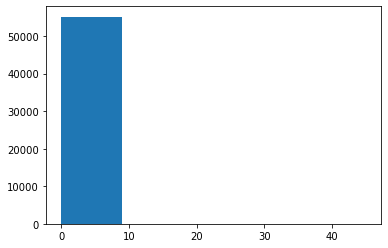

In [87]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.hist(new_nef['emoji_count'], bins= 5)

(array([1.2229e+04, 4.1000e+01, 1.2000e+01, 0.0000e+00, 7.0000e+00]),
 array([ 0. ,  2.4,  4.8,  7.2,  9.6, 12. ]),
 <BarContainer object of 5 artists>)

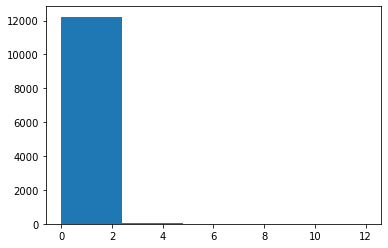

In [88]:
plt.hist(new_norm['emoji_count'], bins= 5)

In [ ]:
#Well that does seem like something different

(array([51267.,   680.,   652.,  1409.,  1241.]),
 array([0. , 0.8, 1.6, 2.4, 3.2, 4. ]),
 <BarContainer object of 5 artists>)

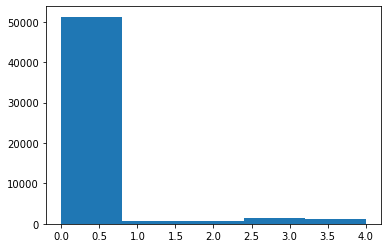

In [89]:
plt.hist(new_nef['handle_nums'], bins= 5)

(array([1.0772e+04, 1.3080e+03, 5.9000e+01, 1.4900e+02, 1.0000e+00]),
 array([ 0. ,  2.6,  5.2,  7.8, 10.4, 13. ]),
 <BarContainer object of 5 artists>)

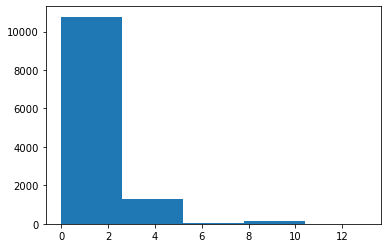

In [90]:
plt.hist(new_norm['handle_nums'], bins= 5)

In [92]:
new_nef['emoji_pct'] = new_nef['emoji_count'] / new_nef['tweet_length'] * 100

<ipython-input-92-1b2ba0808155>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_nef['emoji_pct'] = new_nef['emoji_count'] / new_nef['tweet_length'] * 100


0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
55244    0.0
55245    0.0
55246    0.0
55247    0.0
55248    0.0
Name: emoji_pct, Length: 55249, dtype: float64

In [93]:
new_nef[new_nef['emoji_pct'] > 0]

,unique_id,user_handle_x,retweet_count,retweeted,retweeted_status_id,favorite_count,text,p_text,source,hashtags,...,desc_vecs,troll_tweet,tweet_length,desc_length,mention_count,hashtag_count,url_count,handle_length,handle_nums,emoji_pct
10,7.793258611494789e+17patriotblake,patriotblake,0.0,1,7.791981e+17,0.0,RT @Veteran4Trump: A picture you will never se...,RT Veteran4trump : A picture you will never se...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...","[Blacks4Trump, MakeAmericaGreatAgain, BlacksFo...",...,[-2.33697653e-01 1.76734313e-01 -1.51604200e-...,1,140,94,3,9,0,12,0,0.714286
15,7.841598637776609e+17bigboysneed,bigboysneed,0.0,1,7.841551e+17,0.0,RT @funkflex: (Video) Jeezy On Donald Trump: “...,RT Funkflex : ( Video ) Jeezy On Donald Trump ...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,[-5.05815409e-02 2.17596188e-01 -4.95647714e-...,1,116,64,1,0,1,11,0,0.862069
20,7.807176284279071e+17jenn_abrams,jenn_abrams,269.0,0,NaN,296.0,The most honest Hillary's poster I've seen 😂\n...,The most honest Hillary's poster I 've seen fa...,"<a href=""https://about.twitter.com/products/tw...",[],...,[-5.35461083e-02 2.43381441e-01 -9.03818086e-...,1,87,110,0,0,0,11,0,1.149425
66,7.850703394705859e+17ameliebaldwin,ameliebaldwin,0.0,1,7.848281e+17,0.0,RT @DBloom451: If @KellyAyotte thinks she'll w...,RT Dbloom451 : If Kellyayotte thinks she'll wi...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,[-3.59312855e-02 3.11267316e-01 -1.35997280e-...,1,138,29,2,0,0,13,0,0.724638
88,7.887552038854984e+17worldofhashtags,worldofhashtags,0.0,1,7.887544e+17,0.0,RT @UnderVisualsNYC: Make America Stronger Tog...,RT Undervisualsnyc : Make America Stronger Tog...,"<a href=""https://about.twitter.com/products/tw...","[Banners, Print, Printer, Backdrops, Props, Cl...",...,[ 1.64171234e-02 2.04669818e-01 5.76769523e-...,1,128,94,1,8,8,15,0,0.781250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55114,7.775010438401311e+17hyddrox,hyddrox,0.0,1,7.774945e+17,0.0,RT @bfraser747: 💥💥 #Dems4Trump\n\nThis electio...,RT Bfraser747 : collision collision Dems4Trump...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...","[MakeAmericaGreatAgain, Dems4Trump, Corruption]",...,[-7.14451298e-02 1.02677532e-01 6.28003031e-...,1,140,155,1,3,0,7,0,1.428571
55123,7.767776856327782e+17hyddrox,hyddrox,0.0,1,7.767730e+17,0.0,RT @immigrant_legal: Donald Trump looked so co...,RT Immigrant_legal : Donald Trump looked so co...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,[-7.14451298e-02 1.02677532e-01 6.28003031e-...,1,140,155,3,0,3,7,0,0.714286
55143,7.840083990129172e+17melanymelanin,melanymelanin,NaN,1,NaN,NaN,RT @blicqer: ▶ O Brasil no globo da morte http...,RT Blicqer : play button O Brasil no globo da ...,NaN,[],...,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. ...,1,103,0,2,0,0,13,0,0.970874
55196,7.753880629269668e+17prettylaraplace,prettylaraplace,0.0,1,7.753827e+17,0.0,RT @fibarda: Another amazing amazing speech by...,RT Fibarda : Another amazing amazing speech by...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,[-1.84820503e-01 1.31125495e-01 -2.92615034e-...,1,99,66,1,0,0,15,0,12.121212


In [100]:
new_nef.iloc[55196]['text']

'RT @fibarda: Another amazing amazing speech by Mr Trump\nat National Guard.\n🇺🇸🇺🇸👍🏻👍🏻👍🏻❤️❤️❤️🇺🇸🇺🇸🇺🇸🇺🇸'

In [101]:
new_norm['emoji_pct'] = new_norm['emoji_count'] / new_norm['tweet_length'] * 100
new_norm[new_norm['emoji_pct'] > 0]

<ipython-input-101-22dde31ca2c7>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_norm['emoji_pct'] = new_norm['emoji_count'] / new_norm['tweet_length'] * 100


,t_id,user_handle,t_retweet_count,retweeted,t_favorite_count,t_text,text,t_source,hashtags,urls,...,duplicated,troll_tweet,tweet_length,desc_length,mention_count,hashtag_count,url_count,handle_length,handle_nums,emoji_pct
9,763431267471880192,Taylod61,569,1,0,RT @Dleather25_: Donald Trump is not what the ...,RT Dleather25 _ : Donald Trump is not what the...,"<a href=""http://twitter.com/download/iphone"" r...",[MAGA],[],...,0,0,140,142,1,1,0,8,2,0.714286
41,763431278083321856,brockheather03,103,1,0,RT @LindaSuhler: Rudy Giuliani Calls Clinton C...,RT Lindasuhler : Rudy Giuliani Calls Clinton C...,"<a href=""http://twitter.com/download/android"" ...","[CrookedHillary, TrumpPence16, MAGA]",[https://www.donaldjtrump.com/press-releases/i...,...,0,0,140,0,1,3,1,14,2,0.714286
67,763431285733949440,Secondcivic,0,0,0,"@realDonaldTrump lmao, I love it when you and ...","Realdonaldtrump lmao , I love it when you and ...","<a href=""http://twitter.com/download/android"" ...",[hilary4president],[],...,0,0,140,0,1,1,0,11,0,0.714286
80,763431287633960961,_Aadeolaa,0,0,0,Better than 1 vote in one's polling booth I su...,Better than 1 vote in one's polling booth I su...,"<a href=""http://twitter.com/#!/download/ipad"" ...",[],[https://twitter.com/dolusegun/status/76342920...,...,0,0,78,100,0,0,1,9,0,1.282051
98,763431293069692930,BamaGirlzRbest,0,0,0,As usual. Crickets.\nHillary puppets.\nNobody ...,As usual . Crickets . Hillary puppets . Nobo...,"<a href=""http://twitter.com/download/iphone"" r...",[],[https://twitter.com/leannbe/status/7634303931...,...,0,0,119,157,0,0,1,14,0,0.840336
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12159,789250984610504705,1USAPROUD,3,1,0,RT @SurfPHX: 📍📍Abedin Implicated Clinton In Fo...,RT Surfphx : round pushpin round pushpin Abedi...,"<a href=""http://twitter.com/download/android"" ...",[PayToPlay],[],...,0,0,140,55,1,1,0,9,1,1.428571
12192,789250991015198724,DustinJ601,1952,1,0,RT @DanScavino: .@realDonaldTrump &amp; team a...,RT Danscavino : realDonaldTrump Realdonaldtrum...,"<a href=""http://twitter.com/download/iphone"" r...","[NYC, TrumpTrain]",[],...,0,0,144,18,2,2,0,10,3,4.166667
12248,789251001144389632,Maggiemae_75,2,1,0,RT @Kimsparrow13: Given the per capita drug ab...,RT Kimsparrow13 : Given the per capita drug ab...,"<a href=""http://twitter.com/#!/download/ipad"" ...",[],[],...,0,0,140,147,1,0,0,12,2,0.714286
12274,789251006295056386,leepeter53,58,1,0,RT @RichardWeaving: The Real Donald J. Trump\n...,RT Richardweaving : The Real Donald J. Trump ...,"<a href=""http://twitter.com/download/iphone"" r...",[VoteTrumpUSA],[],...,0,0,111,134,1,1,0,10,2,0.900901


In [102]:
new_norm['num_handle_pct'] = new_norm['handle_nums'] / new_norm['handle_length'] * 100
new_norm[new_norm['num_handle_pct'] > 0]

<ipython-input-102-dc6f8ca0fbec>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_norm['num_handle_pct'] = new_norm['handle_nums'] / new_norm['handle_length'] * 100


,t_id,user_handle,t_retweet_count,retweeted,t_favorite_count,t_text,text,t_source,hashtags,urls,...,troll_tweet,tweet_length,desc_length,mention_count,hashtag_count,url_count,handle_length,handle_nums,emoji_pct,num_handle_pct
3,763431265743802368,wpl1960,557,1,0,RT @newtgingrich: Hillary Clinton snubs police...,RT Newtgingrich : Hillary Clinton snubs police...,"<a href=""http://twitter.com/download/iphone"" r...",[],[http://thehill.com/blogs/ballot-box/president...,...,0,76,0,1,0,1,7,4,0.000000,57.142857
4,763431266171645952,hendry118,2,1,0,"RT @dredeyedick: If Trump was ""joking"", why sa...","RT Dredeyedick : If Trump was "" joking "" , why...","<a href=""http://twitter.com/download/iphone"" r...",[],[],...,0,144,79,1,0,0,9,3,0.000000,33.333333
9,763431267471880192,Taylod61,569,1,0,RT @Dleather25_: Donald Trump is not what the ...,RT Dleather25 _ : Donald Trump is not what the...,"<a href=""http://twitter.com/download/iphone"" r...",[MAGA],[],...,0,140,142,1,1,0,8,2,0.714286,25.000000
12,763431268289683457,iefap1940,2906,1,0,RT @aipsmith: Newt Gingrich has said that Trum...,RT Aipsmith : Newt Gingrich has said that Trum...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],[],...,0,140,121,1,0,0,9,4,0.000000,44.444444
17,763431270022012930,mercurygirl7,1,1,0,RT @sherrilee7: Christians in name only. http...,RT Sherrilee7 : Christians in name only . T,"<a href=""http://twitter.com/download/iphone"" r...",[],[https://twitter.com/anniseparker/status/76339...,...,0,65,114,1,0,1,12,1,0.000000,8.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12274,789251006295056386,leepeter53,58,1,0,RT @RichardWeaving: The Real Donald J. Trump\n...,RT Richardweaving : The Real Donald J. Trump ...,"<a href=""http://twitter.com/download/iphone"" r...",[VoteTrumpUSA],[],...,0,111,134,1,1,0,10,2,0.900901,20.000000
12277,789251006966198273,ashbeth34,5934,1,0,RT @wikileaks: Internet sleuths connect Clinto...,RT Wikileaks : Internet sleuths connect Clinto...,"<a href=""http://twitter.com/download/iphone"" r...",[],[],...,0,140,8,1,0,0,9,2,0.000000,22.222222
12278,789251007461154816,RobinMehler1,0,0,0,@ErinBurnett PleaseErin get Cory to answer you...,Erinburnett PleaseErin get Cory to answer your...,"<a href=""http://twitter.com/download/iphone"" r...",[],[],...,0,140,138,1,0,0,12,1,0.000000,8.333333
12287,789251009973329920,LupeMLopez57,85,1,0,"RT @voxdotcom: At a rally on Thursday, Donald ...","RT Voxdotcom : At a rally on Thursday , Donald...","<a href=""http://twitter.com/#!/download/ipad"" ...",[],[],...,0,140,160,1,0,0,12,2,0.000000,16.666667


In [103]:
new_nef['num_handle_pct'] = new_nef['handle_nums'] / new_nef['handle_length'] * 100
new_nef[new_nef['num_handle_pct'] > 0]

<ipython-input-103-31b34b719aa0>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_nef['num_handle_pct'] = new_nef['handle_nums'] / new_nef['handle_length'] * 100


,unique_id,user_handle_x,retweet_count,retweeted,retweeted_status_id,favorite_count,text,p_text,source,hashtags,...,troll_tweet,tweet_length,desc_length,mention_count,hashtag_count,url_count,handle_length,handle_nums,emoji_pct,num_handle_pct
18,7.815326608585851e+17finley1589,finley1589,0.0,1,7.813004e+17,0.0,"RT @IngrahamAngle: ""The arrogance of Washingto...","RT Ingrahamangle : "" The arrogance of Washingt...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,1,140,88,1,0,0,10,4,0.0,40.000000
38,7.77022291246932e+17finley1589,finley1589,0.0,1,7.759540e+17,0.0,RT @basedmattforney: Holy shit. The DNC has an...,RT Basedmattforney : Holy shit . The DNC has a...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...","[dncleak, DNCLeaks]",...,1,140,88,1,2,0,10,4,0.0,40.000000
40,7.773057502595973e+17rh0lbr00k,rh0lbr00k,0.0,1,7.773004e+17,0.0,"RT @RoseD1st: If Trumps Wins, Hillary and Bill...","RT Rosed1st : If Trumps Wins , Hillary and Bil...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,1,103,120,2,0,2,9,3,0.0,33.333333
42,7.773096920160092e+17finley1589,finley1589,0.0,1,7.773069e+17,0.0,RT @CR: Trump’s maternity plan may sound good ...,RT Cr : Trump's maternity plan may sound good ...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,1,140,88,1,0,1,10,4,0.0,40.000000
58,7.769744766134108e+17rh0lbr00k,rh0lbr00k,0.0,1,7.769692e+17,0.0,RT @NRSC: Hillary Clinton isn't the only Dem w...,RT Nrsc : Hillary Clinton isn't the only Dem w...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[PASen],...,1,122,120,1,1,1,9,3,0.0,33.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55151,7.772785044130611e+17finley1589,finley1589,0.0,1,7.772756e+17,0.0,RT @WillisShepherd: An atheist asswipe tell yo...,RT Willisshepherd : An atheist asswipe tell yo...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,1,125,88,1,0,1,10,4,0.0,40.000000
55166,7.875662660306534e+17finley1589,finley1589,0.0,1,7.875511e+17,0.0,RT @GartrellLinda: FBI Agents Furious at Top B...,RT Gartrelllinda : FBI Agents Furious at Top B...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,1,140,88,1,0,1,10,4,0.0,40.000000
55184,7.805803109164974e+17jeannemccarthy0,jeannemccarthy0,NaN,1,NaN,NaN,RT @HellieEdwards: #ThingsMoreTrustedThanHilla...,RT Hellieedwards : ThingsMoreTrustedThanHillar...,NaN,[ThingsMoreTrustedThanHillary],...,1,75,120,1,1,0,15,1,0.0,6.666667
55187,7.917642022979092e+17finley1589,finley1589,0.0,1,7.917593e+17,0.0,RT @Lrihendry: On election night when Trump wi...,RT Lrihendry : On election night when Trump wi...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,1,144,88,1,0,0,10,4,0.0,40.000000


In [ ]:
#Those above appear to be the same banned accounts over and over again - something to consider

In [107]:
#Average length of url might be something - then I think it's just source and url extractions for one-hot-encoding
new_norm['urls'].dtypes

dtype('O')

In [109]:
url_averages = []
for x in new_norm['urls']:
    avg = 0
    urls = []
    if len(x) > 0:
        for y in x:
            urls.append(len(y))
        avg = sum(urls)/len(urls)
    url_averages.append(avg)
url_averages

[74.0,
 22.0,
 22.0,
 93.0,
 0,
 124.0,
 87.0,
 0,
 0,
 0,
 21.0,
 82.0,
 0,
 57.0,
 0,
 22.0,
 0,
 58.0,
 23.0,
 0,
 23.0,
 95.0,
 22.0,
 0,
 21.0,
 21.0,
 0,
 0,
 0,
 146.0,
 67.5,
 0,
 52.0,
 61.0,
 21.0,
 0,
 59.0,
 0,
 0,
 0,
 113.0,
 96.0,
 59.0,
 0,
 0,
 61.0,
 0,
 60.0,
 0,
 53.0,
 37.0,
 0,
 0,
 0,
 0,
 0,
 18.0,
 0,
 0,
 0,
 0,
 0,
 0,
 22.0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 21.0,
 0,
 126.0,
 0,
 0,
 60.0,
 60.0,
 0,
 55.0,
 0,
 0,
 56.0,
 0,
 0,
 0,
 0,
 0,
 0,
 71.0,
 0,
 54.0,
 0,
 22.0,
 58.0,
 0,
 0,
 53.0,
 0,
 56.0,
 0,
 21.0,
 56.0,
 0,
 61.0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 364.0,
 0,
 21.0,
 127.0,
 0,
 118.0,
 0,
 22.0,
 0,
 35.0,
 71.0,
 21.5,
 0,
 0,
 60.0,
 27.0,
 23.0,
 96.0,
 55.0,
 55.0,
 0,
 21.0,
 58.0,
 89.0,
 58.0,
 44.0,
 55.0,
 24.0,
 91.0,
 24.0,
 113.0,
 0,
 134.0,
 0,
 21.0,
 0,
 0,
 0,
 23.0,
 83.0,
 49.0,
 52.0,
 0,
 66.0,
 0,
 84.0,
 96.0,
 74.0,
 0,
 0,
 22.0,
 0,
 56.0,
 141.0,
 0,
 61.0,
 0,
 0,
 74.0,
 0,
 21.0,
 54.0,
 0,
 35.0,
 0,
 21.0,
 21.

In [110]:
new_norm['url_avg_length'] = url_averages

<ipython-input-110-6e5a0f614cd8>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_norm['url_avg_length'] = url_averages


In [113]:
url_averages2 = []
for x in new_nef['expanded_urls']:
    avg = 0
    urls = []
    if len(x) > 0:
        for y in x:
            urls.append(len(y))
        avg = sum(urls)/len(urls)
    url_averages2.append(avg)
url_averages2

[23.0,
 0,
 32.0,
 25.0,
 0,
 0,
 0,
 61.0,
 0,
 0,
 0,
 0,
 0,
 0,
 127.0,
 24.0,
 0,
 0,
 0,
 0.0,
 0,
 0,
 0,
 0,
 0,
 19.0,
 0,
 61.0,
 112.0,
 0,
 219.0,
 0,
 21.0,
 0,
 0,
 24.0,
 57.0,
 56.0,
 0,
 123.0,
 28.0,
 0,
 22.0,
 0,
 0,
 22.0,
 24.0,
 57.0,
 0,
 0,
 0,
 57.0,
 55.0,
 0,
 0,
 0.0,
 22.0,
 0,
 76.0,
 0,
 120.0,
 0,
 19.0,
 0,
 0,
 0,
 0,
 0,
 50.0,
 61.0,
 0,
 0,
 110.0,
 0,
 0,
 0,
 25.0,
 0,
 58.0,
 0,
 0,
 0.0,
 0,
 0,
 59.0,
 0,
 0.0,
 0,
 0.0,
 95.0,
 0,
 0,
 60.0,
 0,
 0,
 0,
 28.0,
 56.0,
 28.0,
 57.0,
 59.0,
 0,
 0,
 55.0,
 0,
 0,
 0.0,
 0,
 0,
 0,
 0.0,
 0,
 0,
 0,
 0,
 0.0,
 57.0,
 0,
 0,
 0,
 0,
 0,
 0,
 59.0,
 39.0,
 0,
 0,
 21.0,
 0,
 83.0,
 0,
 0,
 0,
 21.0,
 82.0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0.0,
 0,
 100.0,
 0,
 0,
 50.0,
 0,
 0,
 22.0,
 0,
 0,
 41.0,
 21.0,
 21.0,
 0,
 0,
 57.0,
 0,
 0,
 59.0,
 0,
 0,
 78.0,
 0,
 136.0,
 0,
 47.0,
 0.0,
 115.0,
 0,
 0.0,
 49.0,
 0.0,
 0,
 21.0,
 22.0,
 53.0,
 0.0,
 133.0,
 0,
 0,
 0,
 0.0,
 0,
 0,
 22.0,
 22.0,


In [114]:
new_nef['url_avg_length'] = url_averages2
new_nef

<ipython-input-114-f7affeac56c6>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_nef['url_avg_length'] = url_averages2


,unique_id,user_handle_x,retweet_count,retweeted,retweeted_status_id,favorite_count,text,p_text,source,hashtags,...,tweet_length,desc_length,mention_count,hashtag_count,url_count,handle_length,handle_nums,emoji_pct,num_handle_pct,url_avg_length
0,7.855849423569674e+17detroitdailynew,detroitdailynew,0.0,0,NaN,0.0,"Clinton: Trump should’ve apologized more, atta...","Clinton : Trump should ’ve apologized more , a...","<a href=""http://twitterfeed.com"" rel=""nofollow...",[],...,79,97,0,0,1,15,0,0.0,0.0,23.0
1,7.9130185460915e+17giselleevns,giselleevns,NaN,0,NaN,NaN,"@ModicaGiunta me, too!","Modicagiunta me , too !",NaN,[],...,22,72,1,0,0,11,0,0.0,0.0,0.0
2,7.925436225288929e+17ameliebaldwin,ameliebaldwin,0.0,1,7.925391e+17,0.0,RT @AriaWilsonGOP: 3 Women Face Charges After ...,RT Ariawilsongop : 3 Women Face Charges After ...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,137,29,1,0,1,13,0,0.0,0.0,32.0
3,7.926596780188877e+17ilovesarahrich,ilovesarahrich,0.0,1,7.926490e+17,0.0,"RT @bgg2wl: Walmart, Michelle Obama and The Ha...","RT Bgg2wl : Walmart , Michelle Obama and The H...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,103,88,1,0,1,14,0,0.0,0.0,25.0
4,7.894438400758497e+17giselleevns,giselleevns,NaN,0,NaN,NaN,When I remember it's #Friyay https://t.co/yjBT...,When I remember it's Friyay T,NaN,[Friyay],...,52,72,0,1,0,11,0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55244,7.742783701713347e+17cornellburchet,cornellburchet,0.0,1,7.742741e+17,0.0,"RT @JoyAnnReid: IOW, during the primaries Kell...","RT Joyannreid : IOW , during the primaries Kel...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[],...,140,160,2,0,2,14,0,0.0,0.0,58.0
55245,7.811909319281295e+17screamymonkey,screamymonkey,0.0,0,NaN,0.0,#TopNews Senate overwhelmingly rejects Obama v...,TopNews Senate overwhelmingly rejects Obama ve...,"<a href=""http://twitterfeed.com"" rel=""nofollow...",[TopNews],...,76,31,0,1,0,13,0,0.0,0.0,0.0
55246,7.684619072000573e+17chrixmorgan,chrixmorgan,0.0,1,7.684617e+17,0.0,RT @Goodluckbeer: Fentanyl filled Trump suppor...,RT Goodluckbeer : Fentanyl filled Trump suppor...,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",[MustBeBanned],...,140,37,1,1,0,11,0,0.0,0.0,0.0
55247,7.816593719189258e+17onlinememphis,onlinememphis,0.0,0,NaN,0.0,ELECTION GUIDE: Federal and State elections ht...,ELECTION GUIDE : Federal and State elections T,"<a href=""http://twitterfeed.com"" rel=""nofollow...",[],...,67,103,0,0,1,13,0,0.0,0.0,21.0


In [ ]:
#Thinking the duplicate category might be a cheat - but at the same time it's a very clear red flag. Yet I
#HAPPEN to have this information - I'm not sure it's something that could be duplicated?

In [115]:
new_nef.to_csv('pause_nef.csv')
new_norm.to_csv('pause_norm.csv')

In [4]:
pause_nef = pd.read_csv('pause_nef.csv')
pause_norm = pd.read_csv('pause_norm.csv')

In [5]:
pause_nef[pause_nef['source'].isnull()] #Okay, as I remembered the source is missing from a LOT of the nefarious
#tweets and none of the normal tweets. I'm not sure at all (this is a pattern) whether this is because the source is 
#blocked on a lot of these nefarious tweets or whether it wasn't something scrape-able.
#Could I not check whether some accounts have sources SOMETIMES and elaborate their remaining NAs accordingly?
#Or am I losing valuable information by not recording that their source is unknown? UGH. Wish I had more info.

,Unnamed: 0,unique_id,user_handle_x,retweet_count,retweeted,retweeted_status_id,favorite_count,text,p_text,source,...,tweet_length,desc_length,mention_count,hashtag_count,url_count,handle_length,handle_nums,emoji_pct,num_handle_pct,url_avg_length
1,1,7.9130185460915e+17giselleevns,giselleevns,NaN,0,NaN,NaN,"@ModicaGiunta me, too!","Modicagiunta me , too !",NaN,...,22,72,1,0,0,11,0,0.0,0.0,0.0
4,4,7.894438400758497e+17giselleevns,giselleevns,NaN,0,NaN,NaN,When I remember it's #Friyay https://t.co/yjBT...,When I remember it's Friyay T,NaN,...,52,72,0,1,0,11,0,0.0,0.0,0.0
5,5,7.887574359640883e+17melvinsroberts,melvinsroberts,NaN,1,NaN,NaN,RT @hldb73: Bryan or Ryan Adams #whenthestars...,RT Hldb73 : Bryan or Ryan Adams whenthestars...,NaN,...,140,35,4,1,0,14,0,0.0,0.0,0.0
6,6,7.741648275393208e+17puredavie,puredavie,NaN,0,NaN,NaN,Kareem Abdul Jabber #OneLetterOffSports @midni...,Kareem Abdul Jabber OneLetterOffSports Midnigh...,NaN,...,62,46,1,1,0,9,0,0.0,0.0,0.0
9,9,7.769984117154365e+17dorothiebell,dorothiebell,NaN,1,NaN,NaN,RT @DinoAHudson1: @erreebus @juicekan @Pollyes...,RT Dinoahudson1 : Erreebus Juicekan Pollyesthe...,NaN,...,141,102,8,0,0,12,0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55229,55229,7.741606864819405e+17jasper_fly,jasper_fly,NaN,0,NaN,NaN,Baltimore Areolas #OneLetterOffSports @midnight,Baltimore Areolas OneLetterOffSports Midnight,NaN,...,48,38,1,1,0,10,0,0.0,0.0,0.0
55232,55232,7.881461073479066e+17melanymelanin,melanymelanin,NaN,1,NaN,NaN,RT @GinaBest: (Artist: Karrie Jackson) #SayHer...,RT Ginabest : ( Artist : Karrie Jackson ) SayH...,NaN,...,140,0,1,1,0,13,0,0.0,0.0,0.0
55236,55236,7.887561313804206e+17giselleevns,giselleevns,NaN,1,NaN,NaN,RT @TwinTailsOW: Benghazi #RejectedDebateTopics,RT Twintailsow : Benghazi RejectedDebateTopics,NaN,...,47,72,1,1,0,11,0,0.0,0.0,0.0
55238,55238,7.806046423717683e+17queenofthewo,queenofthewo,NaN,1,NaN,NaN,RT @CahnEmily: Except Holt wasn't wrong. Stop ...,RT Cahnemily : Except Holt wasn't wrong . Stop...,NaN,...,132,62,1,0,0,12,0,0.0,0.0,0.0


In [6]:
pause_nef[pause_nef['user_handle_x'] == 'melanymelanin']['source'].value_counts()
#117 have this source out of 800 some total (the rest being NA)
#Okay if I can do this for all of the associated tweets, and I don't see why I couldn't, this feels like an okay
#way to fill the NAs.

<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>    117
Name: source, dtype: int64

In [7]:
len(pause_nef[pause_nef['source'].isnull()]['user_handle_x'].unique())

52

In [8]:
null_handles = pause_nef[pause_nef['source'].isnull()]['user_handle_x'].unique()

In [9]:
all_handle_source = []
for handle in null_handles:
    handle_source = []
    for source in pause_nef[pause_nef['user_handle_x'] == handle]['source']:
        if str(source) != "nan" and [handle, str(source)] not in handle_source:
            handle_source.append([handle, str(source)])
    #print(handle_source)
    all_handle_source.append(handle_source)
print(all_handle_source, len(all_handle_source))

[[['giselleevns', '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>'], ['giselleevns', '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>']], [['melvinsroberts', '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>']], [['puredavie', '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>']], [['dorothiebell', '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>']], [['jasper_fly', '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>']], [['traceyhappymom', '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>']], [['jacquelinisbest', '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>'], ['jacquelinisbest', '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>']], [['cassieweltch', '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>']], [['kathiemrr', '<a href="http://twitter.com" rel="nofollow">Twitte

In [10]:
#Good! Looks like I'll have SOMETHING for each of the handles, but some have more than one source so 
#I'll need to decide

In [11]:
handle_source_counts = []
for handle in null_handles:
    handle_source = []
    for source in pause_nef[pause_nef['user_handle_x'] == handle]['source']:
        if str(source) != "nan":
            handle_source.append([handle, str(source)])
    #print(handle_source)
    handle_source_counts.append(handle_source)
#print(all_handle_source, len(all_handle_source))
print(handle_source_counts)

[[['giselleevns', '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>'], ['giselleevns', '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>'], ['giselleevns', '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>'], ['giselleevns', '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>'], ['giselleevns', '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>'], ['giselleevns', '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>'], ['giselleevns', '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>'], ['giselleevns', '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>'], ['giselleevns', '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>'], ['giselleevns', '<a href="https://about.twitter.com/products/t

In [12]:
new_strings = []
for item in handle_source_counts:
    new = []
    for x in item:
           new.append(str(x))
    new_strings.append(new)
from collections import Counter
my_list = []
for x in new_strings:
    count = Counter(x).values()
    key = Counter(x).keys()
    my_list.append([key, count])
    #print(x)

In [13]:
my_list #Cannot believe that mostly worked.

[[dict_keys(['[\'giselleevns\', \'<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>\']', '[\'giselleevns\', \'<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>\']']),
  dict_values([187, 5])],
 [dict_keys(['[\'melvinsroberts\', \'<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>\']']),
  dict_values([50])],
 [dict_keys(['[\'puredavie\', \'<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>\']']),
  dict_values([32])],
 [dict_keys(['[\'dorothiebell\', \'<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>\']']),
  dict_values([420])],
 [dict_keys(['[\'jasper_fly\', \'<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>\']']),
  dict_values([22])],
 [dict_keys(['[\'traceyhappymom\', \'<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>\']']),
  dict_values([42])],
 [dict_keys(['[\'jacquelinisbest\', \'<a href="http://twitter.com" rel="nofollow">Twitter Web Client<

In [14]:
for x in my_list:
    if len(x[0]) > 1:
        print(x[1])

dict_values([187, 5])
dict_values([531, 1])
dict_values([14, 1])
dict_values([1, 3])
dict_values([11, 1])
dict_values([373, 12])
dict_values([6, 1])
dict_values([6, 1])
dict_values([25, 39])


In [15]:
for x in my_list:
    if len(x[0]) > 1:
        print(x[0])
#I'm just going to write down by eye whether the first or second website is the most used

dict_keys(['[\'giselleevns\', \'<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>\']', '[\'giselleevns\', \'<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>\']'])
dict_keys(['[\'jacquelinisbest\', \'<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>\']', '[\'jacquelinisbest\', \'<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>\']'])
dict_keys(['[\'jeannemccarthy0\', \'<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>\']', '[\'jeannemccarthy0\', \'<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>\']'])
dict_keys(['[\'priceforpierce\', \'<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>\']', '[\'priceforpierce\', \'<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>\']'])
dict_keys(['[\'michellearry\', \'<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>\']', '[\'michellea

In [16]:
#First first first, second, first, first, first, first, second

In [17]:
for x in all_handle_source:
    if len(x) > 1:
        url1_start = x[0][1].find('//') + 2
        url2_start = x[1][1].find('//') + 2
        print(len(x), x[0][0], x[0][1][url1_start:x[0][1].find('.com')], x[1][1][url2_start:x[1][1].find('.com')])
#Okay these are the only ones with issues then and luckily only two each!

2 giselleevns about.twitter twitter
2 jacquelinisbest twitter about.twitter
2 jeannemccarthy0 twitter about.twitter
2 priceforpierce about.twitter twitter
2 michellearry twitter medium
2 tpartynews about.twitter twitter
2 evagreen69 twitter about.twitter
2 westernwindwes twitter about.twitter
2 danageezus about.twitter twitter


In [27]:
source_replace = []
for x in all_handle_source:
    if len(x) > 1 and x[0][0] in ['priceforpierce', 'danageezus']: #The only two for which the second value is the most common       
        source_replace.append({x[0][0] : x[1][1]})
    if len(x) > 1 and x[0][0] not in ['priceforpierce', 'danageezus']:  
        source_replace.append({x[0][0] : x[0][1]})
source_replace

[{'giselleevns': '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>'},
 {'jacquelinisbest': '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>'},
 {'jeannemccarthy0': '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>'},
 {'priceforpierce': '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>'},
 {'michellearry': '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>'},
 {'tpartynews': '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>'},
 {'evagreen69': '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>'},
 {'westernwindwes': '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>'},
 {'danageezus': '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>'}]

In [19]:
pause_nef['source'].fillna(pause_nef['user_handle_x'], inplace = True)

In [20]:
pause_nef[pause_nef['user_handle_x'] == 'giselleevns']['source']

1                                              giselleevns
4                                              giselleevns
16       <a href="https://about.twitter.com/products/tw...
50                                             giselleevns
54                                             giselleevns
                               ...                        
55086                                          giselleevns
55217                                          giselleevns
55225                                          giselleevns
55228                                          giselleevns
55236                                          giselleevns
Name: source, Length: 2443, dtype: object

In [21]:
pause_nef[pause_nef['user_handle_x'] == 'jacquelinisbest']['source']

24                                         jacquelinisbest
30       <a href="http://twitter.com" rel="nofollow">Tw...
106      <a href="http://twitter.com" rel="nofollow">Tw...
172      <a href="http://twitter.com" rel="nofollow">Tw...
192      <a href="http://twitter.com" rel="nofollow">Tw...
                               ...                        
55003                                      jacquelinisbest
55018    <a href="http://twitter.com" rel="nofollow">Tw...
55028                                      jacquelinisbest
55091                                      jacquelinisbest
55142                                      jacquelinisbest
Name: source, Length: 1320, dtype: object

In [22]:
import numpy as np
pause_nef['source'] = [source_replace[0]['giselleevns'] if source == 'giselleevns' else source for source in pause_nef['source']]
                                                                                                                                       

In [24]:
pause_nef[pause_nef['user_handle_x'] == 'giselleevns']['source'].unique()

array(['<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>',
       '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>'],
      dtype=object)

In [25]:
pause_nef['source'] = [source_replace[1]['jacquelinisbest'] if source == 'jacquelinisbest' else source for source in pause_nef['source']]


In [32]:
pause_nef[pause_nef['user_handle_x'] == 'jacquelinisbest']['source'].unique()

array(['<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>',
       '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>'],
      dtype=object)

In [30]:
pause_nef['source'] = [source_replace[2]['jeannemccarthy0'] if source == 'jeannemccarthy0' else source for source in pause_nef['source']]


In [31]:
pause_nef[pause_nef['user_handle_x'] == 'jeannemccarthy0']['source'].unique()

array(['<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>',
       '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>'],
      dtype=object)

In [33]:
pause_nef['source'] = [source_replace[3]['priceforpierce'] if source == 'priceforpierce' else source for source in pause_nef['source']]


In [34]:
pause_nef[pause_nef['user_handle_x'] == 'priceforpierce']['source'].unique()

array(['<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>',
       '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>'],
      dtype=object)

In [35]:
pause_nef['source'] = [source_replace[4]['michellearry'] if source == 'michellearry' else source for source in pause_nef['source']]


In [36]:
pause_nef[pause_nef['user_handle_x'] == 'michellearry']['source'].unique()

array(['<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>',
       '<a href="https://medium.com" rel="nofollow">Medium</a>'],
      dtype=object)

In [37]:
pause_nef['source'] = [source_replace[5]['tpartynews'] if source == 'tpartynews' else source for source in pause_nef['source']]


In [38]:
pause_nef[pause_nef['user_handle_x'] == 'tpartynews']['source'].unique()

array(['<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>',
       '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>'],
      dtype=object)

In [39]:
pause_nef['source'] = [source_replace[6]['evagreen69'] if source == 'evagreen69' else source for source in pause_nef['source']]


In [40]:
pause_nef[pause_nef['user_handle_x'] == 'evagreen69']['source'].unique()

array(['<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>',
       '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>'],
      dtype=object)

In [41]:
pause_nef['source'] = [source_replace[7]['westernwindwes'] if source == 'westernwindwes' else source for source in pause_nef['source']]


In [42]:
pause_nef[pause_nef['user_handle_x'] == 'westernwindwes']['source'].unique()

array(['<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>',
       '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>'],
      dtype=object)

In [43]:
pause_nef['source'] = [source_replace[8]['danageezus'] if source == 'danageezus' else source for source in pause_nef['source']]


In [44]:
pause_nef[pause_nef['user_handle_x'] == 'danageezus']['source'].unique()

array(['<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>',
       '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>'],
      dtype=object)

In [56]:
pause_nef['source'] = [np.nan if source[0] != '<' else source for source in pause_nef['source']]

In [74]:
pause_nef[pause_nef['source'].isnull()]

,Unnamed: 0,unique_id,user_handle_x,retweet_count,retweeted,retweeted_status_id,favorite_count,text,p_text,source,...,tweet_length,desc_length,mention_count,hashtag_count,url_count,handle_length,handle_nums,emoji_pct,num_handle_pct,url_avg_length
5,5,7.887574359640883e+17melvinsroberts,melvinsroberts,NaN,1,NaN,NaN,RT @hldb73: Bryan or Ryan Adams #whenthestars...,RT Hldb73 : Bryan or Ryan Adams whenthestars...,NaN,...,140,35,4,1,0,14,0,0.0,0.0,0.0
6,6,7.741648275393208e+17puredavie,puredavie,NaN,0,NaN,NaN,Kareem Abdul Jabber #OneLetterOffSports @midni...,Kareem Abdul Jabber OneLetterOffSports Midnigh...,NaN,...,62,46,1,1,0,9,0,0.0,0.0,0.0
9,9,7.769984117154365e+17dorothiebell,dorothiebell,NaN,1,NaN,NaN,RT @DinoAHudson1: @erreebus @juicekan @Pollyes...,RT Dinoahudson1 : Erreebus Juicekan Pollyesthe...,NaN,...,141,102,8,0,0,12,0,0.0,0.0,0.0
12,12,7.654907044665139e+17jasper_fly,jasper_fly,NaN,1,NaN,NaN,"RT @divinerebel: WHAT?!? OMG, How could @Comed...","RT Divinerebel : WHAT ? ! ? OMG , How could Co...",NaN,...,140,38,3,0,0,10,0,0.0,0.0,0.0
17,17,7.811266048105103e+17traceyhappymom,traceyhappymom,NaN,1,NaN,NaN,RT @King__Dork: #MyBestFriendIsntAllowed to be...,RT King__dork : MyBestFriendIsntAllowed to be ...,NaN,...,95,89,1,0,0,14,0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55227,55227,7.916031966617887e+17leroylovesusa,leroylovesusa,NaN,1,NaN,NaN,RT @theordinaryman2: Each star on that hideous...,RT Theordinaryman2 : Each star on that hideous...,NaN,...,142,65,1,0,0,13,0,0.0,0.0,0.0
55229,55229,7.741606864819405e+17jasper_fly,jasper_fly,NaN,0,NaN,NaN,Baltimore Areolas #OneLetterOffSports @midnight,Baltimore Areolas OneLetterOffSports Midnight,NaN,...,48,38,1,1,0,10,0,0.0,0.0,0.0
55232,55232,7.881461073479066e+17melanymelanin,melanymelanin,NaN,1,NaN,NaN,RT @GinaBest: (Artist: Karrie Jackson) #SayHer...,RT Ginabest : ( Artist : Karrie Jackson ) SayH...,NaN,...,140,0,1,1,0,13,0,0.0,0.0,0.0
55238,55238,7.806046423717683e+17queenofthewo,queenofthewo,NaN,1,NaN,NaN,RT @CahnEmily: Except Holt wasn't wrong. Stop ...,RT Cahnemily : Except Holt wasn't wrong . Stop...,NaN,...,132,62,1,0,0,12,0,0.0,0.0,0.0


In [83]:
for idx, source in pause_nef['source'].items():
    if str(source) == 'nan':
        user = pause_nef['user_handle_x'].iloc[idx]
        print(idx, user, pause_nef[pause_nef['user_handle_x'] == user]['source'].value_counts().idxmax())
#Surely it's too unlikely that they would all have the same most common web client

5 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53 notritahar

398 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
401 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
414 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
418 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
423 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
428 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
429 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
432 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
437 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
439 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
441 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
445 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web C

772 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
774 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
775 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
785 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
791 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
793 paulinett <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
795 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
805 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
808 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
818 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
819 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
822 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Cli

1187 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1188 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1191 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1199 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1200 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1201 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1204 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1206 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1212 lazykstafford <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1217 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1221 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1222 paulinett <a href="http://twitter.com" rel="nofollow

1672 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1674 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1675 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1681 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1685 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1687 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1689 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1691 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1692 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1698 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1700 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
1701 notritahart <a href="http://twitter.com" rel="nofollow">Twitt

2144 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2150 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2153 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2155 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2156 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2157 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2161 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2162 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2167 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2169 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2173 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2177 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter We

2602 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2603 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2608 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2609 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2610 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2611 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2617 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2621 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2635 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2640 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2648 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
2651 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter We

3002 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3004 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3008 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3009 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3010 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3015 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3025 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3027 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3031 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3035 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3043 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3046 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Cl

3362 paulinett <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3364 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3373 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3375 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3385 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3386 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3389 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3390 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3392 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3396 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3397 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3404 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitt

3794 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3798 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3807 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3810 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3811 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3812 mil0blake <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3816 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3821 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3823 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3830 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3832 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
3835 jasper_fly <a href="http://twitter.com" rel="nofollow">T

4266 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4282 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4283 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4291 paulinett <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4292 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4301 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4302 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4305 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4309 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4310 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4316 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4330 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter W

4683 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4686 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4687 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4688 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4689 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4691 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4692 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4693 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4694 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4695 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4696 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
4699 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter 

5082 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5087 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5088 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5089 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5090 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5091 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5093 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5096 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5098 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5100 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5101 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5102 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Clien

5463 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5466 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5468 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5477 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5479 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5482 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5484 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5494 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5500 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5502 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5503 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5505 cookncooks <a href="http://twitter.com" rel="nofollow">Twi

5926 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5930 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5933 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5935 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5937 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5941 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5948 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5952 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5956 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5963 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5964 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
5965 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web

6329 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6330 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6335 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6336 paulinett <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6341 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6342 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6345 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6346 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6348 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6349 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6350 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6351 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitt

6723 lazykstafford <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6728 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6734 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6747 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6748 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6749 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6753 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6760 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6769 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6774 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6775 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
6777 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter 

7112 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7113 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7123 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7126 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7129 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7133 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7138 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7140 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7146 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7147 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7160 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7172 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Cli

7569 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7573 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7576 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7581 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7585 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7587 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7590 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7594 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7595 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7598 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7607 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7610 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter We

7911 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7913 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7919 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7920 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7927 paulinett <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7937 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7939 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7942 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7943 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7944 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7949 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
7956 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web 

8313 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8316 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8320 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8322 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8324 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8330 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8332 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8337 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8339 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8344 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8346 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8347 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web 

8751 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8756 nataturn <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8758 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8759 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8761 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8771 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8777 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8778 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8784 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8791 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8794 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
8798 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web C

9162 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9170 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9173 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9179 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9181 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9182 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9183 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9187 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9188 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9189 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9191 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9195 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web

9562 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9566 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9572 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9577 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9579 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9580 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9581 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9587 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9591 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9592 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9595 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9600 notritahart <a href="http://twitter.com" rel="nofollow">Twit

9951 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9952 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9958 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9960 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9962 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9965 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9966 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9969 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9972 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9974 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9976 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
9981 willisbonnerr <a href="http://twitter.com" rel="nofollow">

10308 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10316 hollandpatrickk <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10320 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10327 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10329 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10344 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10346 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10354 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10356 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10357 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10359 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10361 melanymelanin <a href="http://twitter.com

10706 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10708 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10722 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10723 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10724 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10730 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10733 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10736 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10737 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10744 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10745 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
10746 _nickluna_ <a href="http://twitter.com" rel="nofoll

11096 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11098 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11102 lazykstafford <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11107 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11110 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11116 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11124 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11125 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11128 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11131 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11138 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11139 jeffreykahunas <a href="http://twitter.com" rel="nofoll

11471 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11472 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11473 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11477 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11479 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11480 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11496 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11501 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11507 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11510 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11511 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11514 kathiemrr <a href="http://twitter.com" rel="nofollow">Twi

11949 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11954 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11964 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11966 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11969 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11972 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11973 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11976 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11977 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11979 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11981 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
11983 johnbranchh <a href="http://twitter.com" rel="nofoll

12397 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12402 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12403 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12405 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12409 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12416 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12427 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12431 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12434 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12435 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12436 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12440 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter We

12817 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12821 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12824 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12825 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12827 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12830 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12832 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12835 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12836 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12838 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12847 paulinett <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
12849 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitt

13214 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13220 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13221 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13223 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13225 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13229 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13234 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13235 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13236 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13241 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13244 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13245 jeffreykahunas <a href="http://twitter.com" rel="nofollow">T

13638 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13640 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13644 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13645 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13647 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13652 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13653 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13654 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13655 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13657 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13658 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
13666 cookncooks <a href="http://twitter.com" rel="nofol

14101 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14104 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14111 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14112 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14113 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14125 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14129 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14140 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14141 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14148 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14150 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14155 melvinsroberts <a href="http://twitter.com" re

14496 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14501 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14502 paulinett <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14503 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14506 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14513 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14517 paulinett <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14518 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14521 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14522 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14531 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14534 jasper_fly <a href="http://twitter.com" rel="nofollow"

14935 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14936 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14955 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14956 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14961 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14967 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14972 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14981 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14985 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14986 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14990 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
14994 kathiemrr <a href="http://twitter.com" rel="nofollow

15316 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15324 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15339 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15340 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15344 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15349 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15360 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15361 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15373 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15377 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15386 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15387 jeffreykahunas <a href="http://twitter.com" rel="nofo

15780 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15784 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15785 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15786 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15787 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15791 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15801 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15805 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15806 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15810 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15814 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
15820 mr_clampin <a href="http://twitter.com" rel="

16212 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16213 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16214 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16224 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16227 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16229 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16240 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16249 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16256 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16260 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16263 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16264 jeffreykahunas <a href="http://twitter.c

16624 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16631 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16642 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16643 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16644 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16647 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16650 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16656 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16662 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16664 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16665 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
16669 malloryjared <a href="http://twitter.com" re

17112 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17113 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17114 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17117 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17122 paulinett <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17124 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17125 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17126 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17130 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17134 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17136 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17138 hiimkhloe <a href="http://twitter.com" rel="nofoll

17525 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17526 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17529 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17532 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17533 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17543 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17544 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17545 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17548 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17552 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17553 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17560 melvinsroberts <a href="http://twitter.

17984 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17990 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17991 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
17995 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18001 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18006 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18007 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18013 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18023 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18025 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18030 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18039 kathiemrr <a href="http://twitter.com" rel="nofol

18391 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18394 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18395 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18396 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18404 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18405 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18410 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18419 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18424 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18425 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18428 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18431 traceyhappymom <a href="http://twitter.com" rel="nofol

18816 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18820 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18830 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18832 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18836 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18843 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18845 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18848 curtisbigman <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18850 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18858 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18859 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
18860 dorothiebell <a href="http://twitter.com" rel=

19225 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19226 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19227 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19232 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19239 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19240 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19248 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19249 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19250 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19251 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19255 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19258 dorothiebell <a href="http://twitter.com" rel="nofollow">T

19681 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19682 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19688 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19694 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19698 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19703 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19710 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19711 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19720 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19722 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19723 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
19736 garrettsimpson_ <a href="http://twitter.com" rel="nofo

20069 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20071 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20074 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20075 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20076 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20077 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20078 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20080 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20083 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20088 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20089 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20092 mr_clampin <a href="http://twitter.com"

20488 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20489 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20490 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20494 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20500 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20501 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20502 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20503 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20509 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20512 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20513 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20515 jasper_fly <a href="http://twitter.com" rel="nofollow"

20972 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20976 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20979 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20980 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20990 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20995 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
20997 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21000 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21007 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21010 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21011 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21016 daileyjadon <a href="http://twitter.com" rel="nofollo

21414 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21416 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21420 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21424 mil0blake <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21425 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21433 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21440 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21444 hollandpatrickk <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21446 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21450 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21457 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21464 mr_clampin <a href="http://twitter.com" 

21845 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21849 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21862 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21863 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21868 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21877 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21878 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21880 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21881 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21885 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21891 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
21895 melvinsroberts <a href="http://twitter.com" rel="nofollow"

22270 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22274 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22278 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22280 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22283 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22287 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22289 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22291 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22292 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22294 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22296 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22297 notritahart <a href="http://twitter.com" rel="n

22733 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22738 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22747 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22752 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22755 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22758 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22764 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22765 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22768 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22773 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22779 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
22781 malloryjared <a href="http://twitter.com" r

23224 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23226 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23243 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23250 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23252 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23254 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23258 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23259 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23260 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23264 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23265 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23269 queenofthewo <a href="http://twitter.com" rel="nofollow

23656 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23659 paulinett <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23660 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23662 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23663 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23667 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23668 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23670 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23673 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23676 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23679 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
23683 malloryjared <a href="http://twitter.com" rel="nofollow">T

24057 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24066 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24069 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24075 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24076 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24079 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24081 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24086 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24088 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24090 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24094 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24096 melanymelanin <a href="http://twitter.

24468 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24476 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24477 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24481 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24497 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24499 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24502 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24506 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24507 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24512 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24514 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24515 notritahart <a href="http://twitter.com" rel="nofol

24938 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24939 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24942 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24947 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24948 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24952 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24956 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24969 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24971 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24977 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24986 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
24988 melanymelanin <a href="http://twitter.

25388 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25399 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25412 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25413 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25420 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25421 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25428 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25433 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25435 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25437 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25446 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25452 melanymelanin <a href="http://twitter.com" rel="nofollo

25834 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25838 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25847 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25848 paulinett <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25855 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25861 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25863 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25865 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25872 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25877 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25878 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
25883 melanymelanin <a href="http://twitter.com" rel="nof

26249 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26254 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26258 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26262 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26268 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26270 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26274 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26275 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26282 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26289 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26293 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26299 notritahart <a href="http://twitter.com" rel="nofollow">Twitter W

26660 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26668 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26670 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26675 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26677 lazykstafford <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26679 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26682 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26690 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26692 ryanmaxwell_1 <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26697 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26706 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
26709 daileyjadon <a href="http://twitter.com" rel="nofollow

27096 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27097 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27102 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27105 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27106 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27108 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27109 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27113 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27116 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27117 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27118 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27128 cassieweltch <a href="http://twitter.com" rel="nofollow

27560 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27564 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27565 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27569 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27575 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27579 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27583 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27584 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27587 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27595 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27597 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
27610 cassieweltch <a href="http://twitter.com" rel="nofol

28015 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28017 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28018 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28019 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28025 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28028 paulinett <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28033 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28035 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28041 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28042 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28043 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28046 traceyhappymom <a href="http://twitter.com" rel="nofollow">Tw

28466 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28478 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28485 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28488 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28497 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28503 mil0blake <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28504 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28505 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28506 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28517 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28521 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28522 jasper_fly <a href="http://twitter.com" rel="

28888 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28890 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28891 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28900 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28901 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28902 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28908 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28912 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28915 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28917 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28918 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
28919 melanymelanin <a href="http://twitter.com" 

29242 paulinett <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29243 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29245 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29256 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29257 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29259 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29272 brightandglory <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29273 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29274 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29277 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29282 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29284 daileyjadon <a href="http://twitter.com" rel="

29683 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29687 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29691 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29698 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29701 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29702 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29703 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29704 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29707 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29710 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29718 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
29720 judelambertusa <a href="http://twitter.com" rel="nofo

30070 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30072 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30081 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30086 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30090 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30091 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30094 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30099 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30101 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30102 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30103 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30104 paulinett <a href="http://twitter.com" rel="nofollow

30503 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30509 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30513 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30515 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30517 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30522 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30526 paulinett <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30527 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30533 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30540 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30546 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30547 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twit

30874 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30876 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30884 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30886 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30889 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30890 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30891 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30892 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30894 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30895 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30910 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
30911 jeffreykahunas <a href="http://twitter.com" rel

31303 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31304 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31307 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31309 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31318 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31319 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31329 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31332 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31340 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31352 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31355 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31357 notritahart <a href="http://twitter.com" r

31766 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31767 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31769 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31770 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31777 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31780 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31781 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31786 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31787 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31789 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31793 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
31796 traceyhappymom <a href="http://twitter.

32216 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32220 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32222 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32228 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32232 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32234 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32235 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32238 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32244 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32247 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32255 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32260 mr_clampin <a href="http://twitter.com" rel="

32606 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32611 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32613 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32614 nataturn <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32616 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32618 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32625 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32633 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32634 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32637 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32639 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
32642 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter

32998 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33007 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33012 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33020 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33021 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33026 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33034 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33035 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33039 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33041 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33044 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33050 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter 

33459 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33463 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33465 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33466 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33469 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33470 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33471 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33475 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33476 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33477 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33480 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33481 cassieweltch <a href="http://twitter.com"

33851 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33854 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33855 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33859 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33863 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33865 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33869 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33879 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33882 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33883 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33886 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
33891 cookncooks <a href="http://twitter.com" rel="nof

34357 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34358 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34361 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34366 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34368 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34369 paulinett <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34373 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34381 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34384 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34393 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34396 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34398 leroylovesusa <a href="http://twitter.com" rel="nofollo

34771 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34785 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34788 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34790 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34791 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34792 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34798 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34799 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34804 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34810 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34814 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
34815 emileewaren <a href="http://twitter.com" rel="nofoll

35182 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35198 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35200 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35210 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35212 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35216 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35218 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35222 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35223 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35226 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35236 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35237 mr_clampin <a href="http://twitter.com" rel="

35641 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35646 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35647 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35649 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35652 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35662 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35667 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35669 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35673 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35675 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35678 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
35685 jeffreykahunas <a href="http://twitter.com" re

36047 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36049 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36051 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36054 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36055 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36057 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36059 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36065 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36068 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36070 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36074 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36077 dorothiebell <a href="http://twitter.com" rel="nofollow">Twi

36436 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36439 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36443 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36445 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36446 nataturn <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36447 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36448 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36452 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36455 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36457 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36458 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36461 cookncooks <a href="http://twitter.com" rel="nofollow">Tw

36872 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36875 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36876 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36878 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36880 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36881 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36892 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36895 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36899 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36907 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36910 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
36914 paulinett <a href="http://twitter.com" rel="nofol

37322 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37329 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37330 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37332 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37333 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37336 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37338 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37343 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37345 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37347 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37356 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37359 melanymelanin <a href="http://twitter.com" rel="nofol

37744 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37747 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37748 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37753 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37755 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37759 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37764 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37765 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37766 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37770 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37772 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
37783 melvinsroberts <a href="http://twitter.com" rel="nofollow">Tw

38196 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38200 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38203 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38206 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38210 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38215 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38218 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38224 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38225 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38229 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38230 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38238 heyits_toby <a href="http://twitter.com" rel=

38569 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38570 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38571 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38578 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38579 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38585 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38590 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38606 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38609 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38612 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38616 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
38620 emileewaren <a href="http://twitter.com" rel="nofollow

39024 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39026 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39028 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39032 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39034 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39037 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39039 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39040 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39050 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39051 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39055 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39059 mr_clampin <a href="http://twitter.com" rel="nofol

39491 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39493 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39495 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39496 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39503 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39506 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39508 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39509 heyits_toby <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39510 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39513 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39514 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39516 melvinsroberts <a href="http://twitter.com" rel="nofollo

39895 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39902 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39905 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39906 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39910 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39919 paulinett <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39924 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39928 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39929 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39930 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39933 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
39934 melvinsroberts <a href="http://twitter.com" rel="no

40338 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40339 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40340 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40341 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40343 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40345 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40346 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40351 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40352 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40356 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40357 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40358 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitt

40773 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40778 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40780 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40781 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40784 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40785 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40787 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40795 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40796 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40798 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40800 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
40801 dorothiebell <a href="http://twitter.com" re

41199 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41201 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41203 heyits_toby <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41212 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41219 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41220 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41222 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41224 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41227 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41229 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41231 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41236 laurabaeley <a href="http://twitter.com" rel="nofoll

41537 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41540 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41542 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41549 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41562 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41564 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41570 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41573 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41574 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41575 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41576 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41580 melanymelanin <a href="http://twitter.com" rel="nofollow"

41984 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41989 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41992 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
41997 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42001 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42004 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42009 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42011 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42014 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42017 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42018 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42019 mr_clampin <a href="http://twitter.com" re

42394 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42396 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42400 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42405 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42414 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42419 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42420 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42424 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42426 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42427 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42437 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42446 emileewaren <a href="http://twitter.com" rel="nof

42812 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42813 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42814 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42817 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42821 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42823 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42824 lazykstafford <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42825 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42827 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42830 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42834 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
42837 laurabaeley <a href="http://twitter.com" rel="nofollo

43190 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43193 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43194 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43195 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43202 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43205 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43208 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43209 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43210 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43217 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43218 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43221 traceyhappymom <a href="http://twitter.com" rel="

43641 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43643 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43645 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43647 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43651 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43653 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43659 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43662 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43664 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43670 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43671 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
43672 dorothiebell <a href="http://twitter.com" rel="nofollow">Twit

44082 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44084 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44089 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44092 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44093 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44095 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44097 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44100 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44101 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44104 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44105 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44109 puredavie <a href="http://twitter.com" rel="nofollow">Tw

44453 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44455 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44457 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44461 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44467 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44471 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44473 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44476 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44477 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44483 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44487 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44488 paulinett <a href="http://twitter.com" rel="nofollow">T

44933 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44939 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44942 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44946 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44950 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44970 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44979 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44981 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44983 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
44991 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45011 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45015 hiimkhloe <a href="http://twitter.com" rel="nofollow

45395 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45396 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45402 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45403 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45404 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45411 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45419 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45429 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45438 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45440 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45445 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45448 laurabaeley <a href="http://twitter.com" rel="nofollo

45812 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45817 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45818 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45822 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45824 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45826 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45833 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45836 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45839 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45848 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45850 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
45851 traceyhappymom <a href="http://twitter.com" rel="nofoll

46230 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46231 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46236 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46241 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46243 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46244 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46245 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46246 paulinett <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46253 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46256 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46258 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46261 cassieweltch <a href="http://twitter.com" rel="nofoll

46632 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46635 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46637 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46640 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46643 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46644 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46647 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46649 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46651 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46652 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46653 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
46654 notritahart <a href="http://twitter.com" rel="n

47059 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47060 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47065 judelambertusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47068 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47069 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47071 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47075 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47076 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47077 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47079 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47083 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47085 willisbonnerr <a href="http://twitter.com" r

47446 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47448 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47450 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47452 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47461 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47463 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47468 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47472 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47474 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47475 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47477 lazykstafford <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47486 melvinsroberts <a href="http://twitter.com" rel="nofollo

47882 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47883 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47884 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47887 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47890 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47892 paulinett <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47900 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47901 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47902 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47905 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47912 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
47919 traceyhappymom <a href="http://twitter.com" rel="

48308 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48322 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48327 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48334 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48335 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48340 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48350 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48355 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48360 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48365 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48368 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48372 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter W

48783 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48787 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48794 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48796 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48801 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48803 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48804 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48806 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48810 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48822 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48823 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
48828 mr_clampin <a href="http://twitter.com" rel="nofollow">T

49215 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49216 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49218 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49228 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49229 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49230 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49232 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49234 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49237 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49246 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49249 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49251 kathiemrr <a href="http://twitter.com" rel="nofollo

49617 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49623 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49626 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49636 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49637 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49641 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49645 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49646 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49650 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49652 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49654 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
49656 emileewaren <a href="http://twitter.com" rel="nofol

50054 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50061 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50068 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50076 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50088 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50091 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50094 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50095 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50097 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50100 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50102 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50103 brightandglory <a href="http://twitter.com" rel="nofollow">Tw

50451 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50455 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50458 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50466 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50468 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50469 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50474 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50475 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50476 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50479 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50481 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50483 queenofthewo <a href="http://twitter.com" rel="nofollo

50856 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50861 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50870 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50873 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50874 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50877 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50879 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50881 nataturn <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50884 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50885 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50890 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
50892 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twi

51248 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51249 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51250 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51256 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51258 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51261 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51264 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51272 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51277 laurabaeley <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51289 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51290 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51292 leroylovesusa <a href="http://twitter.com" rel="no

51653 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51657 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51659 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51660 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51662 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51664 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51665 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51676 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51682 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51686 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51690 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
51691 traceyhappymom <a href="http://twitter.com"

52115 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52119 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52120 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52130 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52133 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52134 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52136 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52139 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52146 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52153 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52155 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52157 cassieweltch <a href="http://twitter.com" rel="nofo

52557 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52565 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52570 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52573 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52574 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52578 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52579 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52593 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52597 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52610 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52611 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
52613 traceyhappymom <a href="http://twitter.com" rel="nofollo

53021 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53024 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53026 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53030 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53032 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53034 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53035 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53049 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53052 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53057 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53059 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53062 judelambertusa <a href="http://twitter.com" rel="nof

53399 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53400 melvinsroberts <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53402 lazykstafford <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53406 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53409 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53411 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53420 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53425 garrettsimpson_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53436 hiimkhloe <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53438 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53444 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53448 melanymelanin <a href="http://twitter.com" rel="nofo

53839 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53840 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53841 mr_clampin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53845 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53847 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53853 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53856 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53862 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53876 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53877 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53878 emileewaren <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
53879 traceyhappymom <a href="http://twitter.com" rel="nofollow

54198 malloryjared <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54206 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54209 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54210 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54211 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54213 leroylovesusa <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54215 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54217 kathiemrr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54223 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54228 cookncooks <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54230 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54234 melvinsroberts <a href="http://twitter.com" rel="n

54541 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54547 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54548 willisbonnerr <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54551 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54555 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54556 ryanmaxwell_1 <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54557 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54569 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54572 cassieweltch <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54578 notritahart <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54582 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54585 jeffreykahunas <a href="http://twitter.com" rel

54877 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54881 puredavie <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54883 _nickluna_ <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54884 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54886 johnbranchh <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54892 traceyhappymom <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54896 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54897 dorothiebell <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54903 jeffreykahunas <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54905 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54911 daileyjadon <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
54918 willisbonnerr <a href="http://twitter.com" rel="nofollow

55229 jasper_fly <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
55232 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
55238 queenofthewo <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
55240 melanymelanin <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>


In [88]:
for x in all_handle_source:
    if len(x) == 1:
        print(x)
#Wow I stand corrected - they're all the same after you get rid of the accounts with more than one. 
#Well I made this way too hard but it did technically work.

[['melvinsroberts', '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>']]
[['puredavie', '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>']]
[['dorothiebell', '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>']]
[['jasper_fly', '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>']]
[['traceyhappymom', '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>']]
[['cassieweltch', '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>']]
[['kathiemrr', '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>']]
[['malloryjared', '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>']]
[['notritahart', '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>']]
[['queenofthewo', '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>']]
[['jeffreykahunas', '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>']]
[['melanymelanin', '<a h

In [89]:
pause_nef['source'] = pause_nef['source'].fillna(pause_nef[pause_nef['user_handle_x'] == pause_nef['user_handle_x']]['source'].value_counts().idxmax())
pause_nef['source'].unique()

array(['<a href="http://twitterfeed.com" rel="nofollow">twitterfeed</a>',
       '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>',
       '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>',
       '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>',
       '<a href="http://twibble.io" rel="nofollow">Twibble.io</a>',
       '<a href="http://twitter.com/download/android" rel="nofollow">Twitter for Android</a>',
       '<a href="https://medium.com" rel="nofollow">Medium</a>',
       '<a href="http://twitter.com/#!/download/ipad" rel="nofollow">Twitter for iPad</a>',
       '<a href="http://www.google.com/" rel="nofollow">Google</a>',
       '<a href="http://www.apple.com/" rel="nofollow">OS X</a>',
       '<a href="http://publicize.wp.com/" rel="nofollow">WordPress.com</a>'],
      dtype=object)

In [90]:
pause_nef[pause_nef['source'].isnull()] #Finally!

,Unnamed: 0,unique_id,user_handle_x,retweet_count,retweeted,retweeted_status_id,favorite_count,text,p_text,source,...,tweet_length,desc_length,mention_count,hashtag_count,url_count,handle_length,handle_nums,emoji_pct,num_handle_pct,url_avg_length


In [93]:
pause_norm['t_source'].unique() #Well that's pretty different
#I still think it might've made sense to leave the NAs as 'unknown' but without enough info that seems wrong'
#Crazy that these are the normal ones but I guess the takeaway is that bots can't imitate chaos

array(['<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>',
       '<a href="http://twitter.com/download/android" rel="nofollow">Twitter for Android</a>',
       '<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>',
       '<a href="http://twitterfeed.com" rel="nofollow">twitterfeed</a>',
       '<a href="http://mobile.twitter.com" rel="nofollow">Mobile Web</a>',
       '<a href="http://www.facebook.com/twitter" rel="nofollow">Facebook</a>',
       '<a href="https://mobile.twitter.com" rel="nofollow">Twitter Web App</a>',
       '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>',
       '<a href="http://www.tweetcaster.com" rel="nofollow">TweetCaster for Android</a>',
       '<a href="http://twitter.com/#!/download/ipad" rel="nofollow">Twitter for iPad</a>',
       '<a href="http://www.handmark.com" rel="nofollow">TweetCaster for iOS</a>',
       '<a href="https://sproutsocial.com" rel="nofollow">Sprout

In [94]:
from bs4 import BeautifulSoup

In [102]:
normal_sources = []
for source in pause_norm['t_source']:
    soup = BeautifulSoup(source, 'lxml')
    normal_sources.append(soup.text.lower())
normal_sources

['twitter web client',
 'twitter for android',
 'twitter web client',
 'twitter for iphone',
 'twitter for iphone',
 'twitter for iphone',
 'twitter for android',
 'twitter for iphone',
 'twitter for android',
 'twitter for iphone',
 'twitterfeed',
 'mobile web',
 'twitter web client',
 'twitter for iphone',
 'twitter web client',
 'facebook',
 'twitter web app',
 'twitter for iphone',
 'twitter for android',
 'twitter web client',
 'twitter web client',
 'twitter for android',
 'twitter for iphone',
 'twitter web client',
 'twitter for android',
 'twitter for iphone',
 'tweetdeck',
 'twitter for iphone',
 'twitter web client',
 'mobile web',
 'tweetdeck',
 'twitter for iphone',
 'twitter for android',
 'twitter web client',
 'twitter web client',
 'twitter for iphone',
 'twitter for iphone',
 'twitter for iphone',
 'twitter web client',
 'twitter web app',
 'twitter web client',
 'twitter for android',
 'twitter for iphone',
 'twitter web client',
 'twitter for iphone',
 'twitter for 

In [101]:
nef_sources = []
for source in pause_nef['source']:
    soup = BeautifulSoup(source, 'lxml')
    nef_sources.append(soup.text.lower())
nef_sources

['twitterfeed',
 'tweetdeck',
 'twitter web client',
 'twitter web client',
 'tweetdeck',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'tweetdeck',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'tweetdeck',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitterfeed',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web client',
 'twitter web c

In [103]:
print(set(normal_sources))
#What the what.

{'qureet.com lead-generation', 'tweet old post', 'twittelator', 'nextscripts_sonething', 'twittnuker', 'bot libre!', 'floria on the onlines', 'twitter for mac', 'twitter for iphone', 'true anthem', 'paper.li', 'hiphopsince1987', 'dlvr.it', 'ucampaign', 'nextscriptsanwar', 'twicca', 'makesureapp', 'sogo tech news auto share', 'twitterrific for ios', 'dongbot3000', 'notifyrinc', 'direct t', 'gfdrgbvhjuu', 'special place in hell', 'gong!', 'markethub', 'zapier.com', 'botsforthebotgod', 'wordpress.com', 'facebook', 'bostonlocalnews001', 'sprout social', 'the social jukebox', 'erased4063058', 'frankopolo.com', 'vine - make a scene', 'tweetcaster for ios', 'smartnews | スマートニュース', 'twitter for android tablets', 'twitter media studio', 'buffer', '@nuance_bot', 'buzzfaqs', 'tweetbothanath', 'twitter web app', 'lighthouseoftec', 'wic2tw', 'mobile web (m2)', 'usanewsapp', 'kuukihouston', 'beeter (β)', '@reporteni', 'hootsuite', 'watchnews', 'yektacard.com', 'tweetium for windows', 'slower_message

In [104]:
print(len(nef_sources), len(normal_sources)) #The disparity is even crazier when you realize how many more nef_sources
#there actually are - I did have to fill a lot of NAs but still.

55249 12289


In [105]:
pause_nef['source_name'] = nef_sources
pause_norm['source_name'] = normal_sources
#All that remains now is url parsing, one-hot-encoding (probably the least-used get the 'other' category) and 
#setting means and medians once everything is combined.

In [108]:
pause_nef[pause_nef['expanded_urls'].isnull()]

,Unnamed: 0,unique_id,user_handle_x,retweet_count,retweeted,retweeted_status_id,favorite_count,text,p_text,source,...,desc_length,mention_count,hashtag_count,url_count,handle_length,handle_nums,emoji_pct,num_handle_pct,url_avg_length,source_name


In [109]:
pause_norm[pause_norm['urls'].isnull()]

,Unnamed: 0,t_id,user_handle,t_retweet_count,retweeted,t_favorite_count,t_text,text,t_source,hashtags,...,desc_length,mention_count,hashtag_count,url_count,handle_length,handle_nums,emoji_pct,num_handle_pct,url_avg_length,source_name


In [169]:
import ast
nef_urls = []
nef_url_endings = []
all_endings1 = []
all_urls1= []
for url in pause_nef['expanded_urls']:
    url = ast.literal_eval(url)
    urls = []
    endings = []
    if len(url) > 0 and url[0] != '':
        for x in url:
            if 'www' in x:
                text = x[x.find('www.') + 4:x.find('/', x.find('www.') + 4)].lower()
                if '%' in text:
                    text = x[x.find('www.') + 4:x.find('%', x.find('www.') + 4)].lower()
                if ':' in text:
                    text = x[x.find('www.') + 4:x.find(':', x.find('www.') + 4)].lower()
                urls.append(text)
                ending = text[text.rfind('.'):].lower()
                endings.append(ending)
                all_endings1.append(ending)
                all_urls1.append(text)
            else:
                text = x[x.find('//') + 2:x.find('/', x.find('//') + 2)].lower()
                if '%' in text:
                    text = x[x.find('//') + 2:x.find('%', x.find('//') + 2)].lower()
                if ':' in text:
                    text = x[x.find('//') + 2:x.find(':', x.find('//') + 2)].lower()
                urls.append(text)
                ending = text[text.rfind('.'):].lower()
                endings.append(ending)
                all_endings1.append(ending)
                all_urls1.append(text)
        nef_urls.append(urls)
        nef_url_endings.append(endings)
    else:
        nef_urls.append([])
        nef_url_endings.append([])
set(all_endings1)
#nef_urls
#            new_text.append(text[0].upper() + text[1:].lower())
#        else:
#            text = str(x)[str(x).find('//') + 2:str(x).find('.', str(x).find('//') + 2)]
#            new_text.append(text[0].upper() + text[1:].lower())

{'',
 '.ag',
 '.ai',
 '.al',
 '.am',
 '.au',
 '.be',
 '.bg',
 '.bi',
 '.bz',
 '.ca',
 '.cc',
 '.cit',
 '.clou',
 '.cm',
 '.co',
 '.com',
 '.contac',
 '.cx',
 '.edu',
 '.es',
 '.eu',
 '.fo',
 '.gd',
 '.gl',
 '.go',
 '.gop',
 '.gov',
 '.gs',
 '.ht',
 '.i',
 '.ie',
 '.il',
 '.in',
 '.info',
 '.io',
 '.ir',
 '.is',
 '.it',
 '.lc',
 '.li',
 '.link',
 '.live',
 '.ly',
 '.m',
 '.md',
 '.me',
 '.media',
 '.mp',
 '.ms',
 '.mx',
 '.my',
 '.ne',
 '.net',
 '.news',
 '.nl',
 '.nz',
 '.or',
 '.org',
 '.plu',
 '.pm',
 '.pn',
 '.pos',
 '.pr',
 '.ps',
 '.pt',
 '.pw',
 '.re',
 '.report',
 '.rs',
 '.ru',
 '.se',
 '.sh',
 '.sr',
 '.st',
 '.support',
 '.sx',
 '.tc',
 '.tn',
 '.to',
 '.tt',
 '.tv',
 '.tw',
 '.uk',
 '.us',
 '.vu',
 '.w',
 '.ws',
 '.xyz'}

In [139]:
norm_urls = []
norm_url_endings = []
all_endings2 = []
all_urls2 = []
for url in pause_norm['urls']:
    url = ast.literal_eval(url)
    urls = []
    endings = []
    if len(url) > 0 and url[0] != '':
        for x in url:
            if 'www' in x:
                text = x[x.find('www.') + 4:x.find('/', x.find('www.') + 4)].lower()
                urls.append(text)
                ending = text[text.rfind('.'):].lower()
                endings.append(ending)
                all_endings2.append(ending)
                all_urls2.append(text)
            else:
                text = x[x.find('//') + 2:x.find('/', x.find('//') + 2)].lower()
                urls.append(text)
                ending = text[text.rfind('.'):].lower()
                endings.append(ending)
                all_endings2.append(ending)
                all_urls2.append(text)
        norm_urls.append(urls)
        norm_url_endings.append(endings)
    else:
        norm_urls.append([])
        norm_url_endings.append([])
#print(len(norm_url_endings))
#norm_url_endings
set(all_endings2)
#See and I thought it looked weird that the nefarious tweets had the same website multiple times within a single tweet
#This actually looks more normal.

{'.a',
 '.ag',
 '.ai',
 '.al',
 '.am',
 '.au',
 '.be',
 '.bg',
 '.bi',
 '.by',
 '.bz',
 '.ca',
 '.cc',
 '.cm',
 '.co',
 '.com',
 '.cx',
 '.de',
 '.do',
 '.edu',
 '.ee',
 '.es',
 '.eu',
 '.fi',
 '.fm',
 '.fo',
 '.fyi',
 '.gd',
 '.gg',
 '.gl',
 '.global',
 '.gov',
 '.gs',
 '.hn',
 '.ht',
 '.i',
 '.ie',
 '.in',
 '.info',
 '.io',
 '.is',
 '.it',
 '.lc',
 '.li',
 '.link',
 '.lt',
 '.lv',
 '.ly',
 '.me',
 '.ml',
 '.mp',
 '.ms',
 '.mx',
 '.n',
 '.net',
 '.news',
 '.ng',
 '.nz',
 '.or',
 '.org',
 '.pn',
 '.pr',
 '.pt',
 '.report',
 '.rs',
 '.so',
 '.st',
 '.t',
 '.tc',
 '.tn',
 '.to',
 '.tr',
 '.tt',
 '.tv',
 '.tw',
 '.uk',
 '.us',
 '.ve',
 '.vu',
 '.website',
 '.ws',
 '.xyz',
 '.yo'}

In [140]:
set(all_urls2)

{'247newsonline.com',
 '2wsb.tv',
 '369news.net',
 '4trumptees.com',
 '53eig.ht',
 '5ux.com',
 '70news.wordpress.com',
 'a.msn.com',
 'abc.net.au',
 'abcn.ws',
 'abcnews.com.co',
 'abcnews.go.com',
 'abouthub.info',
 'abqjournal.com',
 'act.weareultraviolet.org',
 'actnow.prochoiceamerica.org',
 'addictinginfo.org',
 'advancementproject.org',
 'adweek.it',
 'algo.fyi',
 'allenbwest.com',
 'alternet.org',
 'amazon.com',
 'americanlookout.com',
 'americanthinker.com',
 'amp.twimg.com',
 'angrypatriotmovement.com',
 'aol.com',
 'aol.it',
 'apne.ws',
 'apnewsarchive.com',
 'apple.co',
 'apple.news',
 'archive.org',
 'articleblotter.com',
 'atfp.co',
 'aulanews.com',
 'azc.cc',
 'azcentral.com',
 'badassteachers.blogspot.com',
 'bangordailynews.com',
 'barrierbreakers2016.com',
 'bbc.co.uk',
 'bbc.com',
 'bbc.in',
 'beforeitsnews.com',
 'benchmark.shareblue.com',
 'beta.deseretnews.com',
 'bigstory.ap.org',
 'billboard.com',
 'billmoyers.com',
 'bipartisan.report',
 'bipartisanreport.com',


In [159]:
print(len(set(all_endings1)), len(set(all_endings2)))

89 83


In [ ]:
#Figuring out a way to use the url information helpfully might be beyond the scope of this project but I think I could
#one-hot-encode for the website endings at least - that combined with the average website url length might be worth
#eh I don't know something anyway.

In [160]:
all_endings = all_endings1 + all_endings2 #Since categorizing anything should be biased by one type of tweet
all_urls = all_urls1 + all_urls2

In [161]:
from collections import defaultdict

In [162]:
endings = defaultdict(int)
urls = defaultdict(int)
for ending in all_endings:
    endings[ending] += 1
for url in all_urls:
    urls[url] += 1

In [163]:
endings #Alright % and : after a .com was not something I thought happened but here we are
#Need to make note of these because they technically need to be sorted with .coms

defaultdict(int,
            {'.ws': 271,
             '.com': 19606,
             '.ly': 5946,
             '.bz': 21,
             '.ie': 27,
             '.be': 1148,
             '.me': 549,
             '.al': 222,
             '.st': 841,
             '.org': 603,
             '.to': 214,
             '.i': 477,
             '.in': 166,
             '.is': 517,
             '.it': 800,
             '.gl': 362,
             '.mx': 24,
             '.re': 18,
             '.am': 132,
             '.ms': 250,
             '.cm': 226,
             '.tt': 249,
             '.net': 141,
             '.news': 50,
             '.uk': 172,
             '.co': 483,
             '.edu': 43,
             '.bg': 20,
             '.us': 166,
             '.sx': 12,
             '.li': 77,
             '.ps': 5,
             '.es': 181,
             '.rs': 42,
             '.ai': 142,
             '.tv': 177,
             '.m': 5,
             '': 149,
             '.md': 34,
             '.clo

In [165]:
sorted(urls.items(), key = lambda kv: kv[1], reverse = True)
#Weirdly I almost suspect the rarer the website, the less likely it's a bot account
#Which is the reverse of what I would've thought at the beginning.

[('twitter.com', 9952),
 ('bit.ly', 4980),
 ('youtu.be', 1148),
 ('youtube.com', 609),
 ('breitbart.com', 576),
 ('ln.is', 514),
 ('wapo.st', 497),
 ('twibble.i', 477),
 ('dlvr.it', 430),
 ('ow.ly', 429),
 ('buff.ly', 424),
 ('fb.me', 363),
 ('dailycaller.com', 360),
 ('goo.gl', 359),
 ('cnn.it', 313),
 ('huffingtonpost.com', 255),
 ('ift.tt', 248),
 ('nyti.ms', 213),
 ('hill.cm', 205),
 ('thehill.com', 195),
 ('donaldjtrump.com', 181),
 ('shar.es', 178),
 ('truthfeed.com', 165),
 ('fxn.ws', 161),
 ('nytimes.com', 151),
 ('', 149),
 ('foxnews.com', 147),
 ('wcvb.com', 143),
 ('infowars.com', 142),
 ('wp.me', 136),
 ('huff.to', 128),
 ('washex.am', 128),
 ('politico.com', 128),
 ('trib.al', 127),
 ('washingtonpost.com', 127),
 ('thegatewaypundit.com', 125),
 ('politi.co', 121),
 ('statespoll.com', 114),
 ('amp.twimg.com', 109),
 ('cbsnews.com', 98),
 ('cnn.com', 98),
 ('zerohedge.com', 96),
 ('sh.st', 93),
 ('usat.ly', 92),
 ('nyp.st', 91),
 ('dailym.ai', 89),
 ('lifezette.com', 88),
 (

In [164]:
sorted(endings.items(), key = lambda kv: kv[1], reverse = True)

[('.com', 19606),
 ('.ly', 5946),
 ('.be', 1148),
 ('.st', 841),
 ('.it', 800),
 ('.org', 603),
 ('.me', 549),
 ('.is', 517),
 ('.co', 483),
 ('.i', 477),
 ('.gl', 362),
 ('.ws', 271),
 ('.ms', 250),
 ('.tt', 249),
 ('.cm', 226),
 ('.al', 222),
 ('.to', 214),
 ('.es', 181),
 ('.tv', 177),
 ('.uk', 172),
 ('.in', 166),
 ('.us', 166),
 ('', 149),
 ('.ai', 142),
 ('.net', 141),
 ('.am', 132),
 ('.li', 77),
 ('.io', 69),
 ('.news', 50),
 ('.lc', 49),
 ('.edu', 43),
 ('.rs', 42),
 ('.tc', 39),
 ('.md', 34),
 ('.or', 32),
 ('.info', 32),
 ('.ie', 27),
 ('.mx', 24),
 ('.bz', 21),
 ('.ht', 21),
 ('.bg', 20),
 ('.mp', 20),
 ('.bi', 19),
 ('.re', 18),
 ('.au', 16),
 ('.tw', 14),
 ('.cx', 14),
 ('.gd', 13),
 ('.ca', 13),
 ('.gov', 13),
 ('.sx', 12),
 ('.pt', 11),
 ('.go', 10),
 ('.pr', 10),
 ('.pn', 10),
 ('.gs', 10),
 ('.ne', 9),
 ('.ag', 8),
 ('.live', 6),
 ('.report', 6),
 ('.ps', 5),
 ('.m', 5),
 ('.clou', 5),
 ('.tn', 5),
 ('.sh', 4),
 ('.nl', 4),
 ('.cc', 4),
 ('.pm', 4),
 ('.vu', 4),
 ('.e

In [ ]:
#Maybe the cutoff should just be 150 and one-hot-encode those above. - That's .com through .us

In [170]:
norm_url_endings

[['.com'],
 ['.to'],
 ['.ms'],
 ['.com'],
 [],
 ['.com'],
 ['.com'],
 [],
 [],
 [],
 ['.ly'],
 ['.com'],
 [],
 ['.com'],
 [],
 ['.me'],
 [],
 ['.com'],
 ['.me'],
 [],
 ['.me'],
 ['.com'],
 ['.ms'],
 [],
 ['.ag'],
 ['.tt'],
 [],
 [],
 [],
 ['.com'],
 ['.org', '.com'],
 [],
 ['.com'],
 ['.com'],
 ['.io'],
 [],
 ['.com'],
 [],
 [],
 [],
 ['.com'],
 ['.com'],
 ['.com'],
 [],
 [],
 ['.com'],
 [],
 ['.com'],
 [],
 ['.com'],
 ['.org'],
 [],
 [],
 [],
 [],
 [],
 ['.is'],
 [],
 [],
 [],
 [],
 [],
 [],
 ['.rs'],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 ['.ly'],
 [],
 ['.com'],
 [],
 [],
 ['.com'],
 ['.com'],
 [],
 ['.com'],
 [],
 [],
 ['.com'],
 [],
 [],
 [],
 [],
 [],
 [],
 ['.uk'],
 [],
 ['.com'],
 [],
 ['.ms'],
 ['.com'],
 [],
 [],
 ['.com'],
 [],
 ['.com'],
 [],
 ['.ly'],
 ['.com'],
 [],
 ['.com'],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 ['.com'],
 [],
 ['.ly'],
 ['.com'],
 [],
 ['.com'],
 [],
 ['.ly'],
 [],
 ['.it', '.com'],
 ['.com'],
 ['.ly', '.me'],
 [],
 [],
 ['.com'],
 ['.com'],
 ['.me'],


In [171]:
nef_url_endings

[['.ws'],
 [],
 ['.com'],
 ['.com'],
 [],
 [],
 [],
 ['.com', '.com'],
 [],
 [],
 [],
 [],
 [],
 [],
 ['.com'],
 ['.ly'],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 ['.bz', '.bz'],
 [],
 ['.com'],
 ['.com'],
 [],
 ['.com'],
 [],
 ['.ly'],
 [],
 [],
 ['.ie', '.ie'],
 ['.com'],
 ['.com'],
 [],
 ['.com'],
 ['.be', '.be'],
 [],
 ['.ly'],
 [],
 [],
 ['.me'],
 ['.al'],
 ['.com'],
 [],
 [],
 [],
 ['.com'],
 ['.com'],
 [],
 [],
 [],
 ['.st'],
 [],
 ['.com'],
 [],
 ['.com'],
 [],
 ['.st'],
 [],
 [],
 [],
 [],
 [],
 ['.org'],
 ['.com', '.com', '.com'],
 [],
 [],
 ['.com'],
 [],
 [],
 [],
 ['.to'],
 [],
 ['.com'],
 [],
 [],
 [],
 [],
 [],
 ['.com', '.com'],
 [],
 [],
 [],
 [],
 ['.org', '.org'],
 [],
 [],
 ['.com'],
 [],
 [],
 [],
 ['.be', '.be'],
 ['.com'],
 ['.be'],
 ['.com', '.com'],
 ['.com'],
 [],
 [],
 ['.com', '.com'],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 ['.com'],
 [],
 [],
 [],
 [],
 [],
 [],
 ['.com'],
 ['.com'],
 [],
 [],
 ['.ly'],
 [],
 ['.com'],
 [],
 [],
 

In [172]:
pause_nef['domain'] = nef_url_endings

In [174]:
pause_norm['domain'] = norm_url_endings

In [175]:
pause_nef[['domain', 'expanded_urls']]

,domain,expanded_urls
0,[.ws],['http://detne.ws/2e172jF']
1,[],[]
2,[.com],['http://www.Feed24hNews.com/4MzaL']
3,[.com],['http://bgg2wl.com/1CDJfQt']
4,[],[]
...,...,...
55244,"[.com, .com]",['https://twitter.com/keithellison/status/7742...
55245,[],[]
55246,[],[]
55247,[.ly],['http://bit.ly/2ddVR9R']


In [180]:
pause_norm[['domain', 'urls']] #Seems alright really

,domain,urls
0,[.com],['https://www.washingtonpost.com/graphics/poli...
1,[.to],['http://huff.to/2aAiLE0']
2,[.ms],['http://nyti.ms/2aErfdk']
3,[.com],['http://thehill.com/blogs/ballot-box/presiden...
4,[],[]
...,...,...
12284,[.ly],['http://bit.ly/2ec34tZ']
12285,[],[]
12286,[],[]
12287,[],[]


In [181]:
pause_nef.to_csv('pause2_nef.csv')
pause_norm.to_csv('pause2_norm.csv')

In [212]:
pause2_nef = pd.read_csv('pause2_nef.csv')
pause2_norm = pd.read_csv('pause2_norm.csv')

In [213]:
pause2_nef

,Unnamed: 0,Unnamed: 0.1,unique_id,user_handle_x,retweet_count,retweeted,retweeted_status_id,favorite_count,text,p_text,...,mention_count,hashtag_count,url_count,handle_length,handle_nums,emoji_pct,num_handle_pct,url_avg_length,source_name,domain
0,0,0,7.855849423569674e+17detroitdailynew,detroitdailynew,0.0,0,NaN,0.0,"Clinton: Trump should’ve apologized more, atta...","Clinton : Trump should ’ve apologized more , a...",...,0,0,1,15,0,0.0,0.0,23.0,twitterfeed,['.ws']
1,1,1,7.9130185460915e+17giselleevns,giselleevns,NaN,0,NaN,NaN,"@ModicaGiunta me, too!","Modicagiunta me , too !",...,1,0,0,11,0,0.0,0.0,0.0,tweetdeck,[]
2,2,2,7.925436225288929e+17ameliebaldwin,ameliebaldwin,0.0,1,7.925391e+17,0.0,RT @AriaWilsonGOP: 3 Women Face Charges After ...,RT Ariawilsongop : 3 Women Face Charges After ...,...,1,0,1,13,0,0.0,0.0,32.0,twitter web client,['.com']
3,3,3,7.926596780188877e+17ilovesarahrich,ilovesarahrich,0.0,1,7.926490e+17,0.0,"RT @bgg2wl: Walmart, Michelle Obama and The Ha...","RT Bgg2wl : Walmart , Michelle Obama and The H...",...,1,0,1,14,0,0.0,0.0,25.0,twitter web client,['.com']
4,4,4,7.894438400758497e+17giselleevns,giselleevns,NaN,0,NaN,NaN,When I remember it's #Friyay https://t.co/yjBT...,When I remember it's Friyay T,...,0,1,0,11,0,0.0,0.0,0.0,tweetdeck,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55244,55244,55244,7.742783701713347e+17cornellburchet,cornellburchet,0.0,1,7.742741e+17,0.0,"RT @JoyAnnReid: IOW, during the primaries Kell...","RT Joyannreid : IOW , during the primaries Kel...",...,2,0,2,14,0,0.0,0.0,58.0,twitter web client,"['.com', '.com']"
55245,55245,55245,7.811909319281295e+17screamymonkey,screamymonkey,0.0,0,NaN,0.0,#TopNews Senate overwhelmingly rejects Obama v...,TopNews Senate overwhelmingly rejects Obama ve...,...,0,1,0,13,0,0.0,0.0,0.0,twitterfeed,[]
55246,55246,55246,7.684619072000573e+17chrixmorgan,chrixmorgan,0.0,1,7.684617e+17,0.0,RT @Goodluckbeer: Fentanyl filled Trump suppor...,RT Goodluckbeer : Fentanyl filled Trump suppor...,...,1,1,0,11,0,0.0,0.0,0.0,twitter web client,[]
55247,55247,55247,7.816593719189258e+17onlinememphis,onlinememphis,0.0,0,NaN,0.0,ELECTION GUIDE: Federal and State elections ht...,ELECTION GUIDE : Federal and State elections T,...,0,0,1,13,0,0.0,0.0,21.0,twitterfeed,['.ly']


In [214]:
#I think this is what I need to do next: (APPROXIMATELY)

import pandas as pd
from sklearn.preprocessing import MultiLabelBinarizer

#test1 = pd.Series([['a', 'a', 'b', 'e'], ['c', 'a'], ['d'], ['d'], ['e']])

#mlb = MultiLabelBinarizer()

#res1 = pd.DataFrame(mlb.fit_transform(test1),
#                   columns=mlb.classes_,
#                   index=test1.index)
#res1

In [215]:
import pandas as pd
from sklearn.preprocessing import MultiLabelBinarizer

In [216]:
#domain1 = pause_nef['domain']
#mlb = MultiLabelBinarizer()

In [217]:
#res = pd.DataFrame(mlb.fit_transform(test),
#                  columns=mlb.classes_,
#                   index=test.index)
#res
#WOW it works!

In [218]:
#I'm going to combine them before I do one-hot-encoding so I don't have to do it more than once.
#First comes identifying which rows and re-naming some row.
pause2_nef.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55249 entries, 0 to 55248
Data columns (total 43 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             55249 non-null  int64  
 1   Unnamed: 0.1           55249 non-null  int64  
 2   unique_id              55249 non-null  object 
 3   user_handle_x          55249 non-null  object 
 4   retweet_count          37010 non-null  float64
 5   retweeted              55249 non-null  int64  
 6   retweeted_status_id    29176 non-null  float64
 7   favorite_count         37010 non-null  float64
 8   text                   55249 non-null  object 
 9   p_text                 55249 non-null  object 
 10  source                 55249 non-null  object 
 11  hashtags               55249 non-null  object 
 12  expanded_urls          55249 non-null  object 
 13  mentions_y             55249 non-null  object 
 14  in_reply_to_status_id  49 non-null     float64
 15  fo

In [219]:
pause2_norm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12289 entries, 0 to 12288
Data columns (total 42 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed: 0               12289 non-null  int64  
 1   Unnamed: 0.1             12289 non-null  int64  
 2   t_id                     12289 non-null  int64  
 3   user_handle              12289 non-null  object 
 4   t_retweet_count          12289 non-null  int64  
 5   retweeted                12289 non-null  int64  
 6   t_favorite_count         12289 non-null  int64  
 7   t_text                   12289 non-null  object 
 8   text                     12289 non-null  object 
 9   t_source                 12289 non-null  object 
 10  hashtags                 12289 non-null  object 
 11  urls                     12289 non-null  object 
 12  mentions                 12289 non-null  object 
 13  t_in_reply_to_status_id  12289 non-null  float64
 14  followers_count       

In [220]:
pause2_norm.rename(columns={'t_retweet_count': 'retweet_count', 't_favorite_count': 'tweet_favorite_count', 
                           'user_status_count': 'statuses_count', 'user_friend_count': 'friends_count',
                          'user_listed_count': 'listed_count', 'text': 'p_text', 't_text': 'text'}, inplace=True)

In [221]:
pause2_norm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12289 entries, 0 to 12288
Data columns (total 42 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed: 0               12289 non-null  int64  
 1   Unnamed: 0.1             12289 non-null  int64  
 2   t_id                     12289 non-null  int64  
 3   user_handle              12289 non-null  object 
 4   retweet_count            12289 non-null  int64  
 5   retweeted                12289 non-null  int64  
 6   tweet_favorite_count     12289 non-null  int64  
 7   text                     12289 non-null  object 
 8   p_text                   12289 non-null  object 
 9   t_source                 12289 non-null  object 
 10  hashtags                 12289 non-null  object 
 11  urls                     12289 non-null  object 
 12  mentions                 12289 non-null  object 
 13  t_in_reply_to_status_id  12289 non-null  float64
 14  followers_count       

In [230]:
pause2_nef.rename(columns={'favorite_count': 'tweet_favorite_count', 'favourites_count': 'user_favorites_count',
                         'user_handle_x': 'user_handle'}, inplace=True)
pause2_nef.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55249 entries, 0 to 55248
Data columns (total 43 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             55249 non-null  int64  
 1   Unnamed: 0.1           55249 non-null  int64  
 2   unique_id              55249 non-null  object 
 3   user_handle            55249 non-null  object 
 4   retweet_count          37010 non-null  float64
 5   retweeted              55249 non-null  int64  
 6   retweeted_status_id    29176 non-null  float64
 7   tweet_favorite_count   37010 non-null  float64
 8   text                   55249 non-null  object 
 9   p_text                 55249 non-null  object 
 10  source                 55249 non-null  object 
 11  hashtags               55249 non-null  object 
 12  expanded_urls          55249 non-null  object 
 13  mentions_y             55249 non-null  object 
 14  in_reply_to_status_id  49 non-null     float64
 15  fo

In [223]:
pause2_norm[['user_desc', 'desc']]

,user_desc,desc
0,Canada's only clinically tested Memeditorialis...,Canada's only clinically tested Memeditorialis...
1,‏Light Shall Defeat Darkness 👑 airyanem xvaren...,‏Light Shall Defeat Darkness crown airyanem xv...
2,Live Love Let Live. Protect and Respect your f...,Live Love Let Live . Protect and Respect your ...
3,NaN,NaN
4,"Retired Fed. Remember McCarthy, Nixon eras. ...","Retired Fed . Remember McCarthy , Nixon eras..."
...,...,...
12284,Pretty good pals with @Playfulwifey Absolutel...,Pretty good pals with Playfulwifey Absolutel...
12285,"Southern lib who ❤️ facts,wisdom, science,comm...","Southern lib who red heart selector facts , wi..."
12286,#RenegadeJew. Interests include #Judaism & #Is...,RenegadeJew . Interests include Judaism & Isra...
12287,Adv organizational/personal leadership Coach F...,Adv organizational / personal leadership Coach...


In [224]:
pause2_norm.rename(columns={'desc': 'p_desc', 'user_verified': 'verified'}, inplace=True)
pause2_norm.rename(columns={'user_desc': 'desc'}, inplace=True)
pause2_norm[['p_desc', 'desc']]

,p_desc,desc
0,Canada's only clinically tested Memeditorialis...,Canada's only clinically tested Memeditorialis...
1,‏Light Shall Defeat Darkness crown airyanem xv...,‏Light Shall Defeat Darkness 👑 airyanem xvaren...
2,Live Love Let Live . Protect and Respect your ...,Live Love Let Live. Protect and Respect your f...
3,NaN,NaN
4,"Retired Fed . Remember McCarthy , Nixon eras...","Retired Fed. Remember McCarthy, Nixon eras. ..."
...,...,...
12284,Pretty good pals with Playfulwifey Absolutel...,Pretty good pals with @Playfulwifey Absolutel...
12285,"Southern lib who red heart selector facts , wi...","Southern lib who ❤️ facts,wisdom, science,comm..."
12286,RenegadeJew . Interests include Judaism & Isra...,#RenegadeJew. Interests include #Judaism & #Is...
12287,Adv organizational / personal leadership Coach...,Adv organizational/personal leadership Coach F...


In [227]:
pause2_norm['unique_id'] = pause2_norm['t_id'].astype(str) + pause2_norm['user_handle']
pause2_norm

,Unnamed: 0,Unnamed: 0.1,t_id,user_handle,retweet_count,retweeted,tweet_favorite_count,text,p_text,t_source,...,hashtag_count,url_count,handle_length,handle_nums,emoji_pct,num_handle_pct,url_avg_length,source_name,domain,unique_id
0,0,0,763431264577728512,ajhtweeting,8,1,0,"RT @jasonfekete: Great read here: In 2007, Tru...","RT Jasonfekete : Great read here : In 2007 , T...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",...,0,1,11,0,0.0,0.000000,74.0,twitter web client,['.com'],763431264577728512ajhtweeting
1,1,1,763431264061755392,siaayrom,40,1,0,RT @HuffPostBiz: Trump's new economic plan is ...,RT Huffpostbiz : Trump's new economic plan is ...,"<a href=""http://twitter.com/download/android"" ...",...,0,1,8,0,0.0,0.000000,22.0,twitter for android,['.to'],763431264061755392siaayrom
2,2,2,763431265370505216,RealDeskMan,1063,1,0,"RT @nytopinion: Forget politics, Trump is a di...","RT Nytopinion : Forget politics , Trump is a d...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",...,0,1,11,0,0.0,0.000000,22.0,twitter web client,['.ms'],763431265370505216RealDeskMan
3,3,3,763431265743802368,wpl1960,557,1,0,RT @newtgingrich: Hillary Clinton snubs police...,RT Newtgingrich : Hillary Clinton snubs police...,"<a href=""http://twitter.com/download/iphone"" r...",...,0,1,7,4,0.0,57.142857,93.0,twitter for iphone,['.com'],763431265743802368wpl1960
4,4,4,763431266171645952,hendry118,2,1,0,"RT @dredeyedick: If Trump was ""joking"", why sa...","RT Dredeyedick : If Trump was "" joking "" , why...","<a href=""http://twitter.com/download/iphone"" r...",...,0,0,9,3,0.0,33.333333,0.0,twitter for iphone,[],763431266171645952hendry118
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12284,12284,12284,789251007490301952,WatchfulHubby,210,1,0,"RT @VICE: Trump's ""nasty woman"" comment is now...","RT Vice : Trump's "" nasty woman "" comment is n...","<a href=""http://www.echofon.com/"" rel=""nofollo...",...,0,1,13,0,0.0,0.000000,21.0,echofon,['.ly'],789251007490301952WatchfulHubby
12285,12285,12285,789251009809899521,BamaJayHayes,1451,1,0,RT @HillaryClinton: Trump wouldn't say if he'l...,RT Hillaryclinton : Trump wouldn't say if he'l...,"<a href=""http://twitter.com/download/android"" ...",...,0,0,12,0,0.0,0.000000,0.0,twitter for android,[],789251009809899521BamaJayHayes
12286,12286,12286,789251009491111936,spengjr,0,0,3,@TylerBoliver @NoahCRothman Isn't it odd how t...,Tylerboliver Noahcrothman Isn't it odd how the...,"<a href=""http://twitter.com/#!/download/ipad"" ...",...,0,0,7,0,0.0,0.000000,0.0,twitter for ipad,[],789251009491111936spengjr
12287,12287,12287,789251009973329920,LupeMLopez57,85,1,0,"RT @voxdotcom: At a rally on Thursday, Donald ...","RT Voxdotcom : At a rally on Thursday , Donald...","<a href=""http://twitter.com/#!/download/ipad"" ...",...,0,0,12,2,0.0,16.666667,0.0,twitter for ipad,[],789251009973329920LupeMLopez57


In [228]:
pause2_norm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12289 entries, 0 to 12288
Data columns (total 43 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed: 0               12289 non-null  int64  
 1   Unnamed: 0.1             12289 non-null  int64  
 2   t_id                     12289 non-null  int64  
 3   user_handle              12289 non-null  object 
 4   retweet_count            12289 non-null  int64  
 5   retweeted                12289 non-null  int64  
 6   tweet_favorite_count     12289 non-null  int64  
 7   text                     12289 non-null  object 
 8   p_text                   12289 non-null  object 
 9   t_source                 12289 non-null  object 
 10  hashtags                 12289 non-null  object 
 11  urls                     12289 non-null  object 
 12  mentions                 12289 non-null  object 
 13  t_in_reply_to_status_id  12289 non-null  float64
 14  followers_count       

In [356]:
final = ['unique_id', 'user_handle', 'creation_delta', 'retweet_count', 'tweet_favorite_count', 
                         'followers_count', 'statuses_count', 'user_favorites_count', 'friends_count', 'listed_count',
                         'retweeted', 'in_reply', 'verified', 'duplicated', 'emoji_count', 'mention_count', 'hashtag_count',
                         'url_count', 'tweet_length', 'desc_length', 'handle_length', 'url_avg_length', 'emoji_pct',
                         'num_handle_pct', 'source_name', 'domain', 'text_vecs', 'desc_vecs', 'troll_tweet', 'p_desc', 'p_text']
len(final)

31

In [357]:
final_norm = pause2_norm[final]
final_nef = pause2_nef[final]

In [358]:
final_norm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12289 entries, 0 to 12288
Data columns (total 31 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   unique_id             12289 non-null  object 
 1   user_handle           12289 non-null  object 
 2   creation_delta        12289 non-null  int64  
 3   retweet_count         12289 non-null  int64  
 4   tweet_favorite_count  12289 non-null  int64  
 5   followers_count       12289 non-null  float64
 6   statuses_count        12289 non-null  float64
 7   user_favorites_count  12289 non-null  float64
 8   friends_count         12289 non-null  float64
 9   listed_count          12289 non-null  float64
 10  retweeted             12289 non-null  int64  
 11  in_reply              12289 non-null  float64
 12  verified              12289 non-null  bool   
 13  duplicated            12289 non-null  int64  
 14  emoji_count           12289 non-null  int64  
 15  mention_count      

In [359]:
 final_nef.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55249 entries, 0 to 55248
Data columns (total 31 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   unique_id             55249 non-null  object 
 1   user_handle           55249 non-null  object 
 2   creation_delta        55249 non-null  int64  
 3   retweet_count         37010 non-null  float64
 4   tweet_favorite_count  37010 non-null  float64
 5   followers_count       55249 non-null  float64
 6   statuses_count        55249 non-null  float64
 7   user_favorites_count  55249 non-null  float64
 8   friends_count         55249 non-null  float64
 9   listed_count          55249 non-null  float64
 10  retweeted             55249 non-null  int64  
 11  in_reply              55249 non-null  int64  
 12  verified              55249 non-null  int64  
 13  duplicated            55249 non-null  int64  
 14  emoji_count           55249 non-null  int64  
 15  mention_count      

In [ ]:
#So, just four objects to variously unpack - some floats that are actually ints (at the top) and some NAs to fill with
#medians.

In [360]:
final_nef

,unique_id,user_handle,creation_delta,retweet_count,tweet_favorite_count,followers_count,statuses_count,user_favorites_count,friends_count,listed_count,...,url_avg_length,emoji_pct,num_handle_pct,source_name,domain,text_vecs,desc_vecs,troll_tweet,p_desc,p_text
0,7.855849423569674e+17detroitdailynew,detroitdailynew,864,0.0,0.0,18617.0,18924.0,4.0,5144.0,193.0,...,23.0,0.0,0.0,twitterfeed,['.ws'],[-2.54299581e-01 2.08115086e-01 -5.42564988e-...,[-7.22378492e-02 3.59070897e-01 1.65857021e-...,1,"Local news , sports , business , politics , en...","Clinton : Trump should ’ve apologized more , a..."
1,7.9130185460915e+17giselleevns,giselleevns,728,NaN,NaN,24344.0,18466.0,9122.0,21953.0,113.0,...,0.0,0.0,0.0,tweetdeck,[],[-1.34646401e-01 3.14652026e-01 -1.33460000e-...,[-4.47446369e-02 2.51390547e-01 -3.30337495e-...,1,if you don't work hard to achieve your dreams ...,"Modicagiunta me , too !"
2,7.925436225288929e+17ameliebaldwin,ameliebaldwin,1169,0.0,0.0,2464.0,15227.0,14540.0,1930.0,160.0,...,32.0,0.0,0.0,twitter web client,['.com'],[-1.12652123e-01 1.57321408e-01 -1.17146656e-...,[-3.59312855e-02 3.11267316e-01 -1.35997280e-...,1,"Wife , Mother , Patriot , Friend",RT Ariawilsongop : 3 Women Face Charges After ...
3,7.926596780188877e+17ilovesarahrich,ilovesarahrich,1176,0.0,0.0,865.0,1747.0,2021.0,974.0,6.0,...,25.0,0.0,0.0,twitter web client,['.com'],[-1.10773839e-01 2.16222301e-01 -6.32913113e-...,[ 2.33638939e-02 1.79698288e-01 -1.81564108e-...,1,Just trying to love the life I'm living & the ...,"RT Bgg2wl : Walmart , Michelle Obama and The H..."
4,7.894438400758497e+17giselleevns,giselleevns,723,NaN,NaN,24344.0,18466.0,9122.0,21953.0,113.0,...,0.0,0.0,0.0,tweetdeck,[],[ 6.13904074e-02 3.08178574e-01 -2.02425286e-...,[-4.47446369e-02 2.51390547e-01 -3.30337495e-...,1,if you don't work hard to achieve your dreams ...,When I remember it's Friyay T
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55244,7.742783701713347e+17cornellburchet,cornellburchet,1113,0.0,0.0,766.0,1786.0,2166.0,720.0,19.0,...,58.0,0.0,0.0,twitter web client,"['.com', '.com']",[ 1.19242705e-02 1.58835635e-01 3.90442349e-...,[-7.88898841e-02 8.63750875e-02 -8.04065093e-...,1,"A world for a few , a few to justice , lands i...","RT Joyannreid : IOW , during the primaries Kel..."
55245,7.811909319281295e+17screamymonkey,screamymonkey,641,0.0,0.0,13214.0,45883.0,1165.0,14051.0,44.0,...,0.0,0.0,0.0,twitterfeed,[],[-9.88186374e-02 1.22007817e-01 3.67550552e-...,[ 7.90153369e-02 1.69558331e-01 -4.33810055e-...,1,First frontier . News aggreagtor .,TopNews Senate overwhelmingly rejects Obama ve...
55246,7.684619072000573e+17chrixmorgan,chrixmorgan,664,0.0,0.0,18062.0,10121.0,6268.0,9033.0,97.0,...,0.0,0.0,0.0,twitter web client,[],[ 2.09579784e-02 1.54693902e-01 -2.28575412e-...,[-5.73518053e-02 2.25625068e-01 -3.89564008e-...,1,I'm so funny . I can make myself laugh,RT Goodluckbeer : Fentanyl filled Trump suppor...
55247,7.816593719189258e+17onlinememphis,onlinememphis,854,0.0,0.0,18704.0,4223.0,3.0,5751.0,113.0,...,21.0,0.0,0.0,twitterfeed,['.ly'],[-1.14170499e-01 2.69477516e-02 1.97396249e-...,[-6.70233518e-02 3.25602353e-01 -1.40968829e-...,1,"Breaking news , weather , traffic and more for...",ELECTION GUIDE : Federal and State elections T


In [239]:
final_norm

,unique_id,user_handle,creation_delta,retweet_count,tweet_favorite_count,followers_count,statuses_count,user_favorites_count,friends_count,listed_count,...,desc_length,handle_length,url_avg_length,emoji_pct,num_handle_pct,source_name,domain,text_vecs,desc_vecs,troll_tweet
0,763431264577728512ajhtweeting,ajhtweeting,1767,8,0,3267.0,24436.0,4549.0,2662.0,6.0,...,152,11,74.0,0.0,0.000000,twitter web client,['.com'],[-4.16987538e-02 2.24651024e-01 -8.93573910e-...,[-1.43868655e-01 9.54335257e-02 -1.23130858e-...,0
1,763431264061755392siaayrom,siaayrom,2736,40,0,4370.0,512610.0,288362.0,1600.0,172.0,...,132,8,22.0,0.0,0.000000,twitter for android,['.to'],[-1.32953525e-01 2.13327408e-01 -1.21812902e-...,[ 4.54322249e-02 -4.05271910e-02 5.58016635e-...,0
2,763431265370505216RealDeskMan,RealDeskMan,210,1063,0,1945.0,10988.0,2189.0,3736.0,12.0,...,160,11,22.0,0.0,0.000000,twitter web client,['.ms'],[-1.07704870e-01 1.41530424e-01 -3.75899039e-...,[-3.86481062e-02 2.49819607e-01 -2.69183457e-...,0
3,763431265743802368wpl1960,wpl1960,909,557,0,2170.0,101395.0,205578.0,1880.0,22.0,...,0,7,93.0,0.0,57.142857,twitter for iphone,['.com'],[-1.94718778e-01 1.64236680e-01 1.23007774e-...,[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. ...,0
4,763431266171645952hendry118,hendry118,1933,2,0,560.0,30694.0,27289.0,1917.0,185.0,...,79,9,0.0,0.0,33.333333,twitter for iphone,[],[-1.06105380e-01 2.47954100e-01 -8.41307566e-...,[-5.48557639e-02 9.28594097e-02 8.91094133e-...,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12284,789251007490301952WatchfulHubby,WatchfulHubby,2297,210,0,5366.0,41457.0,1947.0,727.0,25.0,...,67,13,21.0,0.0,0.000000,echofon,['.ly'],[-1.17614873e-01 2.85909325e-01 -1.00672990e-...,[-1.07666612e-01 -2.65085115e-03 -1.69089392e-...,0
12285,789251009809899521BamaJayHayes,BamaJayHayes,379,1451,0,10280.0,103394.0,104783.0,8172.0,123.0,...,154,12,0.0,0.0,0.000000,twitter for android,[],[-2.00285353e-02 2.15310574e-01 -9.86146107e-...,[-3.98998298e-02 1.82181150e-01 9.03247762e-...,0
12286,789251009491111936spengjr,spengjr,421,0,3,2022.0,33466.0,61351.0,3016.0,17.0,...,158,7,0.0,0.0,0.000000,twitter for ipad,[],[-5.44184782e-02 1.39632404e-01 -2.80548017e-...,[-1.61039919e-01 2.02472314e-01 -7.20392317e-...,0
12287,789251009973329920LupeMLopez57,LupeMLopez57,2022,85,0,1049.0,7924.0,50.0,1842.0,44.0,...,160,12,0.0,0.0,16.666667,twitter for ipad,[],[-9.89627466e-03 1.19335383e-01 8.20662677e-...,[-0.08604326 0.21753643 -0.01998734 0.103206...,0


In [361]:
all_tweets = pd.concat([final_nef, final_norm]).reset_index(drop=True)
all_tweets

,unique_id,user_handle,creation_delta,retweet_count,tweet_favorite_count,followers_count,statuses_count,user_favorites_count,friends_count,listed_count,...,url_avg_length,emoji_pct,num_handle_pct,source_name,domain,text_vecs,desc_vecs,troll_tweet,p_desc,p_text
0,7.855849423569674e+17detroitdailynew,detroitdailynew,864,0.0,0.0,18617.0,18924.0,4.0,5144.0,193.0,...,23.0,0.0,0.000000,twitterfeed,['.ws'],[-2.54299581e-01 2.08115086e-01 -5.42564988e-...,[-7.22378492e-02 3.59070897e-01 1.65857021e-...,1,"Local news , sports , business , politics , en...","Clinton : Trump should ’ve apologized more , a..."
1,7.9130185460915e+17giselleevns,giselleevns,728,NaN,NaN,24344.0,18466.0,9122.0,21953.0,113.0,...,0.0,0.0,0.000000,tweetdeck,[],[-1.34646401e-01 3.14652026e-01 -1.33460000e-...,[-4.47446369e-02 2.51390547e-01 -3.30337495e-...,1,if you don't work hard to achieve your dreams ...,"Modicagiunta me , too !"
2,7.925436225288929e+17ameliebaldwin,ameliebaldwin,1169,0.0,0.0,2464.0,15227.0,14540.0,1930.0,160.0,...,32.0,0.0,0.000000,twitter web client,['.com'],[-1.12652123e-01 1.57321408e-01 -1.17146656e-...,[-3.59312855e-02 3.11267316e-01 -1.35997280e-...,1,"Wife , Mother , Patriot , Friend",RT Ariawilsongop : 3 Women Face Charges After ...
3,7.926596780188877e+17ilovesarahrich,ilovesarahrich,1176,0.0,0.0,865.0,1747.0,2021.0,974.0,6.0,...,25.0,0.0,0.000000,twitter web client,['.com'],[-1.10773839e-01 2.16222301e-01 -6.32913113e-...,[ 2.33638939e-02 1.79698288e-01 -1.81564108e-...,1,Just trying to love the life I'm living & the ...,"RT Bgg2wl : Walmart , Michelle Obama and The H..."
4,7.894438400758497e+17giselleevns,giselleevns,723,NaN,NaN,24344.0,18466.0,9122.0,21953.0,113.0,...,0.0,0.0,0.000000,tweetdeck,[],[ 6.13904074e-02 3.08178574e-01 -2.02425286e-...,[-4.47446369e-02 2.51390547e-01 -3.30337495e-...,1,if you don't work hard to achieve your dreams ...,When I remember it's Friyay T
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67533,789251007490301952WatchfulHubby,WatchfulHubby,2297,210.0,0.0,5366.0,41457.0,1947.0,727.0,25.0,...,21.0,0.0,0.000000,echofon,['.ly'],[-1.17614873e-01 2.85909325e-01 -1.00672990e-...,[-1.07666612e-01 -2.65085115e-03 -1.69089392e-...,0,Pretty good pals with Playfulwifey Absolutel...,"RT Vice : Trump's "" nasty woman "" comment is n..."
67534,789251009809899521BamaJayHayes,BamaJayHayes,379,1451.0,0.0,10280.0,103394.0,104783.0,8172.0,123.0,...,0.0,0.0,0.000000,twitter for android,[],[-2.00285353e-02 2.15310574e-01 -9.86146107e-...,[-3.98998298e-02 1.82181150e-01 9.03247762e-...,0,"Southern lib who red heart selector facts , wi...",RT Hillaryclinton : Trump wouldn't say if he'l...
67535,789251009491111936spengjr,spengjr,421,0.0,3.0,2022.0,33466.0,61351.0,3016.0,17.0,...,0.0,0.0,0.000000,twitter for ipad,[],[-5.44184782e-02 1.39632404e-01 -2.80548017e-...,[-1.61039919e-01 2.02472314e-01 -7.20392317e-...,0,RenegadeJew . Interests include Judaism & Isra...,Tylerboliver Noahcrothman Isn't it odd how the...
67536,789251009973329920LupeMLopez57,LupeMLopez57,2022,85.0,0.0,1049.0,7924.0,50.0,1842.0,44.0,...,0.0,0.0,16.666667,twitter for ipad,[],[-9.89627466e-03 1.19335383e-01 8.20662677e-...,[-0.08604326 0.21753643 -0.01998734 0.103206...,0,Adv organizational / personal leadership Coach...,"RT Voxdotcom : At a rally on Thursday , Donald..."


In [362]:
all_tweets.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67538 entries, 0 to 67537
Data columns (total 31 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   unique_id             67538 non-null  object 
 1   user_handle           67538 non-null  object 
 2   creation_delta        67538 non-null  int64  
 3   retweet_count         49299 non-null  float64
 4   tweet_favorite_count  49299 non-null  float64
 5   followers_count       67538 non-null  float64
 6   statuses_count        67538 non-null  float64
 7   user_favorites_count  67538 non-null  float64
 8   friends_count         67538 non-null  float64
 9   listed_count          67538 non-null  float64
 10  retweeted             67538 non-null  int64  
 11  in_reply              67538 non-null  float64
 12  verified              67538 non-null  int64  
 13  duplicated            67538 non-null  int64  
 14  emoji_count           67538 non-null  int64  
 15  mention_count      

In [363]:
all_tweets['retweet_count'].mean()

362.0228605042699

In [364]:
all_tweets['retweet_count'].median()

0.0

In [365]:
all_tweets['tweet_favorite_count'].mean()

3.911215237631595

In [366]:
all_tweets['tweet_favorite_count'].median()

0.0

In [367]:
#Wow - I did think the outliers would really set the mean off but I didn't realize using median would mean using 0.
#It does seem more fair than giving some tweet with probably/possibly zero engagement such a high number of retweets.
all_tweets['retweet_count'] = all_tweets['retweet_count'].fillna(all_tweets['retweet_count'].median())
all_tweets['tweet_favorite_count'] = all_tweets['tweet_favorite_count'].fillna(all_tweets['tweet_favorite_count'].median())
all_tweets.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67538 entries, 0 to 67537
Data columns (total 31 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   unique_id             67538 non-null  object 
 1   user_handle           67538 non-null  object 
 2   creation_delta        67538 non-null  int64  
 3   retweet_count         67538 non-null  float64
 4   tweet_favorite_count  67538 non-null  float64
 5   followers_count       67538 non-null  float64
 6   statuses_count        67538 non-null  float64
 7   user_favorites_count  67538 non-null  float64
 8   friends_count         67538 non-null  float64
 9   listed_count          67538 non-null  float64
 10  retweeted             67538 non-null  int64  
 11  in_reply              67538 non-null  float64
 12  verified              67538 non-null  int64  
 13  duplicated            67538 non-null  int64  
 14  emoji_count           67538 non-null  int64  
 15  mention_count      

In [368]:
all_tweets['retweet_count'] = all_tweets['retweet_count'].astype(int)
all_tweets['tweet_favorite_count'] = all_tweets['tweet_favorite_count'].astype(int)
all_tweets['followers_count'] = all_tweets['followers_count'].astype(int)
all_tweets['statuses_count'] = all_tweets['statuses_count'].astype(int)
all_tweets['user_favorites_count'] = all_tweets['user_favorites_count'].astype(int)
all_tweets['friends_count'] = all_tweets['friends_count'].astype(int)
all_tweets['listed_count'] = all_tweets['listed_count'].astype(int)
all_tweets['in_reply'] = all_tweets['in_reply'].astype(int)
all_tweets.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67538 entries, 0 to 67537
Data columns (total 31 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   unique_id             67538 non-null  object 
 1   user_handle           67538 non-null  object 
 2   creation_delta        67538 non-null  int64  
 3   retweet_count         67538 non-null  int64  
 4   tweet_favorite_count  67538 non-null  int64  
 5   followers_count       67538 non-null  int64  
 6   statuses_count        67538 non-null  int64  
 7   user_favorites_count  67538 non-null  int64  
 8   friends_count         67538 non-null  int64  
 9   listed_count          67538 non-null  int64  
 10  retweeted             67538 non-null  int64  
 11  in_reply              67538 non-null  int64  
 12  verified              67538 non-null  int64  
 13  duplicated            67538 non-null  int64  
 14  emoji_count           67538 non-null  int64  
 15  mention_count      

In [369]:
all_tweets['verified'].value_counts()

0    67229
1      309
Name: verified, dtype: int64

In [253]:
#one_hot_data = pd.get_dummies(all_tweets, columns=['source_name'])
#one_hot_data

,unique_id,user_handle,creation_delta,retweet_count,tweet_favorite_count,followers_count,statuses_count,user_favorites_count,friends_count,listed_count,...,source_name_watchnews,source_name_wic2tw,source_name_wilfredream4,source_name_wlst,source_name_wordlink,source_name_wordpress.com,source_name_wordsdomatter,source_name_yektacard.com,source_name_zapier.com,source_name_zesty tweet politics
0,7.855849423569674e+17detroitdailynew,detroitdailynew,864,0,0,18617,18924,4,5144,193,...,0,0,0,0,0,0,0,0,0,0
1,7.9130185460915e+17giselleevns,giselleevns,728,0,0,24344,18466,9122,21953,113,...,0,0,0,0,0,0,0,0,0,0
2,7.925436225288929e+17ameliebaldwin,ameliebaldwin,1169,0,0,2464,15227,14540,1930,160,...,0,0,0,0,0,0,0,0,0,0
3,7.926596780188877e+17ilovesarahrich,ilovesarahrich,1176,0,0,865,1747,2021,974,6,...,0,0,0,0,0,0,0,0,0,0
4,7.894438400758497e+17giselleevns,giselleevns,723,0,0,24344,18466,9122,21953,113,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67533,789251007490301952WatchfulHubby,WatchfulHubby,2297,210,0,5366,41457,1947,727,25,...,0,0,0,0,0,0,0,0,0,0
67534,789251009809899521BamaJayHayes,BamaJayHayes,379,1451,0,10280,103394,104783,8172,123,...,0,0,0,0,0,0,0,0,0,0
67535,789251009491111936spengjr,spengjr,421,0,3,2022,33466,61351,3016,17,...,0,0,0,0,0,0,0,0,0,0
67536,789251009973329920LupeMLopez57,LupeMLopez57,2022,85,0,1049,7924,50,1842,44,...,0,0,0,0,0,0,0,0,0,0


In [255]:
#one_hot_data.columns

Index(['unique_id', 'user_handle', 'creation_delta', 'retweet_count',
       'tweet_favorite_count', 'followers_count', 'statuses_count',
       'user_favorites_count', 'friends_count', 'listed_count',
       ...
       'source_name_watchnews', 'source_name_wic2tw',
       'source_name_wilfredream4', 'source_name_wlst', 'source_name_wordlink',
       'source_name_wordpress.com', 'source_name_wordsdomatter',
       'source_name_yektacard.com', 'source_name_zapier.com',
       'source_name_zesty tweet politics'],
      dtype='object', length=211)

In [370]:
rare_sources = []
for x, y in all_tweets['source_name'].value_counts().items():
    if y < 10:
        rare_sources.append(x)

In [371]:
rare_sources

['ios',
 'tweetcaster for ios',
 'twitterrific for ios',
 'cooltweetstoday',
 'talon (plus)',
 'medium',
 'twitter sms',
 'plume\xa0for\xa0android',
 'socialnewsdesk',
 'seesmic',
 'twittelator',
 'ubersocial for android',
 'syndwire',
 'tweetlogix',
 'baysuit',
 'cheap bots, done quick!',
 'hiphopsince1987',
 'linkedin',
 'hillaryvsdonald.org',
 'java to twitter',
 'sprout social',
 'erased4063058',
 'paper.li',
 'tumblr',
 'theproperdate',
 'fenix for android',
 'tweet old post',
 'frankopolo.com',
 'sprinklr',
 'zapier.com',
 'fox news login',
 'sarcasm.sentiment',
 'wic2tw',
 'buzzfaqs',
 'ucampaign',
 ' nxt wire ',
 'favstar.fm',
 'dt for 2016',
 'mobileroadie',
 'the social jukebox',
 'bostonlocalnews001',
 'wordlink',
 'twitter for blackberry®',
 'caster danymesaok',
 'twitterjava22',
 'sendible',
 'notifyrinc',
 'c&l feeder',
 'twitter media studio',
 'melissabanksapp',
 'play blogger app',
 'application 32-0993',
 '(sc) i-77 updates',
 'pinterest',
 'revere radio network',
 't

In [373]:
len(rare_sources)

151

In [374]:
all_tweets['source_name'] = ['rare' if source in rare_sources else source for source in all_tweets['source_name']]
all_tweets['source_name'].value_counts()

twitter web client                  48101
twitterfeed                          5267
tweetdeck                            4361
twitter for iphone                   4001
twitter for android                  2810
twitter for ipad                      872
twibble.io                            634
rare                                  257
twitter web app                       229
ifttt                                 173
facebook                              130
linkis: turn sharing into growth      113
dlvr.it                                95
tweetbot for iοs                       68
twitter for windows                    53
google                                 39
mobile web                             36
hootsuite                              34
mobile web (m2)                        34
twitter for windows phone              31
echofon                                23
wordpress.com                          23
roundteam                              19
socialflow                        

In [375]:
all_tweets['source_name']

0                twitterfeed
1                  tweetdeck
2         twitter web client
3         twitter web client
4                  tweetdeck
                ...         
67533                echofon
67534    twitter for android
67535       twitter for ipad
67536       twitter for ipad
67537    twitter for android
Name: source_name, Length: 67538, dtype: object

In [376]:
one_hot_data = pd.get_dummies(all_tweets, columns=['source_name'])
one_hot_data
#that seems much better to me

,unique_id,user_handle,creation_delta,retweet_count,tweet_favorite_count,followers_count,statuses_count,user_favorites_count,friends_count,listed_count,...,source_name_twitter for blackberry,source_name_twitter for ipad,source_name_twitter for iphone,source_name_twitter for mac,source_name_twitter for windows,source_name_twitter for windows phone,source_name_twitter web app,source_name_twitter web client,source_name_twitterfeed,source_name_wordpress.com
0,7.855849423569674e+17detroitdailynew,detroitdailynew,864,0,0,18617,18924,4,5144,193,...,0,0,0,0,0,0,0,0,1,0
1,7.9130185460915e+17giselleevns,giselleevns,728,0,0,24344,18466,9122,21953,113,...,0,0,0,0,0,0,0,0,0,0
2,7.925436225288929e+17ameliebaldwin,ameliebaldwin,1169,0,0,2464,15227,14540,1930,160,...,0,0,0,0,0,0,0,1,0,0
3,7.926596780188877e+17ilovesarahrich,ilovesarahrich,1176,0,0,865,1747,2021,974,6,...,0,0,0,0,0,0,0,1,0,0
4,7.894438400758497e+17giselleevns,giselleevns,723,0,0,24344,18466,9122,21953,113,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67533,789251007490301952WatchfulHubby,WatchfulHubby,2297,210,0,5366,41457,1947,727,25,...,0,0,0,0,0,0,0,0,0,0
67534,789251009809899521BamaJayHayes,BamaJayHayes,379,1451,0,10280,103394,104783,8172,123,...,0,0,0,0,0,0,0,0,0,0
67535,789251009491111936spengjr,spengjr,421,0,3,2022,33466,61351,3016,17,...,0,1,0,0,0,0,0,0,0,0
67536,789251009973329920LupeMLopez57,LupeMLopez57,2022,85,0,1049,7924,50,1842,44,...,0,1,0,0,0,0,0,0,0,0


In [377]:
import pandas as pd
from sklearn.preprocessing import MultiLabelBinarizer

#test1 = pd.Series([['a', 'a', 'b', 'e'], ['c', 'a'], ['d'], ['d'], ['e']])
domain1 = all_tweets['domain']
#mlb = MultiLabelBinarizer()
mlb = MultiLabelBinarizer()

res1 = pd.DataFrame(mlb.fit_transform(domain1),
                   columns=mlb.classes_,
                   index=domain1.index)
res1

,,',",",.,[,],a,b,c,d,...,p,r,s,t,u,v,w,x,y,z
0,0,1,0,1,1,1,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
1,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,1,0,1,1,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1,0,1,1,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67533,0,1,0,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
67534,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
67535,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
67536,0,0,0,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [378]:
res1.describe()

,,',",",.,[,],a,b,c,d,...,p,r,s,t,u,v,w,x,y,z
count,67538.000000,67538.000000,67538.000000,67538.000000,67538.0,67538.0,67538.000000,67538.000000,67538.000000,67538.000000,...,67538.000000,67538.000000,67538.000000,67538.000000,67538.000000,67538.000000,67538.000000,67538.000000,67538.000000,67538.000000
mean,0.084871,0.344103,0.084871,0.344103,1.0,1.0,0.005893,0.007418,0.199828,0.000829,...,0.000814,0.006515,0.027910,0.028266,0.004116,0.001244,0.004042,0.000385,0.065030,0.000296
std,0.278691,0.475078,0.278691,0.475078,0.0,0.0,0.076540,0.085809,0.399874,0.028783,...,0.028526,0.080452,0.164717,0.165732,0.064026,0.035245,0.063450,0.019617,0.246581,0.017206
min,0.000000,0.000000,0.000000,0.000000,1.0,1.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,1.0,1.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,1.0,1.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,1.000000,0.000000,1.000000,1.0,1.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.0,1.0,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [379]:
import ast
all_tweets['domain'] = [ast.literal_eval(domain) for domain in all_tweets['domain']]
all_tweets['domain']

0         [.ws]
1            []
2        [.com]
3        [.com]
4            []
          ...  
67533     [.ly]
67534        []
67535        []
67536        []
67537        []
Name: domain, Length: 67538, dtype: object

In [380]:
domain1 = all_tweets['domain']
#mlb = MultiLabelBinarizer()
mlb = MultiLabelBinarizer()

res1 = pd.DataFrame(mlb.fit_transform(domain1),
                   columns=mlb.classes_,
                   index=domain1.index)
res1

,,.a,.ag,.ai,.al,.am,.au,.be,.bg,.bi,...,.tw,.uk,.us,.ve,.vu,.w,.website,.ws,.xyz,.yo
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67533,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
67534,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
67535,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
67536,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [381]:
res1[res1[''] == 1]

,,.a,.ag,.ai,.al,.am,.au,.be,.bg,.bi,...,.tw,.uk,.us,.ve,.vu,.w,.website,.ws,.xyz,.yo
1815,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2484,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2930,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3319,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3477,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52477,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
52781,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
53957,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
54341,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [382]:
res1 = res1.drop([''], axis = 1)
res1

,.a,.ag,.ai,.al,.am,.au,.be,.bg,.bi,.by,...,.tw,.uk,.us,.ve,.vu,.w,.website,.ws,.xyz,.yo
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67533,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
67534,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
67535,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
67536,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [383]:
drop_columns = []
for column in res1:
    for value, count in res1[column].value_counts().items():
        #print(column, value, count)
        if count < 10:
            #print(column, value, count)
            drop_columns.append(column)
len(drop_columns)
#For sure drop the nameless one since that's just rows within web addresses attached.

64

In [384]:
drop_columns

['.a',
 '.ag',
 '.au',
 '.by',
 '.cc',
 '.cit',
 '.clou',
 '.contac',
 '.de',
 '.do',
 '.edu',
 '.ee',
 '.eu',
 '.fi',
 '.fm',
 '.fo',
 '.fyi',
 '.gd',
 '.gg',
 '.global',
 '.go',
 '.gop',
 '.gov',
 '.hn',
 '.il',
 '.ir',
 '.link',
 '.live',
 '.lt',
 '.lv',
 '.m',
 '.media',
 '.ml',
 '.mx',
 '.my',
 '.n',
 '.ne',
 '.ng',
 '.nl',
 '.nz',
 '.plu',
 '.pm',
 '.pos',
 '.pr',
 '.ps',
 '.pt',
 '.pw',
 '.report',
 '.ru',
 '.se',
 '.sh',
 '.so',
 '.sr',
 '.support',
 '.sx',
 '.t',
 '.tn',
 '.tr',
 '.ve',
 '.vu',
 '.w',
 '.website',
 '.xyz',
 '.yo']

In [385]:
res1 = res1.drop(drop_columns, axis = 1)
res1 #This is probably still leaving too much but I suppose it's fine.

,.ai,.al,.am,.be,.bg,.bi,.bz,.ca,.cm,.co,...,.rs,.st,.tc,.to,.tt,.tv,.tw,.uk,.us,.ws
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67533,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
67534,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
67535,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
67536,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [386]:
combine_tweets = pd.concat([one_hot_data, res1], axis=1)
combine_tweets

,unique_id,user_handle,creation_delta,retweet_count,tweet_favorite_count,followers_count,statuses_count,user_favorites_count,friends_count,listed_count,...,.rs,.st,.tc,.to,.tt,.tv,.tw,.uk,.us,.ws
0,7.855849423569674e+17detroitdailynew,detroitdailynew,864,0,0,18617,18924,4,5144,193,...,0,0,0,0,0,0,0,0,0,1
1,7.9130185460915e+17giselleevns,giselleevns,728,0,0,24344,18466,9122,21953,113,...,0,0,0,0,0,0,0,0,0,0
2,7.925436225288929e+17ameliebaldwin,ameliebaldwin,1169,0,0,2464,15227,14540,1930,160,...,0,0,0,0,0,0,0,0,0,0
3,7.926596780188877e+17ilovesarahrich,ilovesarahrich,1176,0,0,865,1747,2021,974,6,...,0,0,0,0,0,0,0,0,0,0
4,7.894438400758497e+17giselleevns,giselleevns,723,0,0,24344,18466,9122,21953,113,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67533,789251007490301952WatchfulHubby,WatchfulHubby,2297,210,0,5366,41457,1947,727,25,...,0,0,0,0,0,0,0,0,0,0
67534,789251009809899521BamaJayHayes,BamaJayHayes,379,1451,0,10280,103394,104783,8172,123,...,0,0,0,0,0,0,0,0,0,0
67535,789251009491111936spengjr,spengjr,421,0,3,2022,33466,61351,3016,17,...,0,0,0,0,0,0,0,0,0,0
67536,789251009973329920LupeMLopez57,LupeMLopez57,2022,85,0,1049,7924,50,1842,44,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#Just noticed I didn't lowercase the handles for the non_nefarious tweets but it shouldn't effect anything as they
#didn't have the duplicate problem and I didn't need to combine from two datasets based on the handle

In [387]:
combine_tweets[combine_tweets['p_text'].isnull()] #Good - that's as expected

,unique_id,user_handle,creation_delta,retweet_count,tweet_favorite_count,followers_count,statuses_count,user_favorites_count,friends_count,listed_count,...,.rs,.st,.tc,.to,.tt,.tv,.tw,.uk,.us,.ws


In [388]:
combine_tweets[combine_tweets['p_desc'].isnull()] #Just have to fill these with blank strings they re-process
#to fix the vectors, which got broken somehow

,unique_id,user_handle,creation_delta,retweet_count,tweet_favorite_count,followers_count,statuses_count,user_favorites_count,friends_count,listed_count,...,.rs,.st,.tc,.to,.tt,.tv,.tw,.uk,.us,.ws
83,7.803553780096164e+17toneporter,toneporter,850,0,0,1545,2196,1367,1408,10,...,0,0,0,0,0,0,0,0,0,0
111,7.696271859425198e+17tpartynews,tpartynews,309,13,12,19976,1649,928,21908,97,...,0,0,0,0,0,0,0,0,0,0
117,7.860749608256389e+17melanymelanin,melanymelanin,1160,0,0,963,2121,2717,915,10,...,0,0,0,0,0,0,0,0,0,0
121,7.840189786121134e+17melanymelanin,melanymelanin,1155,0,0,963,2121,2717,915,10,...,0,0,0,0,0,0,0,0,0,0
162,7.840172290881618e+17melanymelanin,melanymelanin,1155,0,0,963,2121,2717,915,10,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67508,789251004382388224Familyis4ever23,Familyis4ever23,1548,1550,0,647,65440,94563,426,40,...,0,0,0,0,0,0,0,0,0,0
67509,789251004533309440Roughneck2Z3RO,Roughneck2Z3RO,344,0,0,204,15347,25076,608,2,...,0,0,0,0,0,0,0,0,0,0
67519,789251006416588800dmputney1,dmputney1,250,27,0,313,53664,4995,1612,32,...,0,0,0,0,0,0,0,0,0,0
67525,789251006873739264kry_stylin,kry_stylin,327,161,0,40,217,933,144,0,...,0,0,0,0,0,0,0,0,0,0


In [389]:
combine_tweets['p_desc'].fillna('', inplace=True)
combine_tweets

,unique_id,user_handle,creation_delta,retweet_count,tweet_favorite_count,followers_count,statuses_count,user_favorites_count,friends_count,listed_count,...,.rs,.st,.tc,.to,.tt,.tv,.tw,.uk,.us,.ws
0,7.855849423569674e+17detroitdailynew,detroitdailynew,864,0,0,18617,18924,4,5144,193,...,0,0,0,0,0,0,0,0,0,1
1,7.9130185460915e+17giselleevns,giselleevns,728,0,0,24344,18466,9122,21953,113,...,0,0,0,0,0,0,0,0,0,0
2,7.925436225288929e+17ameliebaldwin,ameliebaldwin,1169,0,0,2464,15227,14540,1930,160,...,0,0,0,0,0,0,0,0,0,0
3,7.926596780188877e+17ilovesarahrich,ilovesarahrich,1176,0,0,865,1747,2021,974,6,...,0,0,0,0,0,0,0,0,0,0
4,7.894438400758497e+17giselleevns,giselleevns,723,0,0,24344,18466,9122,21953,113,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67533,789251007490301952WatchfulHubby,WatchfulHubby,2297,210,0,5366,41457,1947,727,25,...,0,0,0,0,0,0,0,0,0,0
67534,789251009809899521BamaJayHayes,BamaJayHayes,379,1451,0,10280,103394,104783,8172,123,...,0,0,0,0,0,0,0,0,0,0
67535,789251009491111936spengjr,spengjr,421,0,3,2022,33466,61351,3016,17,...,0,0,0,0,0,0,0,0,0,0
67536,789251009973329920LupeMLopez57,LupeMLopez57,2022,85,0,1049,7924,50,1842,44,...,0,0,0,0,0,0,0,0,0,0


In [390]:
combine_tweets[combine_tweets['p_desc'].isnull()]

,unique_id,user_handle,creation_delta,retweet_count,tweet_favorite_count,followers_count,statuses_count,user_favorites_count,friends_count,listed_count,...,.rs,.st,.tc,.to,.tt,.tv,.tw,.uk,.us,.ws


In [391]:
combine_tweets[combine_tweets['troll_tweet'] == 1][['p_desc', 'p_text']]

,p_desc,p_text
0,"Local news , sports , business , politics , en...","Clinton : Trump should ’ve apologized more , a..."
1,if you don't work hard to achieve your dreams ...,"Modicagiunta me , too !"
2,"Wife , Mother , Patriot , Friend",RT Ariawilsongop : 3 Women Face Charges After ...
3,Just trying to love the life I'm living & the ...,"RT Bgg2wl : Walmart , Michelle Obama and The H..."
4,if you don't work hard to achieve your dreams ...,When I remember it's Friyay T
...,...,...
55244,"A world for a few , a few to justice , lands i...","RT Joyannreid : IOW , during the primaries Kel..."
55245,First frontier . News aggreagtor .,TopNews Senate overwhelmingly rejects Obama ve...
55246,I'm so funny . I can make myself laugh,RT Goodluckbeer : Fentanyl filled Trump suppor...
55247,"Breaking news , weather , traffic and more for...",ELECTION GUIDE : Federal and State elections T


In [392]:
combine_tweets[combine_tweets['troll_tweet'] == 0][['p_desc', 'p_text']] #Justing making sure I got the processed ones
#in both instances so the vectors aren't completely biased

,p_desc,p_text
55249,Canada's only clinically tested Memeditorialis...,"RT Jasonfekete : Great read here : In 2007 , T..."
55250,‏Light Shall Defeat Darkness crown airyanem xv...,RT Huffpostbiz : Trump's new economic plan is ...
55251,Live Love Let Live . Protect and Respect your ...,"RT Nytopinion : Forget politics , Trump is a d..."
55252,,RT Newtgingrich : Hillary Clinton snubs police...
55253,"Retired Fed . Remember McCarthy , Nixon eras...","RT Dredeyedick : If Trump was "" joking "" , why..."
...,...,...
67533,Pretty good pals with Playfulwifey Absolutel...,"RT Vice : Trump's "" nasty woman "" comment is n..."
67534,"Southern lib who red heart selector facts , wi...",RT Hillaryclinton : Trump wouldn't say if he'l...
67535,RenegadeJew . Interests include Judaism & Isra...,Tylerboliver Noahcrothman Isn't it odd how the...
67536,Adv organizational / personal leadership Coach...,"RT Voxdotcom : At a rally on Thursday , Donald..."


In [393]:
combine_tweets = combine_tweets.drop(['text_vecs', 'desc_vecs'], axis = 1)

In [394]:
import pandas as pd
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from collections import Counter
import spacy
from spacy.lang.en import English

nlp_sm = spacy.load('en_core_web_sm')
nlp_md = spacy.load('en_core_web_md')

desc_vecs = []
text_vecs = []
for text in combine_tweets['p_text']:
    doc = nlp_md(text)
    doc_vector = doc.vector
    text_vecs.append(doc_vector)
    
for desc in combine_tweets['p_desc']:
    doc = nlp_md(desc)
    doc_vector = doc.vector
    desc_vecs.append(doc_vector)

In [395]:
desc_vecs

[array([-7.22378492e-02,  3.59070897e-01,  1.65857021e-02, -1.25746250e-01,
         2.53228307e-01,  1.18855916e-01, -1.51070710e-02, -2.01646179e-01,
         9.02342785e-04,  2.06738806e+00, -3.00529778e-01, -1.16678938e-01,
         7.70436078e-02, -6.43889755e-02, -2.80728519e-01, -1.39324099e-01,
        -7.99375176e-02,  9.99033570e-01, -1.63882285e-01,  5.64450994e-02,
         1.79263987e-02,  1.10005058e-01, -1.42575679e-02, -2.09048674e-01,
         9.58201438e-02, -3.36034447e-02, -1.11476600e-01,  1.49579942e-01,
         2.28368923e-01, -7.27585480e-02,  2.33021937e-02, -1.28721982e-01,
        -1.29413098e-01,  1.37428492e-01,  1.78481013e-01, -2.85335425e-02,
         4.00065742e-02, -5.06302491e-02, -4.08955179e-02,  1.42834827e-01,
        -1.12479046e-01,  5.27204499e-02, -5.22583425e-02,  3.42741311e-02,
        -2.42171496e-01,  7.27237910e-02, -5.09120114e-02,  3.67372967e-02,
         1.17500290e-01, -2.01770067e-01,  1.18605210e-03,  6.74382374e-02,
        -1.6

In [340]:
#This is here just to vaguely check against the old version - for reasons unclear to me - but wanted a spot-check.

0        [-7.22378492e-02  3.59070897e-01  1.65857021e-...
1        [-4.47446369e-02  2.51390547e-01 -3.30337495e-...
2        [-3.59312855e-02  3.11267316e-01 -1.35997280e-...
3        [ 2.33638939e-02  1.79698288e-01 -1.81564108e-...
4        [-4.47446369e-02  2.51390547e-01 -3.30337495e-...
                               ...                        
67533    [-1.07666612e-01 -2.65085115e-03 -1.69089392e-...
67534    [-3.98998298e-02  1.82181150e-01  9.03247762e-...
67535    [-1.61039919e-01  2.02472314e-01 -7.20392317e-...
67536    [-0.08604326  0.21753643 -0.01998734  0.103206...
67537    [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. ...
Name: desc_vecs, Length: 67538, dtype: object

In [396]:
text_vecs

[array([-2.54299581e-01,  2.08115086e-01, -5.42564988e-02, -4.97302525e-02,
        -5.22625782e-02,  5.59112541e-02,  3.28038074e-02, -7.63924941e-02,
        -4.52114977e-02,  1.79009497e+00, -1.42035082e-01, -1.47277549e-01,
         1.46768419e-02, -1.34697855e-01, -2.63849407e-01, -2.16139909e-02,
        -1.48213804e-01,  5.24839938e-01, -2.14385867e-01,  9.34682190e-02,
        -1.39047325e-01,  1.13135003e-01,  7.95449838e-02, -1.57449320e-01,
         3.57025745e-03, -1.24382414e-01, -2.42172167e-01, -6.30999133e-02,
         3.89474146e-02, -7.16598853e-02, -1.19566254e-01, -4.31807041e-02,
         2.41490882e-02, -1.77365858e-02,  1.23003423e-01,  2.98899412e-03,
        -9.54622403e-02,  1.02827795e-01, -1.71010002e-01,  3.00079193e-02,
        -1.92321632e-02, -1.37451753e-01, -2.98340935e-02,  9.04147103e-02,
        -1.30739272e-01, -1.63741764e-02, -1.10585153e-01, -9.10584256e-02,
         8.33468363e-02,  7.18881711e-02, -2.27486983e-01,  5.76971173e-02,
         2.5

In [339]:
#Ditto the above

0        [-2.54299581e-01  2.08115086e-01 -5.42564988e-...
1        [-1.34646401e-01  3.14652026e-01 -1.33460000e-...
2        [-1.12652123e-01  1.57321408e-01 -1.17146656e-...
3        [-1.10773839e-01  2.16222301e-01 -6.32913113e-...
4        [ 6.13904074e-02  3.08178574e-01 -2.02425286e-...
                               ...                        
67533    [-1.17614873e-01  2.85909325e-01 -1.00672990e-...
67534    [-2.00285353e-02  2.15310574e-01 -9.86146107e-...
67535    [-5.44184782e-02  1.39632404e-01 -2.80548017e-...
67536    [-9.89627466e-03  1.19335383e-01  8.20662677e-...
67537    [-4.42436151e-02  2.00849116e-01 -6.67828098e-...
Name: text_vecs, Length: 67538, dtype: object

In [399]:
print(len(text_vecs), len(text_vecs[0]), len(desc_vecs), len(desc_vecs[0])) #Checks out

67538 300 67538 300


In [403]:
combine_tweets['text_vecs'] = text_vecs
combine_tweets['desc_vecs'] = desc_vecs

In [406]:
for x in combine_tweets: #need to drop 'p_desc', 'p_text', 'domain',' source_name_rare', 'text_vecs' and 'desc_vecs'
    print(x)

unique_id
user_handle
creation_delta
retweet_count
tweet_favorite_count
followers_count
statuses_count
user_favorites_count
friends_count
listed_count
retweeted
in_reply
verified
duplicated
emoji_count
mention_count
hashtag_count
url_count
tweet_length
desc_length
handle_length
url_avg_length
emoji_pct
num_handle_pct
domain
troll_tweet
p_desc
p_text
source_name_buffer
source_name_dlvr.it
source_name_echofon
source_name_facebook
source_name_google
source_name_hootsuite
source_name_ifttt
source_name_instagram
source_name_linkis: turn sharing into growth
source_name_mobile web
source_name_mobile web (m2)
source_name_os x
source_name_rare
source_name_roundteam
source_name_socialflow
source_name_the tweeted times
source_name_tweetbot for iοs
source_name_tweetbot for mac
source_name_tweetcaster for android
source_name_tweetdeck
source_name_twibble.io
source_name_twitter for android
source_name_twitter for android tablets
source_name_twitter for blackberry
source_name_twitter for ipad
source_

In [407]:
text_vecs_df = pd.DataFrame(combine_tweets['text_vecs'].tolist())
desc_vecs_df = pd.DataFrame(combine_tweets['desc_vecs'].tolist())
text_vecs_df

,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
0,-0.254300,0.208115,-0.054256,-0.049730,-0.052263,0.055911,0.032804,-0.076392,-0.045211,1.790095,...,0.009578,-0.001326,-0.211725,-0.008852,0.183813,0.058610,-0.115838,-0.182605,0.030620,0.019269
1,-0.134646,0.314652,-0.133460,-0.040317,0.059829,0.011162,0.062120,-0.260540,-0.200130,1.697160,...,-0.200607,-0.064822,0.012405,0.041295,0.111926,-0.035710,0.090498,-0.104680,-0.046918,0.035689
2,-0.112652,0.157321,-0.117147,0.024989,-0.033624,-0.060069,0.057242,-0.013543,0.066468,1.883531,...,-0.108852,-0.088045,-0.063806,-0.125872,-0.067474,0.079404,-0.005350,-0.064081,0.057272,0.029459
3,-0.110774,0.216222,-0.063291,-0.025197,-0.064586,-0.009905,0.039096,-0.132456,0.032128,1.101216,...,0.025369,0.018788,-0.056757,-0.053796,0.140902,-0.121787,0.092803,-0.026791,-0.143106,0.261326
4,0.061390,0.308179,-0.202425,-0.084701,0.022421,0.131317,0.072632,-0.239163,0.016413,1.922200,...,-0.012417,-0.023053,-0.059919,-0.043618,0.232177,-0.206468,-0.079178,0.031089,0.249508,0.111765
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67533,-0.117615,0.285909,-0.100673,0.052343,0.096017,0.039667,0.132310,-0.139161,-0.052875,1.646758,...,0.028254,-0.048995,-0.018808,-0.067235,0.130113,-0.006277,-0.031333,-0.093514,0.065684,-0.003695
67534,-0.020029,0.215311,-0.098615,-0.041576,-0.037682,0.007294,-0.007489,-0.001764,0.006160,2.123256,...,-0.132964,0.067385,-0.061681,-0.074094,0.046079,-0.017730,-0.090674,-0.026155,0.064741,0.029249
67535,-0.054418,0.139632,-0.028055,-0.080615,0.018381,-0.007206,-0.025324,-0.011679,-0.001900,2.138233,...,-0.200482,0.010449,0.018178,-0.065974,0.061098,0.090708,-0.067663,-0.032682,0.058159,0.072098
67536,-0.009896,0.119335,0.082066,0.071699,-0.051204,-0.001118,-0.066742,-0.015115,0.054219,1.907484,...,-0.054257,0.063917,-0.008484,-0.083456,0.010008,-0.032910,0.068576,-0.035575,-0.048512,0.097140


In [408]:
desc_vecs_df

,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
0,-0.072238,0.359071,0.016586,-0.125746,0.253228,0.118856,-0.015107,-0.201646,0.000902,2.067388,...,-0.231866,-0.166279,-0.066658,-0.010817,-0.068810,-0.113445,-0.028616,-0.198942,-0.115512,0.155925
1,-0.044745,0.251391,-0.330337,-0.053548,-0.001278,-0.026183,-0.126361,0.015496,0.007820,2.474787,...,-0.245979,0.123282,-0.048576,-0.035306,0.126843,-0.099945,-0.064779,-0.110775,0.261331,0.083833
2,-0.035931,0.311267,-0.135997,0.086529,0.217079,0.138557,0.200008,-0.459947,-0.142625,2.382100,...,0.058994,-0.008033,-0.134738,0.228726,0.061454,-0.074464,0.048154,-0.002130,-0.230337,-0.093979
3,0.023364,0.179698,-0.181564,-0.091133,0.054300,0.054481,-0.007327,-0.129558,0.098189,1.915749,...,-0.172711,0.028943,-0.043512,-0.119468,0.072010,0.035452,-0.077198,0.062215,-0.078577,0.110163
4,-0.044745,0.251391,-0.330337,-0.053548,-0.001278,-0.026183,-0.126361,0.015496,0.007820,2.474787,...,-0.245979,0.123282,-0.048576,-0.035306,0.126843,-0.099945,-0.064779,-0.110775,0.261331,0.083833
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67533,-0.107667,-0.002651,-0.169089,0.094116,0.034158,-0.014445,0.024875,-0.217060,0.066553,1.520512,...,-0.116091,-0.014741,0.021303,-0.012208,0.064314,0.058050,0.052454,-0.171502,0.045435,-0.113437
67534,-0.039900,0.182181,0.009032,-0.085131,0.106426,0.093456,-0.048747,-0.092138,0.041743,1.472809,...,-0.082804,0.074280,-0.135627,-0.049782,-0.030193,0.044870,-0.003548,-0.038495,-0.022293,0.050206
67535,-0.161040,0.202472,-0.072039,-0.005265,0.129319,0.031480,-0.074446,-0.096533,0.008910,1.488493,...,-0.083387,-0.028950,-0.083265,0.071764,0.038531,0.049516,-0.036767,-0.137890,-0.047692,0.120318
67536,-0.086043,0.217536,-0.019987,0.103207,0.124873,0.110267,-0.082932,0.031783,0.081179,1.769531,...,-0.075772,-0.026993,0.045032,0.002364,0.030550,0.172686,0.037525,0.048722,-0.019155,-0.096525


In [409]:
to_drop = ['p_desc', 'p_text', 'domain', 'source_name_rare', 'text_vecs', 'desc_vecs']
final_tweet_df = combine_tweets.drop(to_drop, axis = 1)
final_tweet_df

,unique_id,user_handle,creation_delta,retweet_count,tweet_favorite_count,followers_count,statuses_count,user_favorites_count,friends_count,listed_count,...,.rs,.st,.tc,.to,.tt,.tv,.tw,.uk,.us,.ws
0,7.855849423569674e+17detroitdailynew,detroitdailynew,864,0,0,18617,18924,4,5144,193,...,0,0,0,0,0,0,0,0,0,1
1,7.9130185460915e+17giselleevns,giselleevns,728,0,0,24344,18466,9122,21953,113,...,0,0,0,0,0,0,0,0,0,0
2,7.925436225288929e+17ameliebaldwin,ameliebaldwin,1169,0,0,2464,15227,14540,1930,160,...,0,0,0,0,0,0,0,0,0,0
3,7.926596780188877e+17ilovesarahrich,ilovesarahrich,1176,0,0,865,1747,2021,974,6,...,0,0,0,0,0,0,0,0,0,0
4,7.894438400758497e+17giselleevns,giselleevns,723,0,0,24344,18466,9122,21953,113,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67533,789251007490301952WatchfulHubby,WatchfulHubby,2297,210,0,5366,41457,1947,727,25,...,0,0,0,0,0,0,0,0,0,0
67534,789251009809899521BamaJayHayes,BamaJayHayes,379,1451,0,10280,103394,104783,8172,123,...,0,0,0,0,0,0,0,0,0,0
67535,789251009491111936spengjr,spengjr,421,0,3,2022,33466,61351,3016,17,...,0,0,0,0,0,0,0,0,0,0
67536,789251009973329920LupeMLopez57,LupeMLopez57,2022,85,0,1049,7924,50,1842,44,...,0,0,0,0,0,0,0,0,0,0


In [413]:
final_tweet_df.to_csv('final_tweet_df.csv')

In [416]:
desc_vecs_df.to_csv('desc_vecs_df.csv')
text_vecs_df.to_csv('text_vecs_df.csv')